# Trabajo Práctico 2 - Aprendizaje Automatico 1
## Predicción de lluvia en Australia

### Integrantes: [Aranda, Maria Sol] - [Cicoria, Ignacio] - [Ricci, Guillermo]

### Año: 2025

# Contexto

El proyecto se basa en el análisis de las condiciones meteorológicas en Australia. El objetivo de este trabajo es predecir a las 23.59hs de cada dia, si al dia siguiente va a llover o no.
Para la construcción de un modelo que nos permita predecir este fenómeno, contamos con los datos de las condiciones meteorológicas por día de los últimos 10 años en las distintas localidades del país.
Gestionar adecuadamente estos datos nos permitirá desarrollar estrategias específicas para cada zona de Australia, y
asi obtener los mejores resultados de predicción para las precipitaciones por región.


### Variables del conjunto de datos  
| **Variable**         | **Descripción**                                                                 |
|----------------------|----------------------------------------------------------------------------------|
| **Date**             | Fecha de la observación meteorológica.                                           |
| **Location**         | Ciudad o estación meteorológica donde se registraron los datos.                  |
| **MinTemp**          | Temperatura mínima del día (°C).                                                 |
| **MaxTemp**          | Temperatura máxima del día (°C).                                                 |
| **Rainfall**         | Cantidad de lluvia caída ese día (mm).                                           |
| **Evaporation**      | Evaporación del agua (mm) registrada ese día.                                    |
| **Sunshine**         | Horas de sol registradas durante el día.                                         |
| **WindGustDir**      | Dirección del viento más fuerte del día (puntos cardinales, ej. N, SW).          |
| **WindGustSpeed**    | Velocidad del viento más fuerte (km/h).                                          |
| **WindDir9am**       | Dirección del viento a las 9 a.m.                                                |
| **WindDir3pm**       | Dirección del viento a las 3 p.m.                                                |
| **WindSpeed9am**     | Velocidad del viento a las 9 a.m. (km/h).                                        |
| **WindSpeed3pm**     | Velocidad del viento a las 3 p.m. (km/h).                                        |
| **Humidity9am**      | Humedad relativa (%) a las 9 a.m.                                                |
| **Humidity3pm**      | Humedad relativa (%) a las 3 p.m.                                                |
| **Pressure9am**      | Presión atmosférica (hPa) a las 9 a.m.                                           |
| **Pressure3pm**      | Presión atmosférica (hPa) a las 3 p.m.                                           |
| **Cloud9am**         | Cobertura de nubes a las 9 a.m. (escala de 0 a 9 octas).                         |
| **Cloud3pm**         | Cobertura de nubes a las 3 p.m. (escala de 0 a 9 octas).                         |
| **Temp9am**          | Temperatura a las 9 a.m. (°C).                                                   |
| **Temp3pm**          | Temperatura a las 3 p.m. (°C).                                                   |
| **RainToday**        | Indicador (Si/No) de si llovió ese día.                                 |
| **RainTomorrow**     | Indicador (Si/No) de si se espera lluvia al día siguiente (target de predicción).|


# Librerias

In [1]:
!pip install category_encoders
!pip install optuna
!pip install shap
!pip install pycaret
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import math
import category_encoders as ce
import optuna
import copy
import pycaret
import tensorflow as tf

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import ( confusion_matrix,classification_report, ConfusionMatrixDisplay, accuracy_score, precision_score,
                             recall_score, f1_score, roc_curve, roc_auc_score
)
from sklearn.datasets import load_breast_cancer, load_wine
from sklearn.ensemble import RandomForestClassifier

from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

import warnings
warnings.filterwarnings("ignore")

from pycaret.classification import setup, compare_models, predict_model, save_model, load_model
from sklearn.datasets import fetch_california_housing

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.utils import class_weight

from sklearn.utils.class_weight import compute_class_weight



# Carga del Dataset

Comenzamos con la carga del dataset **weatherAUS.csv** que contiene información climática de Australia de los últimos diez años, incluyendo si para el día siguiente llovió o no en la columna *‘RainTomorrow’*.

In [2]:
# Carga datos de dataset en dataframe
file_path= 'https://raw.githubusercontent.com/guillericci/AA1-TUIA-Aranda-Cicoria-Ricci/refs/heads/main/weatherAUS.csv'
df = pd.read_csv(file_path)

In [3]:
# Cargamos además las coordenadas de Australia
coord_aus = pd.read_csv('https://raw.githubusercontent.com/guillericci/AA1-TUIA-Aranda-Cicoria-Ricci/refs/heads/main/coordenadas_aus.csv')

# Analisis Exploratorio

Procedemos a obtener información general del dataset. Variables involucradas, cantidad de registros no nulos y tipos de datos de las mismas.

In [4]:
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

(145460, 23)

In [5]:
# Recuento de valores nulos por columna
nulos = df.isnull().sum().sort_values(ascending=False)
nulos_percent = (nulos / len(df)) * 100
nulos_df = pd.DataFrame({'Nulos': nulos, 'Porcentaje': nulos_percent})
print("\n Valores nulos por columna:")
print(nulos_df)


 Valores nulos por columna:
               Nulos  Porcentaje
Sunshine       69835   48.009762
Evaporation    62790   43.166506
Cloud3pm       59358   40.807095
Cloud9am       55888   38.421559
Pressure9am    15065   10.356799
Pressure3pm    15028   10.331363
WindDir9am     10566    7.263853
WindGustDir    10326    7.098859
WindGustSpeed  10263    7.055548
Humidity3pm     4507    3.098446
WindDir3pm      4228    2.906641
Temp3pm         3609    2.481094
RainTomorrow    3267    2.245978
Rainfall        3261    2.241853
RainToday       3261    2.241853
WindSpeed3pm    3062    2.105046
Humidity9am     2654    1.824557
Temp9am         1767    1.214767
WindSpeed9am    1767    1.214767
MinTemp         1485    1.020899
MaxTemp         1261    0.866905
Location           0    0.000000
Date               0    0.000000


Observamos que hay valores faltantes en las variables de nuestro dataset, por lo tanto deberemos tomar una decision de imputacion sobre los mismos. Lo analizaremos mas adelante.

In [6]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


Procedemos a visualizar las medidas descriptivas asociadas a las variables
cuantitativas.

In [7]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


##Correlograma


Visualizamos la matriz de correlación para observar la relación lineal entre las variables explicativas.

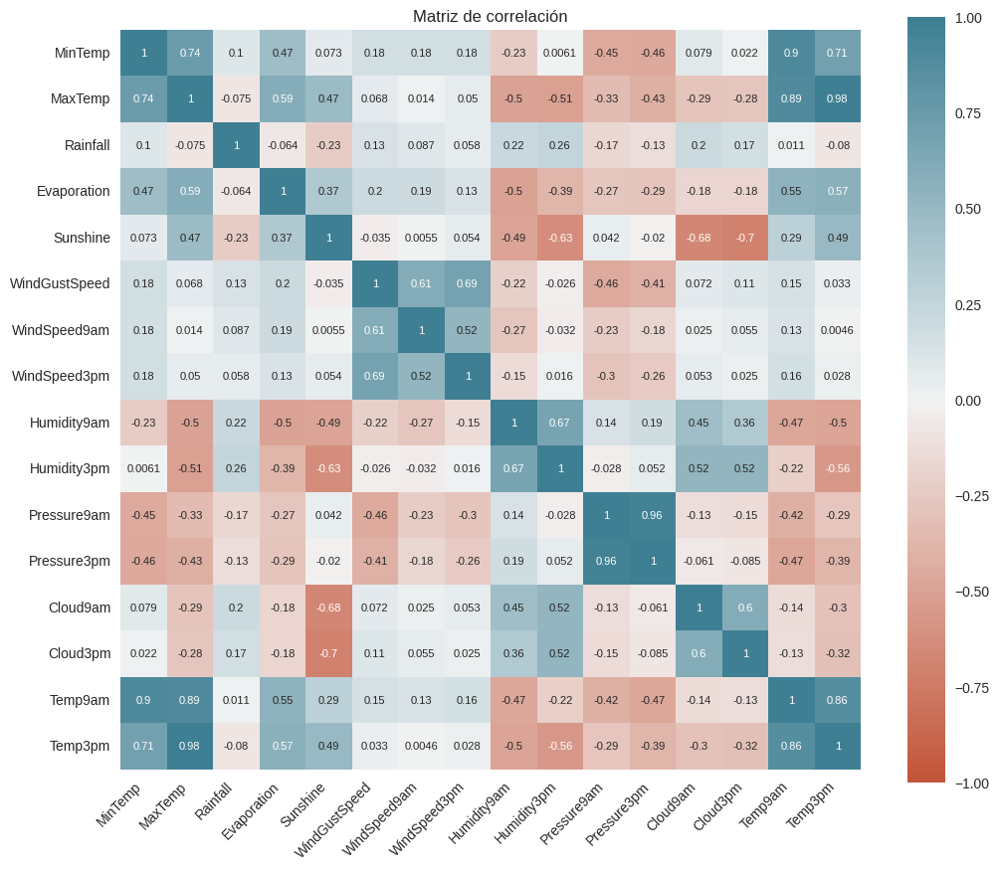

In [8]:
df_num = df.select_dtypes(include=['float64', 'int64'])
# Calcular la matriz de correlación
corr = df_num.corr()
# Crear una figura más grande
plt.figure(figsize=(12, 10))
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True,
    annot_kws = {'size': 8}
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.title('Matriz de correlación')
plt.show()

Realizamos gráficos de dispersión sobre las variables numéricas.

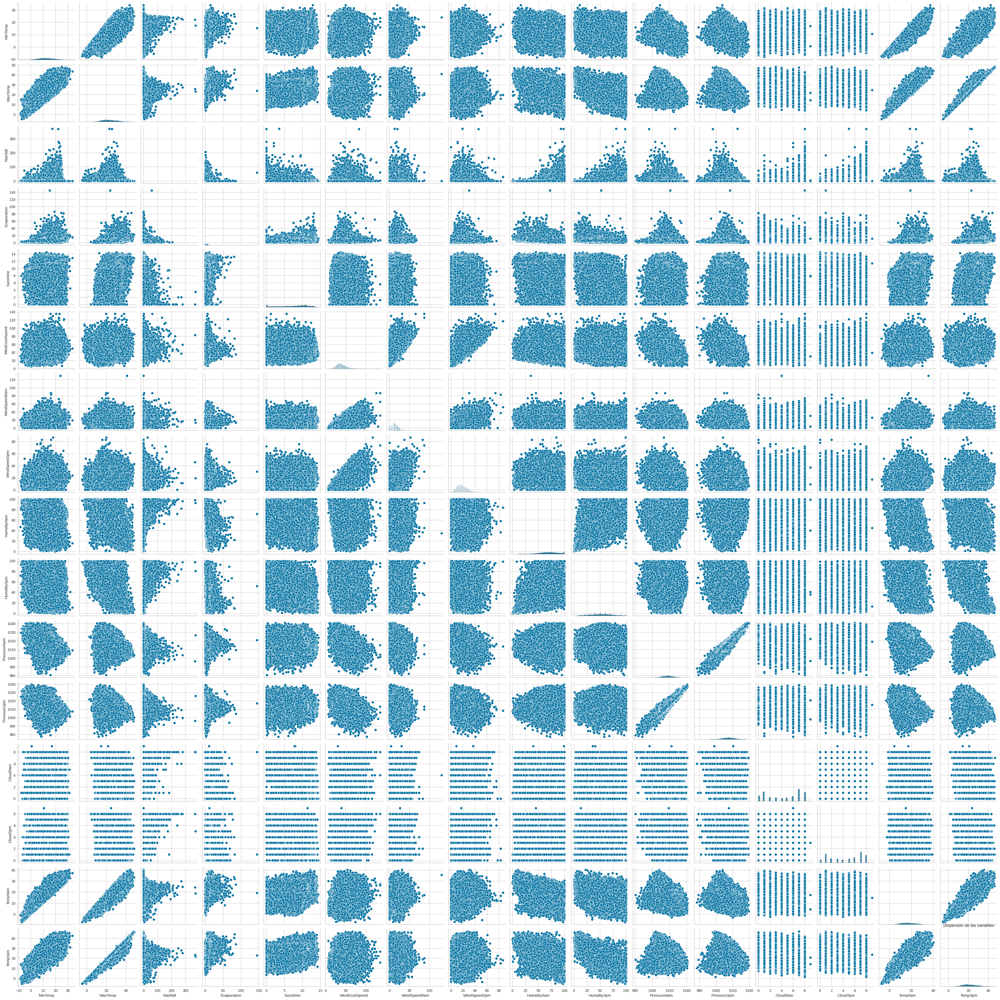

In [9]:
sns.pairplot(df)
plt.title('Dispersión de las variables')
plt.show()

Procedemos a graficar la distribución de las variables categóricas.

In [10]:
# Columnas categóricas
cat_cols = df.select_dtypes(include=['object']).columns
# Excluimos columnas con muchos valores únicos o irrelevantes para visualización categórica
cat_cols_plot = [col for col in cat_cols if col not in ['Date', 'Location', 'RainTomorrow']]

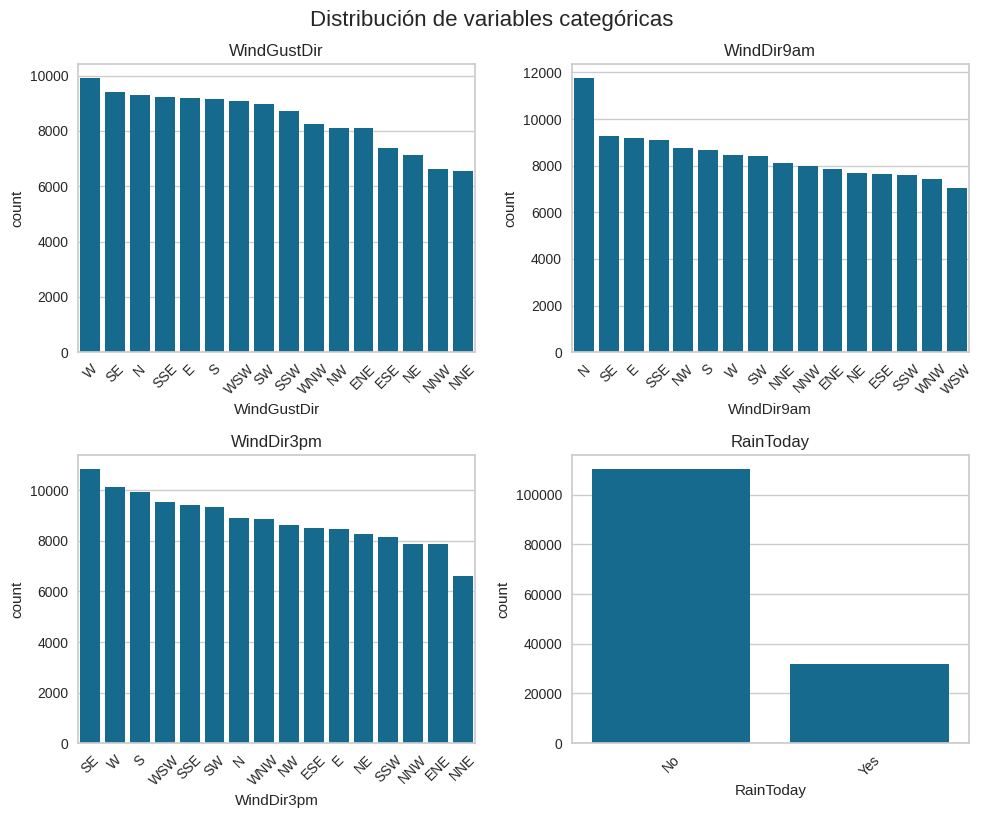

In [11]:
def plot_categorical_distributions(df, cols, cols_per_row=2):
    cat_vars = len(cols)
    rows = math.ceil(cat_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.countplot(x=col, data=df, order=df[col].value_counts().index)
        plt.title(col)
        plt.xticks(rotation=45)
        plt.tight_layout()

    plt.suptitle('Distribución de variables categóricas', fontsize=16, y=1.02)
    plt.show()

plot_categorical_distributions(df, cat_cols_plot)

Procedemos a graficar las variables cuantitativas con relación a la variable target, para ver cómo varía su comportamiento respecto a ella.

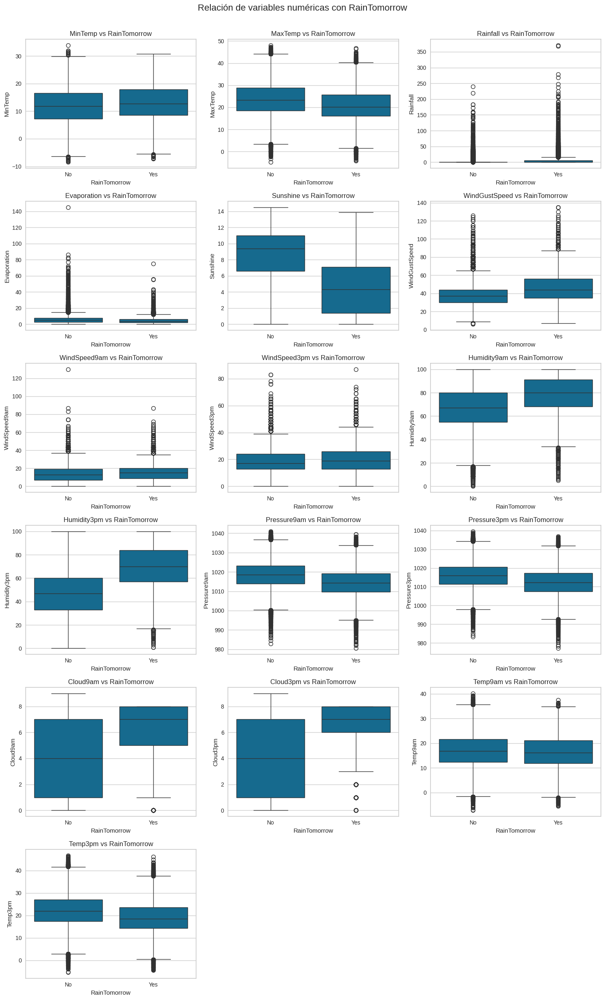

In [12]:
def plot_numeric_vs_target(df, num_cols, target, cols_per_row=3):
    import math
    num_vars = len(num_cols)
    rows = math.ceil(num_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(num_cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.boxplot(x=target, y=col, data=df)
        plt.title(f'{col} vs {target}')
        plt.tight_layout()

    plt.suptitle(f'Relación de variables numéricas con {target}', fontsize=16, y=1.02)
    plt.show()

num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
plot_numeric_vs_target(df, num_cols, 'RainTomorrow')

De estas visualizaciones podemos deducir que las variable relativas a la *humedad*, la *presión* y las *horas de sol* parecen significativas a la hora de determinar si llueve o no al día siguiente.


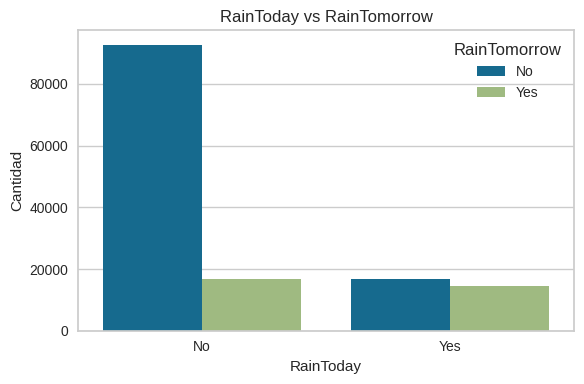

In [13]:
def plot_rain_today_vs_rain_tomorrow(df):
    plt.figure(figsize=(6, 4))
    sns.countplot(x='RainToday', hue='RainTomorrow', data=df, order=df['RainToday'].value_counts().index)
    plt.title('RainToday vs RainTomorrow')
    plt.xlabel('RainToday')
    plt.ylabel('Cantidad')
    plt.legend(title='RainTomorrow')
    plt.tight_layout()
    plt.show()

plot_rain_today_vs_rain_tomorrow(df)

# Preprocesamiento de datos

## Segmentación de datos temporales

In [14]:
df['Date'] = pd.to_datetime(df['Date'], utc=True)

#Extraemos de 'Date' la fecha, el mes y el año.
df['mes'] = df['Date'].dt.month
df['anio'] = df['Date'].dt.year
df['fecha'] = df['Date'].dt.date

df.drop('Date', axis=1, inplace = True)

##Agrupamiento de ciudades por regiones con Clustering espacial - KMeans

Comenzando identificacndo los diferentes valores de la variables *Location*


In [15]:
# Visualizamos los diferentes valores en Location
print(df['Location'].unique())
print(f"Cantidad de ciudades en Australia:", len(df['Location'].unique()))

['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']
Cantidad de ciudades en Australia: 49


Añadimos la información de las coordenadas por ciudad a nuestro dataset.

In [16]:
# Merge de ciudades y coordenadas
df = df.merge(coord_aus, on='Location', how='left')

In [17]:
# Verificamos si hay ciudades sin coordenadas
faltantes = df[df['Latitude'].isna() | df['Longitude'].isna()]['Location'].unique()
print("Ciudades sin coordenadas después del merge:", faltantes)

Ciudades sin coordenadas después del merge: []


In [18]:
df.sample(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,mes,anio,fecha,Latitude,Longitude
30099,Richmond,9.3,20.0,5.4,12.0,NaN,WNW,52.0,NW,W,...,8.0,14.4,17.3,Yes,No,4,2017,2017-04-10,-33.599500,150.742400
123617,Perth,18.0,33.9,0.0,12.6,13.0,SW,37.0,E,SW,...,1.0,26.1,31.8,No,No,11,2016,2016-11-24,-31.950500,115.860500
15545,Newcastle,17.7,25.0,0.0,NaN,NaN,NaN,NaN,NaN,SE,...,6.0,20.5,24.0,No,No,3,2010,2010-03-15,-32.926670,151.778900
57792,Ballarat,7.0,9.7,8.2,NaN,NaN,N,69.0,N,N,...,8.0,7.7,9.5,Yes,Yes,7,2016,2016-07-11,-37.562200,143.850300
48416,Canberra,8.0,22.5,0.0,NaN,NaN,NNE,28.0,E,N,...,NaN,12.7,21.4,No,No,10,2015,2015-10-28,-35.280937,149.130009


Nos disponemos a ubicar cada una de las localidades en el mapa para su mejor
visualización y comprensión.

In [19]:
# Eliminar duplicados para que no repita ciudades
ciudades_unicas = df[['Location', 'Latitude', 'Longitude']].drop_duplicates()

# Crear el scatter plot con Plotly
fig = px.scatter_geo(
    ciudades_unicas,
    lat='Latitude',
    lon='Longitude',
    text='Location',
    title='Distribución geográfica de ciudades en Australia',
    scope='world',
    projection='natural earth'
)
# Centrar y enfocar en Australia
fig.update_geos(
    center=dict(lat=-25, lon=135),
    lataxis_range=[-50, -10],  # Rango de latitudes para enfocarse
    lonaxis_range=[120, 185],  # Rango de longitudes
    showland=True, landcolor="LightGreen"
)

fig.update_traces(marker=dict(size=8, color='blue'))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})

fig.show()


In [20]:
X = ciudades_unicas[['Latitude', 'Longitude']].values

Luego de probar con distintos numeros de clusters, concluímos en que 9 es un número con resultados de agrupamientos óptimo según lo que podemos visualizar en el mapa.

In [21]:
# Aplicamos KMeans para 9 clusters
k = 9
modelo_kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
ciudades_unicas['RegionCluster'] = modelo_kmeans.fit_predict(X)

In [22]:
#Graficamos la clusterización elegida
fig = px.scatter_geo(
    ciudades_unicas,
    lat='Latitude',
    lon='Longitude',
    color='RegionCluster',
    text='Location',
    title='Clusters de ciudades australianas por región geográfica',
    projection='natural earth',
    color_discrete_sequence=px.colors.qualitative.Set2  # o Set3, Pastel1, etc.

)

fig.update_traces(marker=dict(size=8),textposition='top center')

# Centrar y enfocar en Australia
fig.update_geos(
    center=dict(lat=-25, lon=135),
    lataxis_range=[-50, -10],  # Rango de latitudes para enfocarse
    lonaxis_range=[120, 185],  # Rango de longitudes
    showland=True, landcolor="LightGreen"
)

fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()

Agregamos a nuestro dataset la columna RegionCluster y eliminamos Location, Latitud y Longitud.

In [23]:
df = df.merge(ciudades_unicas[['Location', 'RegionCluster']], on='Location', how='left')

In [24]:
df.drop(columns=['Latitude', 'Longitude', 'Location'], inplace=True)

## Division Train-Test

Antes de realizar la división procedemos a eliminar los registros inconsistentes de la variable target.

In [25]:
#Eliminamos nulos de la variable target
df = df.dropna(subset=['RainTomorrow'])

In [26]:
y = df['RainTomorrow'].map({'No': 0, 'Yes': 1})
X = df.drop(columns=['RainTomorrow'], axis=1)
# División estratificada (porque la clase puede estar desbalanceada)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

## Imputacion de valores faltantes

Dividimos las variables en númericas y categóricas.

In [27]:
# Columnas numéricas
num_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Columnas categóricas
cat_cols = X.select_dtypes(include=['object']).columns.tolist()

Visualizamos los valores faltantes de cada variable numerica.

In [28]:
X_train[num_cols].isnull().sum()

,0
MinTemp,513
MaxTemp,258
Rainfall,1131
Evaporation,48695
Sunshine,54344
WindGustSpeed,7440
WindSpeed9am,1082
WindSpeed3pm,2130
Humidity9am,1418
Humidity3pm,2897


Procedemos a visualizar la distribución de las variables numéricas mediante histogramas.

In [29]:
def plot_numeric_distributions(df, cols, cols_per_row=3):
    num_vars = len(cols)
    rows = math.ceil(num_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.histplot(df[col], kde=True, bins=30)
        plt.title(col)
        plt.tight_layout()

    plt.suptitle('Distribución de variables numéricas', fontsize=16, y=1.02)
    plt.show()

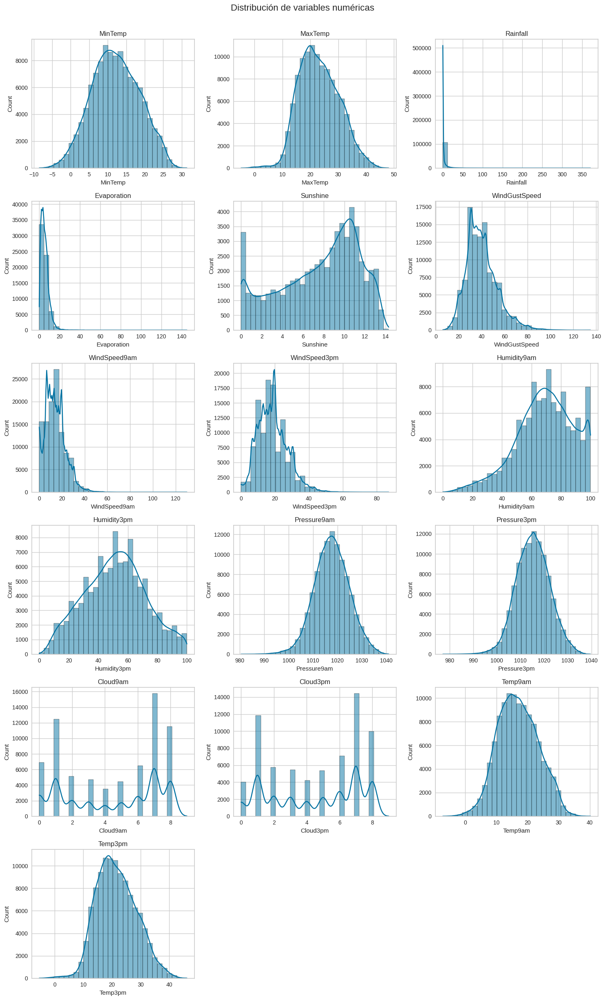

In [30]:
plot_numeric_distributions(X_train, num_cols)

Podemos visualizar que:


*   Las variables Rainfall y Evaporation presentan distribuciones altamente asimétricas, similares a una distribución exponencial, con una gran concentración de valores bajos.
*   Las variables MinTemp, MaxTemp, Temp9am, Temp3pm, Pressure9am, Pressure3pm
presentan distribuciones aproximadamente normal y simétricas.
* WindGustSpeed, WindSpeed9am, WindSpeed3pm presentan distribuciones sesgadas a la derecha.
* La variable Sunshine presenta una distribución bimodal o irregular, con una concentración en dos grupos principales que parecen corresponder a días soleados y nublados.
* Cloud9am, Cloud3pm son variables discretas.
* Humidity9am y Humidity3pm tienen distribuciones irregulares mas cercanas a bimodal y normal respectivamente.


   


Procedemos a imputar los valores faltantes de las variables numericas y continuas, a partir de la ***mediana*** ya que algunas distribuciones están sesgadas. Agrupamos por cluster(región) y por fecha.

In [31]:
# Columnas numéricas excepto las discretas
columnas_num_imputar =  [col for col in num_cols if col not in ['Cloud9am', 'Cloud3pm']]

# Diccionarios para guardar las medianas por grupo calculadas desde X_train
medianas_region_fecha = {}
medianas_region = {}

# Imputación jerárquica
for columna in columnas_num_imputar:
    # IMPUTACIÓN EN X_TRAIN
    # 1. Por RegionCluster + fecha
    X_train[columna] = X_train[columna].fillna(
        X_train.groupby(['RegionCluster', 'fecha'])[columna].transform('median')
    )

    # 2. Por RegionCluster (si sigue habiendo nulos)
    X_train[columna] = X_train[columna].fillna(
        X_train.groupby('RegionCluster')[columna].transform('median')
    )

    # CALCULAR LAS MEDIANAS EN X_TRAIN
    # Para luego usar en imputación de X_test
    medianas_region_fecha[columna] = X_train.groupby(['RegionCluster', 'fecha'])[columna].median()
    medianas_region[columna] = X_train.groupby('RegionCluster')[columna].median()

    # IMPUTACIÓN EN X_TEST
    def imputar_test(row):
        if pd.isna(row[columna]):
            clave1 = (row['RegionCluster'], row['fecha'])
            if clave1 in medianas_region_fecha[columna]:
                return medianas_region_fecha[columna][clave1]
            elif row['RegionCluster'] in medianas_region[columna]:
                return medianas_region[columna][row['RegionCluster']]
            else:
                return np.nan  # si no hay mediana para ese grupo
        else:
            return row[columna]

    X_test[columna] = X_test.apply(imputar_test, axis=1)

X_train[num_cols].isnull().sum()

,0
MinTemp,0
MaxTemp,0
Rainfall,0
Evaporation,0
Sunshine,0
WindGustSpeed,0
WindSpeed9am,0
WindSpeed3pm,0
Humidity9am,0
Humidity3pm,0


Imputamos los valores faltantes de las variables categoricas y discretas a partir de la ***moda***. Agrupamos por cluster(región) y por fecha.


In [32]:
print("Variables antes de la imputacion: ")
X_train[cat_cols].isnull().sum()

Variables antes de la imputacion: 


,0
WindGustDir,7485
WindDir9am,8055
WindDir3pm,3066
RainToday,1131
fecha,0


In [33]:
# Función para calcular modas y hacer imputación eficiente
def imputar_categoricas(X_train, X_test, columnas_cat_imputar):
    def moda_segura(x):
        moda = x.mode()
        if not moda.empty:
            return moda.iloc[0]
        else:
            return np.nan

    X_train = X_train.copy()
    X_test = X_test.copy()

    for col in columnas_cat_imputar:
        # Moda global
        moda_global = moda_segura(X_train[col])

        # Modas por (fecha, RegionCluster)
        modas_fecha_cluster = (
            X_train.groupby(['fecha', 'RegionCluster'])[col]
            .agg(moda_segura)
            .rename('moda_fecha_cluster')
            .reset_index()
        )

        # Modas por RegionCluster
        modas_cluster = (
            X_train.groupby('RegionCluster')[col]
            .agg(moda_segura)
            .rename('moda_cluster')
            .reset_index()
        )

        # Imputación en X_train

        X_train = X_train.merge(modas_fecha_cluster, how='left', on=['fecha', 'RegionCluster'])
        X_train = X_train.merge(modas_cluster, how='left', on='RegionCluster')

        X_train[col] = X_train[col].fillna(X_train['moda_fecha_cluster'])
        X_train[col] = X_train[col].fillna(X_train['moda_cluster'])
        X_train[col] = X_train[col].fillna(moda_global)

        X_train.drop(columns=['moda_fecha_cluster', 'moda_cluster'], inplace=True)

        # Imputación en X_test

        X_test = X_test.merge(modas_fecha_cluster, how='left', on=['fecha', 'RegionCluster'])
        X_test = X_test.merge(modas_cluster, how='left', on='RegionCluster')

        X_test[col] = X_test[col].fillna(X_test['moda_fecha_cluster'])
        X_test[col] = X_test[col].fillna(X_test['moda_cluster'])
        X_test[col] = X_test[col].fillna(moda_global)

        X_test.drop(columns=['moda_fecha_cluster', 'moda_cluster'], inplace=True)

    return X_train, X_test

# Columnas categóricas a imputar
columnas_cat_imputar = cat_cols + ['Cloud9am', 'Cloud3pm']

# Ejecutar imputación
X_train, X_test = imputar_categoricas(X_train, X_test, columnas_cat_imputar)

# Mostrar resultados
print("Valores faltantes en X_train luego de la imputación categórica:")
print(X_train[columnas_cat_imputar].isnull().sum())

print("\nValores faltantes en X_test luego de la imputación categórica:")
print(X_test[columnas_cat_imputar].isnull().sum())

Valores faltantes en X_train luego de la imputación categórica:
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
fecha          0
Cloud9am       0
Cloud3pm       0
dtype: int64

Valores faltantes en X_test luego de la imputación categórica:
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
fecha          0
Cloud9am       0
Cloud3pm       0
dtype: int64


## Tratamiento de Outliers


Procederemos a imputar todos lo valores que sean físicamente imposibles o que se encuentren por fuera de los máximos y mínimos valores históricos registrados.

In [34]:
intervals = {
    'MinTemp': [-23, 50.7],
    'MaxTemp': [-23, 50.7],
    'Rainfall': [0, 907],
    'Evaporation': [0, 100],
    'Sunshine': [0, 16],
    'WindGustSpeed': [0, 408],
    'WindSpeed9am': [0, 408],
    'WindSpeed3pm': [0, 408],
    'Humidity9am': [0, 100],
    'Humidity3pm': [0, 100],
    'Pressure9am': [870, 1045],
    'Pressure3pm': [870, 1045],
    'Temp9am': [-23, 50.7],
    'Temp3pm': [-23, 50.7]
}

def cap_outliers_with_median(X, intervals, ref_data=None):
    """
    Imputa valores fuera de los límites usando la mediana.

    Parámetros:
    - X: DataFrame a imputar (X_train o X_test).
    - intervals: diccionario con los límites por variable.
    - ref_data: DataFrame para calcular la mediana (por ejemplo, X_train). Si es None, se usa X.
    """
    if ref_data is None:
        ref_data = X

    X_imputed = X.copy()

    for col, (low, high) in intervals.items():
        median = ref_data[col].median()
        X_imputed[col + '_cap'] = np.where(
            X[col] > high, median,
            np.where(X[col] < low, median, X[col])
        )

    return X_imputed

# Imputar train (usa sus propias medianas)
X_train_imputed = cap_outliers_with_median(X_train, intervals)

# Imputar test usando medianas de train
X_test_imputed = cap_outliers_with_median(X_test, intervals, ref_data=X_train)


Procedemos a visualizar la distribución y presencia de valores atípicos en las variables numéricas mediante un gráfico de boxplot.

In [35]:
def plot_boxplots(x, cols, cols_per_row=3):
    num_vars = len(cols)
    rows = math.ceil(num_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.boxplot(x=x[col])
        plt.title(col)
        plt.tight_layout()

    plt.suptitle('Boxplots de variables numéricas', fontsize=16, y=1.02)
    plt.show()


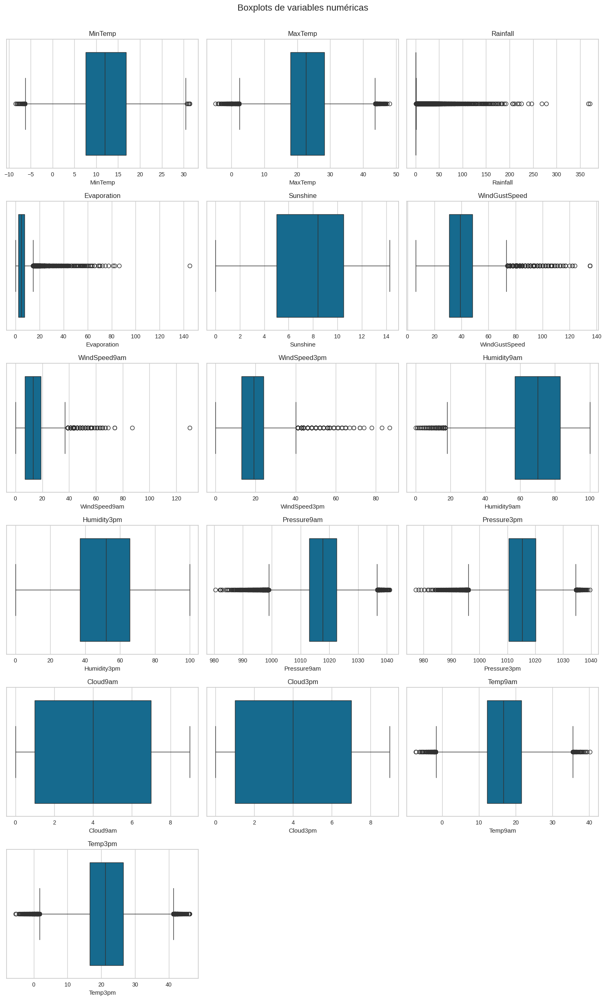

In [36]:
plot_boxplots(X_train, num_cols)

Aplicamos una transformación logarítmica sobre las variables que poseen valores atípicos y una distribución sesgada a la derecha.

In [37]:
# Variables con valores > 0 → aplicar log
vars_log = ['WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm']

for col in vars_log:
    X_train[col + '_log'] = np.log1p(X_train[col])
    X_test[col + '_log'] = np.log1p(X_test[col])

Transformamos el resto de las variables con valores atípicos, que no tienen un comportamiento exponencial, mediante *capping*. También realizamos la misma transformación sobre las variables a las que le aplicamos transformación logarítmica para comparar resultados más adelante.

In [38]:
def calcular_limites_iqr(X, columnas):
    limites = {}
    for col in columnas:
        q1 = X[col].quantile(0.25)
        q3 = X[col].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        limites[col] = (lower, upper)
    return limites

def aplicar_capping(X, limites):
    X_capped = X.copy()
    for col, (lower, upper) in limites.items():
        X_capped[col + '_cap'] = np.where(
            X[col] > upper, upper,
            np.where(X[col] < lower, lower, X[col])
        )
    return X_capped

def imprimir_limites(limites):
    print("\nLímites de capping por IQR:")
    for col, (lower, upper) in limites.items():
        print(f"  {col}: Lower = {lower:.2f}, Upper = {upper:.2f}")

In [39]:
# Variables a tratar
vars_cap = ['Temp9am', 'Temp3pm', 'Pressure9am', 'Pressure3pm', 'Humidity9am',
            'MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm']

# Calcular límites con X_train
limites_iqr = calcular_limites_iqr(X_train, vars_cap)

# Aplicar capping
X_train = aplicar_capping(X_train, limites_iqr)
X_test = aplicar_capping(X_test, limites_iqr)

# Imprimir los límites
imprimir_limites(limites_iqr)


Límites de capping por IQR:
  Temp9am: Lower = -1.65, Upper = 35.55
  Temp3pm: Lower = 1.75, Upper = 41.35
  Pressure9am: Lower = 999.00, Upper = 1036.60
  Pressure3pm: Lower = 996.10, Upper = 1034.50
  Humidity9am: Lower = 18.00, Upper = 122.00
  MinTemp: Lower = -6.20, Upper = 30.60
  MaxTemp: Lower = 2.45, Upper = 43.65
  WindGustSpeed: Lower = 5.50, Upper = 73.50
  WindSpeed9am: Lower = -11.00, Upper = 37.00
  WindSpeed3pm: Lower = -3.50, Upper = 40.50


Debido a la distribución observada en las variables Rainfall y Evaporation, tomamos la desición de categorizarlas.

In [40]:
X_train['Rainfall'].describe(percentiles=[.25, .5, .75])

,Rainfall
count,113754.000000
mean,2.359334
std,8.531676
min,0.000000
25%,0.000000
50%,0.000000
75%,0.600000
max,371.000000


In [41]:
X_train['Rainfall_cat'] = pd.cut(
    X_train['Rainfall'],
    bins=[-float('inf'), 10, 30, float('inf')],
    labels=['bajo', 'medio', 'alto']
)
X_test['Rainfall_cat'] = pd.cut(
    X_test['Rainfall'],
    bins=[-float('inf'), 10, 30, float('inf')],
    labels=['bajo', 'medio', 'alto']
)

In [42]:
X_train['Evaporation'].describe(percentiles=[.25, .5, .75])

,Evaporation
count,113754.000000
mean,5.407129
std,3.879473
min,0.000000
25%,2.600000
50%,4.700000
75%,7.400000
max,145.000000


In [43]:
X_train['Evaporation_cat'] = pd.cut(
    X_train['Evaporation'],
    bins=[-float('inf'), 3, 7, float('inf')],
    labels=['bajo', 'medio', 'alto']
)
X_test['Evaporation_cat'] = pd.cut(
    X_test['Evaporation'],
    bins=[-float('inf'), 3, 7, float('inf')],
    labels=['bajo', 'medio', 'alto']
)

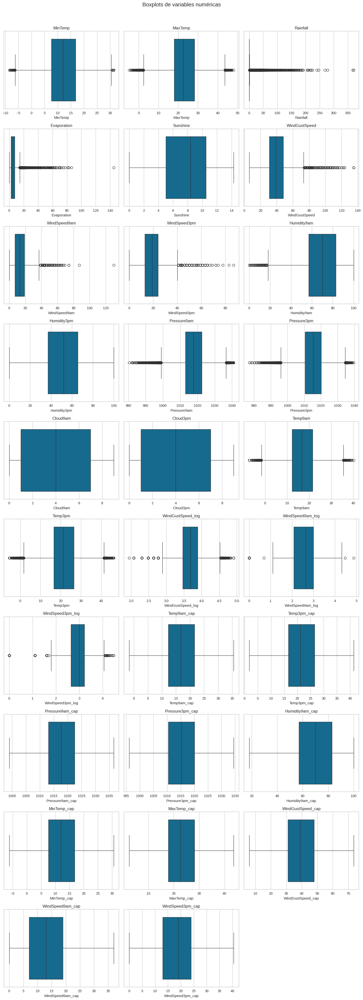

In [44]:
#volvemos a definir num_cols para que incluya las columnas transformadas
num_cols_transf = X_train.select_dtypes(include=['float64', 'int64']).columns
plot_boxplots(X_train, num_cols_transf)

Analizamos la distribución de las variables numéricas luego del tratamiento de outliers.

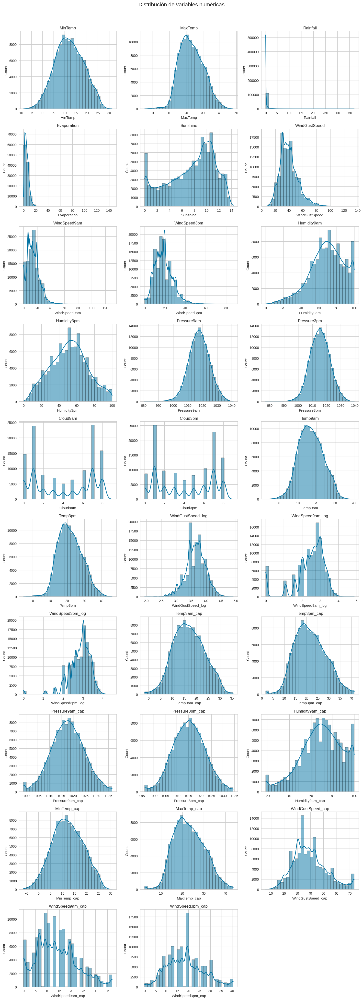

In [45]:
plot_numeric_distributions(X_train, num_cols_transf)

Viendo los gráficos podemos comparar los distintos resultados de aplicar transformaciones a las variables originales y tomar desiciones sobre que variables utilizar para entrenar el modelo.

## Estandarizacion y Codificación

In [46]:
# Mapeo de direcciones a grados
wind_dir_map = {
    'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5, 'E': 90,
    'ESE': 112.5, 'SE': 135, 'SSE': 157.5, 'S': 180, 'SSW': 202.5,
    'SW': 225, 'WSW': 247.5, 'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
}

# Convertir direcciones a grados a grados
X_train['WindGustDir_degrees'] = X_train['WindGustDir'].map(wind_dir_map)
X_test['WindGustDir_degrees'] = X_test['WindGustDir'].map(wind_dir_map)
X_train['WindDir9am_degrees'] = X_train['WindDir9am'].map(wind_dir_map)
X_test['WindDir9am_degrees'] = X_test['WindDir9am'].map(wind_dir_map)
X_train['WindDir3pm_degrees'] = X_train['WindDir3pm'].map(wind_dir_map)
X_test['WindDir3pm_degrees'] = X_test['WindDir3pm'].map(wind_dir_map)

# Codificación cíclica para WindGustDir
X_train['WindGustDir_sin'] = np.sin(2 * np.pi * X_train['WindGustDir_degrees'] / 360)
X_train['WindGustDir_cos'] = np.cos(2 * np.pi * X_train['WindGustDir_degrees'] / 360)

X_test['WindGustDir_sin'] = np.sin(2 * np.pi * X_test['WindGustDir_degrees'] / 360)
X_test['WindGustDir_cos'] = np.cos(2 * np.pi * X_test['WindGustDir_degrees'] / 360)

# Codificación cíclica para WindDir9am
X_train['WindDir9am_sin'] = np.sin(2 * np.pi * X_train['WindDir9am_degrees'] / 360)
X_train['WindDir9am_cos'] = np.cos(2 * np.pi * X_train['WindDir9am_degrees'] / 360)

X_test['WindDir9am_sin'] = np.sin(2 * np.pi * X_test['WindDir9am_degrees'] / 360)
X_test['WindDir9am_cos'] = np.cos(2 * np.pi * X_test['WindDir9am_degrees'] / 360)

# Codificación cíclica para WindDir3pm
X_train['WindDir3pm_sin'] = np.sin(2 * np.pi * X_train['WindDir3pm_degrees'] / 360)
X_train['WindDir3pm_cos'] = np.cos(2 * np.pi * X_train['WindDir3pm_degrees'] / 360)

X_test['WindDir3pm_sin'] = np.sin(2 * np.pi * X_test['WindDir3pm_degrees'] / 360)
X_test['WindDir3pm_cos'] = np.cos(2 * np.pi * X_test['WindDir3pm_degrees'] / 360)

# Codificación cíclica para mes
X_train['mes_sin'] = np.sin(2 * np.pi * X_train['mes'] / 12)
X_train['mes_cos'] = np.cos(2 * np.pi * X_train['mes'] / 12)

X_test['mes_sin'] = np.sin(2 * np.pi * X_test['mes'] / 12)
X_test['mes_cos'] = np.cos(2 * np.pi * X_test['mes'] / 12)

Observamos la información de las variables resultantes.

In [47]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113754 entries, 0 to 113753
Data columns (total 50 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   MinTemp              113754 non-null  float64 
 1   MaxTemp              113754 non-null  float64 
 2   Rainfall             113754 non-null  float64 
 3   Evaporation          113754 non-null  float64 
 4   Sunshine             113754 non-null  float64 
 5   WindGustDir          113754 non-null  object  
 6   WindGustSpeed        113754 non-null  float64 
 7   WindDir9am           113754 non-null  object  
 8   WindDir3pm           113754 non-null  object  
 9   WindSpeed9am         113754 non-null  float64 
 10  WindSpeed3pm         113754 non-null  float64 
 11  Humidity9am          113754 non-null  float64 
 12  Humidity3pm          113754 non-null  float64 
 13  Pressure9am          113754 non-null  float64 
 14  Pressure3pm          113754 non-null  float64 
 15  

Eliminamos las variables que no va a utilizar el modelo.

In [48]:
X_train.drop(columns=['WindGustDir_degrees','WindGustDir','WindDir9am','WindDir9am_degrees','WindDir3pm','WindDir3pm_degrees', 'mes',
                      'Evaporation', 'Rainfall', 'fecha', 'MinTemp', 'MaxTemp','WindGustSpeed','WindSpeed9am',
                      'WindSpeed3pm', 'Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm', 'WindGustSpeed_log',
                      'WindSpeed9am_log', 'WindSpeed3pm_log'], inplace=True)
X_test.drop(columns=['WindGustDir_degrees','WindGustDir','WindDir9am','WindDir9am_degrees','WindDir3pm','WindDir3pm_degrees', 'mes',
                      'Evaporation', 'Rainfall', 'fecha', 'MinTemp', 'MaxTemp','WindGustSpeed','WindSpeed9am',
                      'WindSpeed3pm', 'Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm', 'WindGustSpeed_log',
                      'WindSpeed9am_log', 'WindSpeed3pm_log'], inplace=True)

In [49]:
onehot_cols = ['Rainfall_cat', 'Evaporation_cat', 'RegionCluster']
binary_cols = ['RainToday']

In [50]:
# Redefinimos nuestras columnas numéricas para realizar el escalado posterior
# Columnas numéricas
num_cols = [
    'Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio',
    'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap',
    'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap',
    'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap'
]


In [51]:
print(num_cols)

['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap']


In [52]:
print("Columnas en X_train:", list(X_train.columns))

print("num_cols:", num_cols)
print("onehot_cols:", onehot_cols)
print("binary_cols:", binary_cols)

for col_list in [num_cols, onehot_cols, binary_cols]:
    for col in col_list:
        if col not in X_train.columns:
            print(f"ERROR: Columna '{col}' no está en X_train")


Columnas en X_train: ['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'RainToday', 'anio', 'RegionCluster', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap', 'Rainfall_cat', 'Evaporation_cat', 'WindGustDir_sin', 'WindGustDir_cos', 'WindDir9am_sin', 'WindDir9am_cos', 'WindDir3pm_sin', 'WindDir3pm_cos', 'mes_sin', 'mes_cos']
num_cols: ['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap']
onehot_cols: ['Rainfall_cat', 'Evaporation_cat', 'RegionCluster']
binary_cols: ['RainToday']


Realizamos el escalado de las variables numéricas.

In [53]:
# Crear el preprocesador
preprocesador = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'), onehot_cols),
    ('binary', OrdinalEncoder(), binary_cols)
])

# Modelado

Chequeamos los datos finales con los que entrenaremos nuestro modelo.

In [54]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113754 entries, 0 to 113753
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   Sunshine           113754 non-null  float64 
 1   Humidity3pm        113754 non-null  float64 
 2   Cloud9am           113754 non-null  float64 
 3   Cloud3pm           113754 non-null  float64 
 4   RainToday          113754 non-null  object  
 5   anio               113754 non-null  int32   
 6   RegionCluster      113754 non-null  int32   
 7   Temp9am_cap        113754 non-null  float64 
 8   Temp3pm_cap        113754 non-null  float64 
 9   Pressure9am_cap    113754 non-null  float64 
 10  Pressure3pm_cap    113754 non-null  float64 
 11  Humidity9am_cap    113754 non-null  float64 
 12  MinTemp_cap        113754 non-null  float64 
 13  MaxTemp_cap        113754 non-null  float64 
 14  WindGustSpeed_cap  113754 non-null  float64 
 15  WindSpeed9am_cap   113754 non-null

In [55]:
X_test.isnull().sum()

,0
Sunshine,0
Humidity3pm,0
Cloud9am,0
Cloud3pm,0
RainToday,0
anio,0
RegionCluster,0
Temp9am_cap,0
Temp3pm_cap,0
Pressure9am_cap,0


In [56]:
print("num_cols:", num_cols)


num_cols: ['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap']


Realizamos el modelado con **Regresión Logística**

In [57]:
X_test_original = X_test.copy()
X_train_original = X_train.copy()
Y_train_original = y_train.copy()
Y_test_original = y_test.copy()

In [58]:
# Creación del pipeline con el modelo de regresion lineal
# Pipeline con regularización aplicando Ridge
pipeline = Pipeline([
    ('preprocesamiento', preprocesador),
    ('model', LogisticRegression(penalty='l2', random_state=42))
])


# Fitteo y prediccion del modelo
pipeline.fit(X_train, y_train)

# Predicciones en el conjunto de prueba
y_pred = pipeline.predict(X_test)


In [59]:
print(y_pred)

[0 1 0 ... 0 1 0]


# Evaluación del modelo

Realizamos la matriz de confusión del modelo entrenado.

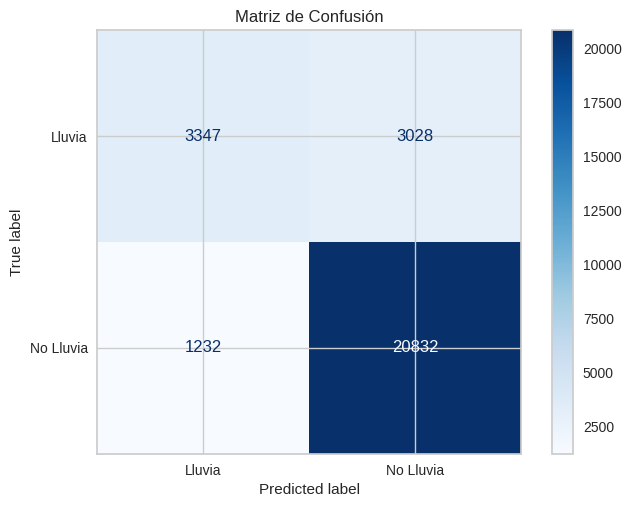

In [60]:
# Probabilidades para clase 1 (lluvia)
y_scores = pipeline.predict_proba(X_test)[:, 1]

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred, labels=[1, 0])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Lluvia', 'No Lluvia'])
disp.plot(cmap='Blues')
plt.title('Matriz de Confusión')
plt.show()

## Métricas

Dado que nuestros datos se encuentran desbalanceados descartamos la posibilidad de aplicar Accuracy. Utilizaremos las métricas de Recall, Precisión y F1 como combinación de ellas para evaluar ambas clases. Específicamente buscaremos minimizar los FN, es decir, la predicción de que no llovía cuando sí llovió. Para esto, le daremos mayor importancia a la métrica de Recall de la clase 1 (Sí llovió) que representa cuantos de los días en los que si llovió fueron detectados correctamente por la predicción del modelo.


In [61]:
def matriz_de_confusion(clases_reales, clases_predichas, titulo):
    """ Visualiza la matriz de confusión con métrica personalizada """
    matriz = confusion_matrix(clases_reales, clases_predichas)

    # Cálculo de precision y recall
    recall = recall_score(clases_reales, clases_predichas, pos_label=1)
    precision = precision_score(clases_reales, clases_predichas, pos_label=1)
    # Métrica personalizada
    metrica = (2 * recall + precision) / 3

    matriz = pd.DataFrame(matriz,
                          columns=["0 : No llueve", "1 : Llueve"],
                          index=["0 : No llueve", "1 : Llueve"])

    plt.figure(figsize=(4, 4))
    plt.matshow(matriz.values, cmap="Blues", vmin=0, vmax=20000)
    plt.xticks(range(len(matriz.columns)), matriz.columns, rotation=45)
    plt.yticks(range(len(matriz.index)), matriz.index)

    etiquetas = (("Verdaderos\nnegativos", "Falsos\npositivos"),
                 ("Falsos\nnegativos", "Verdaderos\npositivos"))

    plt.text(1.60, -0.30, titulo, fontsize=25, c="red")
    plt.text(2.1, 0.10, f"Métrica custom: {metrica:.2f}", fontsize=15, color="blue")
    

    for i in range(len(matriz.columns)):
        for j in range(len(matriz.columns)):
            plt.text(i, j + 0.14, str(matriz.iloc[j, i]),
                     fontsize=30, ha="center", va="center")
            plt.text(i, j - 0.25, etiquetas[j][i],
                     fontsize=11.5, ha="center", va="center")
    plt.show()

In [62]:
# Métricas de evaluación
precision = precision_score(y_test, y_pred, pos_label=1)
recall = recall_score(y_test, y_pred, pos_label=1)
f1 = f1_score(y_test, y_pred, pos_label=1)
# Cálculo de métrica personalizada
custom_metric = (2 * recall + precision) / 3

print(f"\n Métricas del modelo:")
print(f"Precision: {precision:.2f}")
print(f"Recall   : {recall:.2f}  ← Buscamos maximizarla, por importancia de los FN")
print(f"F1-score : {f1:.2f}")
print(f"Métrica custom : {custom_metric:.2f}   ← (2*recall+precision)/3")


print("\n Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=['No Lluvia', 'Lluvia']))



 Métricas del modelo:
Precision: 0.73
Recall   : 0.53  ← Buscamos maximizarla, por importancia de los FN
F1-score : 0.61
Métrica custom : 0.59   ← (2*recall+precision)/3

 Reporte de clasificación:
              precision    recall  f1-score   support

   No Lluvia       0.87      0.94      0.91     22064
      Lluvia       0.73      0.53      0.61      6375

    accuracy                           0.85     28439
   macro avg       0.80      0.73      0.76     28439
weighted avg       0.84      0.85      0.84     28439



Calculamos las métricas de entrenamiento para analizar el fitting del modelo.

In [63]:
y_pred_train = pipeline.predict(X_train)
# Métricas de evaluación
precision = precision_score(y_train, y_pred_train, pos_label=1)
recall = recall_score(y_train, y_pred_train, pos_label=1)
f1 = f1_score(y_train, y_pred_train, pos_label=1)
custom_metric = (2 * recall + precision) / 3

print(f"\n Métricas del modelo (para los datos de entrenamiento):")
print(f"Precision: {precision:.2f}")
print(f"Recall   : {recall:.2f}")
print(f"F1-score : {f1:.2f}")
print(f"Métrica custom : {custom_metric:.2f}   ← (2*recall+precision)/3")

print("\n Reporte de clasificación:")
print(classification_report(y_train, y_pred_train, target_names=['No Lluvia', 'Lluvia']))


 Métricas del modelo (para los datos de entrenamiento):
Precision: 0.72
Recall   : 0.52
F1-score : 0.61
Métrica custom : 0.59   ← (2*recall+precision)/3

 Reporte de clasificación:
              precision    recall  f1-score   support

   No Lluvia       0.87      0.94      0.91     88252
      Lluvia       0.72      0.52      0.61     25502

    accuracy                           0.85    113754
   macro avg       0.80      0.73      0.76    113754
weighted avg       0.84      0.85      0.84    113754



Notamos que las métricas son similares en train y test por lo tanto deducimos que no hay Overfitting.

Probamos con un umbral menor (0.3) con el objetivo de aumentar el recall de la clase 1 (lluvia).

In [64]:
# Elegir un nuevo umbral
umbral = 0.3

# Aplicar el nuevo umbral para obtener las predicciones ajustadas
y_pred_umbral = (y_scores >= umbral).astype(int)


In [65]:
# Métricas con nuevo umbral
print(confusion_matrix(y_test, y_pred_umbral))
print(classification_report(y_test, y_pred_umbral, target_names=['No Lluvia', 'Lluvia']))
# Métrica personalizada
recall = recall_score(y_test, y_pred_umbral, pos_label=1)
precision = precision_score(y_test, y_pred_umbral, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")

[[19001  3063]
 [ 1851  4524]]
              precision    recall  f1-score   support

   No Lluvia       0.91      0.86      0.89     22064
      Lluvia       0.60      0.71      0.65      6375

    accuracy                           0.83     28439
   macro avg       0.75      0.79      0.77     28439
weighted avg       0.84      0.83      0.83     28439

Métrica custom (2*recall + precision)/3: 0.67


Podemos observar como mejora nuestra métrica de 0.59 a 0.67.

## Curva ROC

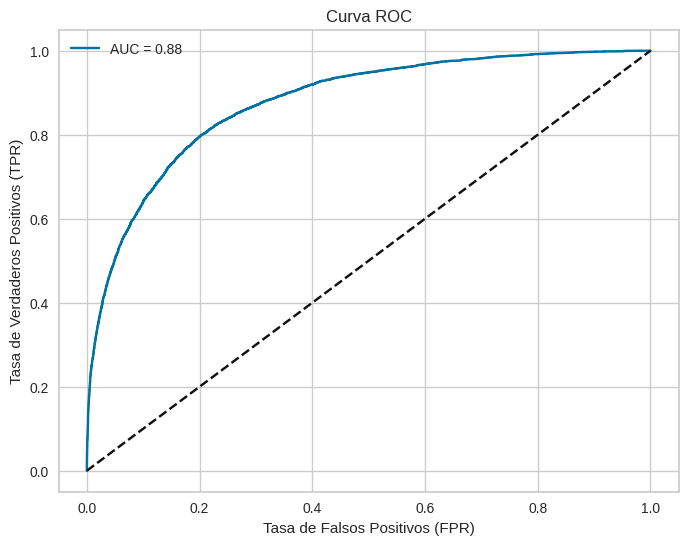

In [66]:
# Curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y_test, y_scores):.2f}')
plt.plot([0, 1], [0, 1], 'k--')  # Línea aleatoria
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend()
plt.grid(True)
plt.show()

Probamos con el umbral óptimo, obtenido del punto de la curva ROC más cercano al vértice superior izquierdo, con el objetivo de equilibrar la tasa de verdaderos positivos y falsos positivos.

In [67]:
# y_scores  son las probabilidades para clase 1
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

# Calcular distancia al punto (0,1) para cada umbral
distancias = np.sqrt((fpr - 0)**2 + (tpr - 1)**2)

# Índice del umbral óptimo
idx_optimo = np.argmin(distancias)

# Umbral óptimo
umbral_optimo = thresholds[idx_optimo]

print(f" Umbral óptimo según curva ROC: {umbral_optimo:.2f}")

 Umbral óptimo según curva ROC: 0.22


<Figure size 400x400 with 0 Axes>

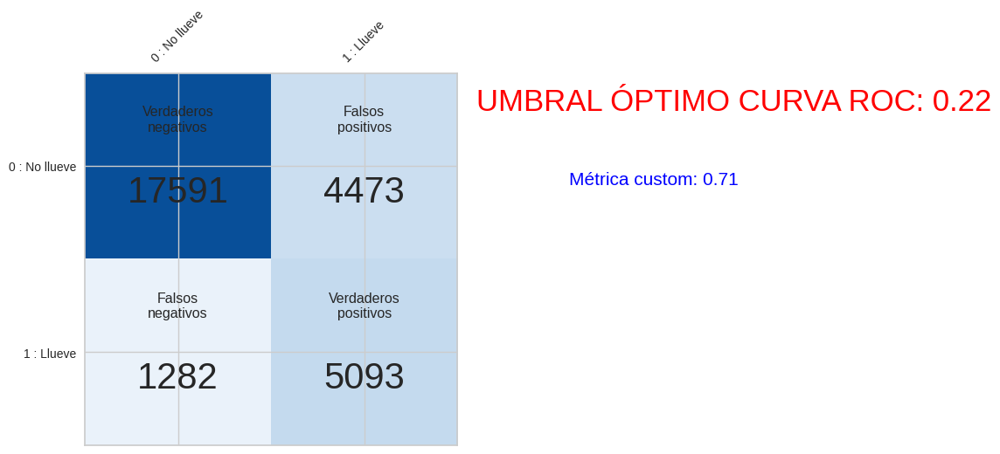

              precision    recall  f1-score   support

   No Lluvia       0.93      0.80      0.86     22064
      Lluvia       0.53      0.80      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439



In [68]:
# Aplicar el umbral óptimo
y_pred_optimo = (y_scores >= umbral_optimo).astype(int)

# Evaluar desempeño
matriz_de_confusion(y_test, y_pred_optimo, "UMBRAL ÓPTIMO CURVA ROC: 0.22")
print(classification_report(y_test, y_pred_optimo, target_names=['No Lluvia', 'Lluvia']))


Podemos observar como mejora nuestra métrica a 0.71.

Probamos disminuyendo el umbral a 0.18.

In [69]:
# Elegir un nuevo umbral
umbral = 0.14

# Aplicar el nuevo umbral para obtener las predicciones ajustadas
y_pred_umbral = (y_scores >= umbral).astype(int)

<Figure size 400x400 with 0 Axes>

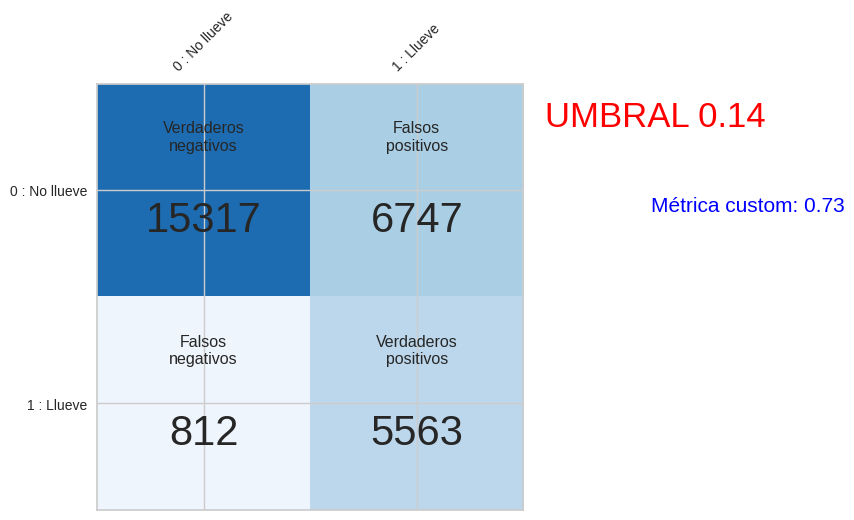

              precision    recall  f1-score   support

   No Lluvia       0.95      0.69      0.80     22064
      Lluvia       0.45      0.87      0.60      6375

    accuracy                           0.73     28439
   macro avg       0.70      0.78      0.70     28439
weighted avg       0.84      0.73      0.76     28439



In [70]:
# Métricas con nuevo umbral
matriz_de_confusion(y_test, y_pred_umbral, "UMBRAL 0.14")
print(classification_report(y_test, y_pred_umbral, target_names=['No Lluvia', 'Lluvia']))

Observamos un valor superior de nuestra métrica en 0.73.

# Tratamiento de desbalanceo

Observamos cómo es la distribución de nuestros datos según la clase.

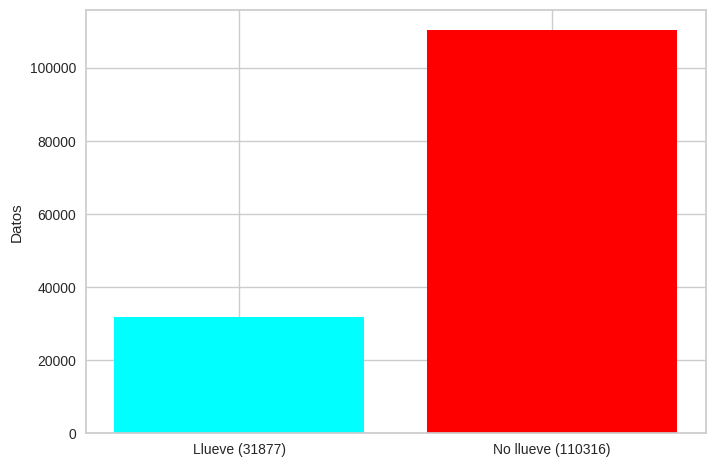

In [71]:
llueve = len(y[y == 1])
no_llueve = len(y[y == 0])

plt.bar(["Llueve (%d)" % llueve, "No llueve (%d)" % no_llueve],
        [llueve, no_llueve],
        color =["cyan", "red"],
        width = 0.8)
plt.ylabel("Datos")
plt.show()

Se observa un gran desbalanceo que puede ocasionar inconvenientes en las predicciones.

In [72]:
pipeline_balanceado = Pipeline(steps=[
    ('preprocesamiento', preprocesador),
    ('model',  LogisticRegression(random_state=42, class_weight='balanced'))
])

# Fitteo y prediccion del modelo
pipeline_balanceado.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_balanceado = pipeline_balanceado.predict(X_test)

# Obtengo las probabilidades de predicción del modelo
y_probs_balanceado = pipeline_balanceado.predict_proba(X_test)[:, 0]

# Evaluar
print("Resultados regresión logística con balanceo:\n")
print(classification_report(y_test, y_pred_balanceado))
# Métrica personalizada
recall = recall_score(y_test, y_pred_balanceado, pos_label=1)
precision = precision_score(y_test, y_pred_balanceado, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")

Resultados regresión logística con balanceo:

              precision    recall  f1-score   support

           0       0.93      0.80      0.86     22064
           1       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Métrica custom (2*recall + precision)/3: 0.71


## Oversampling

Remuestreo con oversampling

In [73]:
# Crear el pipeline completo con preprocesamiento y oversampling
pipeline_oversampled = ImbPipeline(steps=[
    ('preprocesamiento', preprocesador),
    ('oversample', RandomOverSampler(random_state=42)),
    ('modelo', LogisticRegression(random_state=42))
])

# Entrenar con el pipeline
pipeline_oversampled.fit(X_train, y_train)

# Predecir
y_pred_ov = pipeline_oversampled.predict(X_test)

# Evaluar
print("Resultados regresión logística con Oversampling:\n")
print(classification_report(y_test, y_pred_ov))

# Métrica personalizada
recall = recall_score(y_test, y_pred_ov, pos_label=1)
precision = precision_score(y_test, y_pred_ov, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")


Resultados regresión logística con Oversampling:

              precision    recall  f1-score   support

           0       0.93      0.80      0.86     22064
           1       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Métrica custom (2*recall + precision)/3: 0.71


## Smote

In [74]:
# Pipeline completo con preprocesamiento y SMOTE
pipeline_smote = ImbPipeline(steps=[
    ('preprocesamiento', preprocesador),   # ColumnTransformer con OneHotEncoder y StandardScaler
    ('smote', SMOTE(random_state=42)),     # aplicamos SMOTE después del preprocesamiento
    ('modelo', LogisticRegression(random_state=42))
])

# Entrenar el pipeline
pipeline_smote.fit(X_train, y_train)

# Predecir sobre el test (se preprocesa igual que el train)
y_pred_smote = pipeline_smote.predict(X_test)

# Evaluar
print("Resultados regresión logística con SMOTE:\n")
print(classification_report(y_test, y_pred_smote))

# Métrica personalizada
recall = recall_score(y_test, y_pred_smote, pos_label=1)
precision = precision_score(y_test, y_pred_smote, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")

Resultados regresión logística con SMOTE:

              precision    recall  f1-score   support

           0       0.93      0.81      0.86     22064
           1       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.74      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Métrica custom (2*recall + precision)/3: 0.71


## Comparación de matrices de confusion

<Figure size 400x400 with 0 Axes>

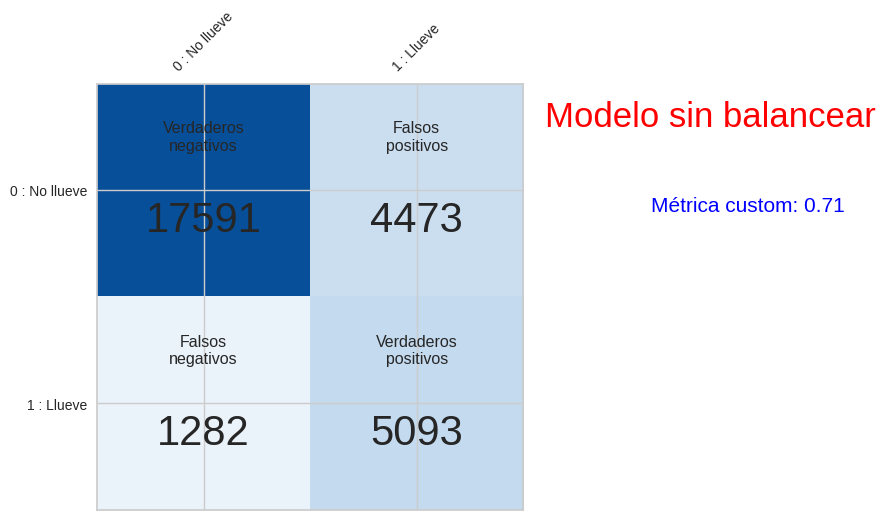

In [75]:
matriz_de_confusion(y_test, y_pred_optimo, "Modelo sin balancear")

<Figure size 400x400 with 0 Axes>

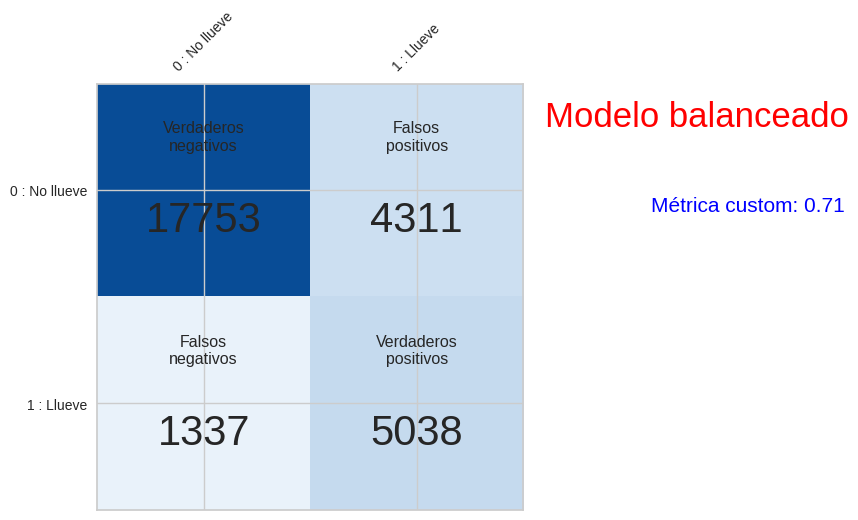

In [76]:
matriz_de_confusion(y_test, y_pred_balanceado, "Modelo balanceado")

<Figure size 400x400 with 0 Axes>

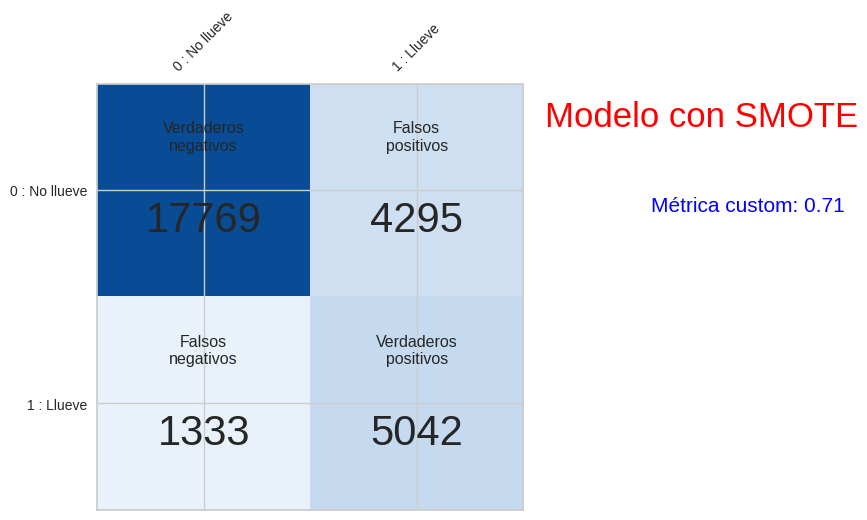

In [77]:
matriz_de_confusion(y_test, y_pred_smote, "Modelo con SMOTE")

De los resultados de los distintos balanceos aplicados podemos observar que no se producen mejoras en las métricas obtenidas en comparación con el modelo original ajustadando el umbral de decisión al óptimo establecido por la curva ROC. El modelo ajustado con un umbral del 0.14 sigue siendo el de mejor métrica.


# Modelo Base

Utilizamos una única característica (RainToday) para realizar el modelo.

In [78]:
# Si llovió hoy, predigo que también lloverá mañana; si no, predigo que no
# Mapeo con 0 y 1
y_predbase = X_test['RainToday'].map({'Yes': 1, 'No': 0})

Evaluamos las métricas del modelo base.

<Figure size 400x400 with 0 Axes>

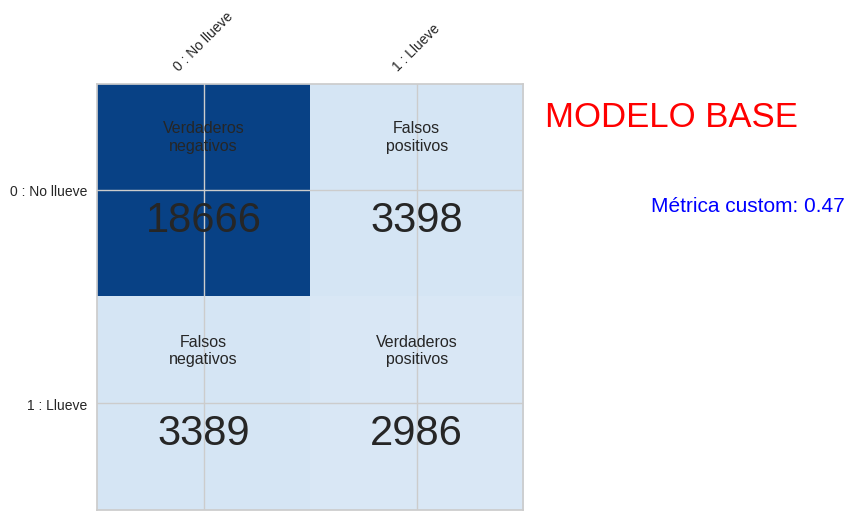

              precision    recall  f1-score   support

           0       0.85      0.85      0.85     22064
           1       0.47      0.47      0.47      6375

    accuracy                           0.76     28439
   macro avg       0.66      0.66      0.66     28439
weighted avg       0.76      0.76      0.76     28439



In [79]:
matriz_de_confusion(y_test, y_predbase, "MODELO BASE")
print(classification_report(y_test, y_predbase))


Observamos que nuestro modelo tiene mejores métricas que el modelo base con un F1 Score significativamente superior.

# Optimización de Hiperparámetros

Optimizamos:

* El umbral de decisión, que define a partir de qué probabilidad el modelo clasifica una instancia como positiva.

* C, el hiperparámetro de regularización de la regresión logística, que controla la fuerza de penalización L2 sobre los coeficientes del modelo (es el inverso de alpha en la regresión Ridge).


Definimos nuestra métrica y la utilizamos como métrica a maximizar en la optiimizacion de hiperparámetros.

[I 2025-06-22 20:53:17,823] A new study created in memory with name: no-name-c7c27fde-23e7-434e-ab17-74c8c2432297
[I 2025-06-22 20:53:25,683] Trial 0 finished with value: -0.6752007252753393 and parameters: {'C': 0.41076458147743766, 'umbral': 0.28}. Best is trial 0 with value: -0.6752007252753393.
[I 2025-06-22 20:53:32,668] Trial 1 finished with value: -0.6564813026770986 and parameters: {'C': 0.4077346861903563, 'umbral': 0.33}. Best is trial 0 with value: -0.6752007252753393.
[I 2025-06-22 20:53:36,331] Trial 2 finished with value: -0.554892468259521 and parameters: {'C': 0.0005439673182978175, 'umbral': 0.53}. Best is trial 0 with value: -0.6752007252753393.
[I 2025-06-22 20:53:41,881] Trial 3 finished with value: -0.562383263338462 and parameters: {'C': 0.0038136346137646595, 'umbral': 0.55}. Best is trial 0 with value: -0.6752007252753393.
[I 2025-06-22 20:53:49,226] Trial 4 finished with value: -0.4829229253108019 and parameters: {'C': 16.693052574811198, 'umbral': 0.74}. Best 

Mejores hiperparámetros: {'C': 88.44922854656336, 'umbral': 0.03}


<Figure size 400x400 with 0 Axes>

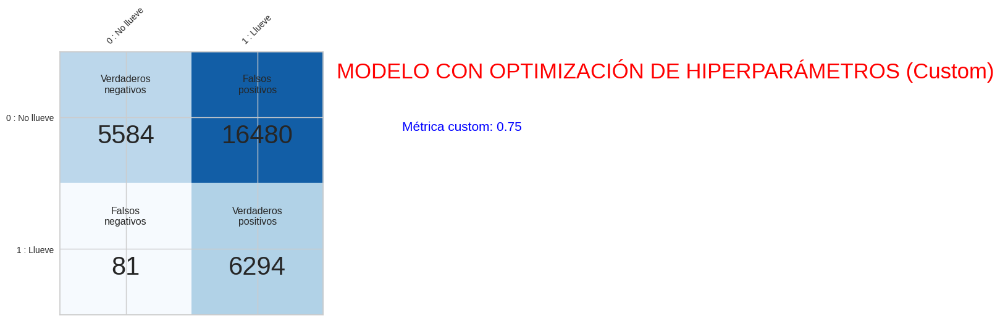

              precision    recall  f1-score   support

           0       0.99      0.25      0.40     22064
           1       0.28      0.99      0.43      6375

    accuracy                           0.42     28439
   macro avg       0.63      0.62      0.42     28439
weighted avg       0.83      0.42      0.41     28439



In [80]:
def custom_metric(y_true, y_pred):
    recall = recall_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    return (2 * recall + precision) / 3

def objective(trial):
    C = trial.suggest_float('C', 1e-4, 100.0, log=True)
    umbral = trial.suggest_float('umbral', 0.0, 1.0, step=0.01)

    pipeline = Pipeline(steps=[
        ('preprocesamiento', preprocesador),
        ('model', LogisticRegression(penalty='l2', C=C, solver='liblinear', random_state=42))
    ])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    metric_scores = []

    for train_idx, val_idx in cv.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        pipeline.fit(X_tr, y_tr)
        y_scores = pipeline.predict_proba(X_val)[:, 1]
        y_pred_umbral = (y_scores >= umbral).astype(int)

        # Usamos la métrica custom
        metric = custom_metric(y_val, y_pred_umbral)
        metric_scores.append(metric)

    # maximizamos la metrica
    return -np.mean(metric_scores)  # direction='minimize'
    # O directamente:
    # return np.mean(metric_scores)  # direction='maximize'

study = optuna.create_study(direction='minimize')


study.optimize(objective, n_trials=20)

best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar pipeline final con mejores hiperparámetros
final_pipeline = Pipeline(steps=[
    ('preprocesamiento', preprocesador),
    ('model', LogisticRegression(penalty='l2', C=best_params['C'], solver='liblinear', random_state=42))
])
final_pipeline.fit(X_train, y_train)

# Predecir en test con el mejor umbral
y_scores_test = final_pipeline.predict_proba(X_test)[:, 1]
y_pred_test_op = (y_scores_test >= best_params['umbral']).astype(int)

# Evaluar desempeño
matriz_de_confusion(y_test, y_pred_test_op, "MODELO CON OPTIMIZACIÓN DE HIPERPARÁMETROS (Custom)")
print(classification_report(y_test, y_pred_test_op))



Observamos una mejora en nuestra métrica alcanzando un valor de 0.75 al optimizar los hiperparametros con los siguientes valores:
* C: 0.013599722892075077
* umbral: 0.03

Luego de comparar las distintas métricas de desempeño y analizar las matrices de confusión, así como las decisiones tomadas en cada etapa del trabajo, optamos por quedarnos con el modelo de regresión logística con regularización y optimización de hiperparametros siendo el mismo un modelo más simple, con mejor interpretabilidad y desempeño más cercano al buscado.

# Explicabilidad

In [81]:

# Transformar X_test con el preprocesador
X_test = preprocesador.transform(X_test)
X_train = preprocesador.transform(X_train)

# Extraer el modelo entrenado del pipeline
model = final_pipeline.named_steps['model']

# Crear el explainer SHAP usando los datos ya transformados
explainer = shap.Explainer(model, X_train, feature_names=preprocesador.get_feature_names_out(), )

In [82]:
# Calculamos los valores SHAP para un conjunto de ejemplos de prueba
shap_values = explainer(X_test)

In [83]:
shap_values.shape

(28439, 28)

Procedemos a imprimir el **base value** (valor base), es decir la predicción promedio del modelo antes de ver ninguna información de una observación en particular

In [84]:
explainer.expected_value

-1.7808435706788834

## Interpretabilidad **local**

Comparamos los graficos de fuerzas para las muestras de indice 0,1 y 2.

In [85]:
shap_values[0]
shap_values[1]
shap_values[2]

.values =
array([-9.56540616e-02,  3.44946236e-01, -1.64945832e-02, -1.41876984e-01,
        2.28221668e-02,  1.05206613e-01,  6.51085079e-02, -1.39782922e+00,
        2.20074383e+00, -2.22977657e-02, -3.65466201e-02, -3.01158551e-02,
       -1.05996101e-01,  1.39036329e-02, -3.50623273e-02, -1.32657461e-02,
       -8.36483741e-04, -4.87328613e-02,  8.19858611e-02, -1.22974220e-01,
        8.30045782e-01, -3.49225592e-02, -4.13623565e-03, -2.68901921e-02,
       -8.65243481e-02, -7.35368368e-03, -8.70996397e-02, -1.49834652e-01])

.base_values =
-1.7808435706788834

.data =
array([ 0.18218583,  0.26581951,  0.98888245, -0.40653031,  0.88060277,
        0.68157539,  0.35642057, -1.51912651, -1.67174434, -0.68608071,
        0.75335276,  0.20802832, -0.05543237, -0.10352946,  0.17294125,
        1.        ,  0.        ,  0.        ,  1.        ,  0.        ,
        1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [86]:
shap.initjs()
# Gráfico de fuerza para índices 0, 1 y 2
for index in [0, 1, 2]:
  print(f"\nSHAP Force Plot para observación {index}")
  display(shap.force_plot(
      explainer.expected_value,
      shap_values.values[index],
      X_test[index],
      feature_names=preprocesador.get_feature_names_out()
  ))


SHAP Force Plot para observación 0



SHAP Force Plot para observación 1



SHAP Force Plot para observación 2


En los ***gráficos de fuerza*** de las muestras tomadas podemos observar el valor base a la izquierda y el valor final de la predicción a la derecha después de aplicarle todas las contribuciones SHAP. Observamos como cada flecha representa una variable y cómo contribuye a la predicción.
Las variables que empujan hacia la derecha (rojo) aumentan la predicción (probabilidad de lluvia). Las vaiables que empujan hacia la izquierda reducen dicha predicción.
De la observación de los tamaños de las flechas mostradas podemos determinar cuan imprtante fué esa variable en la observación.
De allí:
- Observación 0: Gran contribución positva de las horas de sol y negativa de la humedad a las 3pm.
- Observación 1: Gran contribución positiva de la humedad a las 3pm y negativa de la presión a las 9pm.
- Observación 2: Gran contribución positiva de la presión a las 3pm y negativa de la presión a las 9am.

Realizamos gráfico de cascada y barras para las muestras de indice 0,1 y 2.

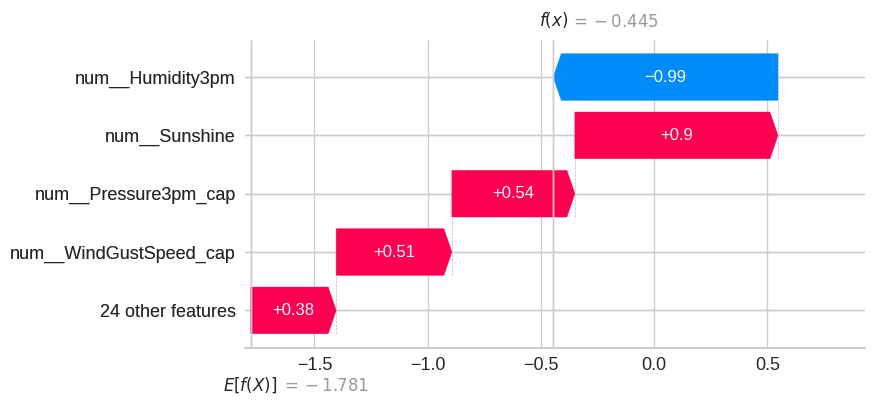

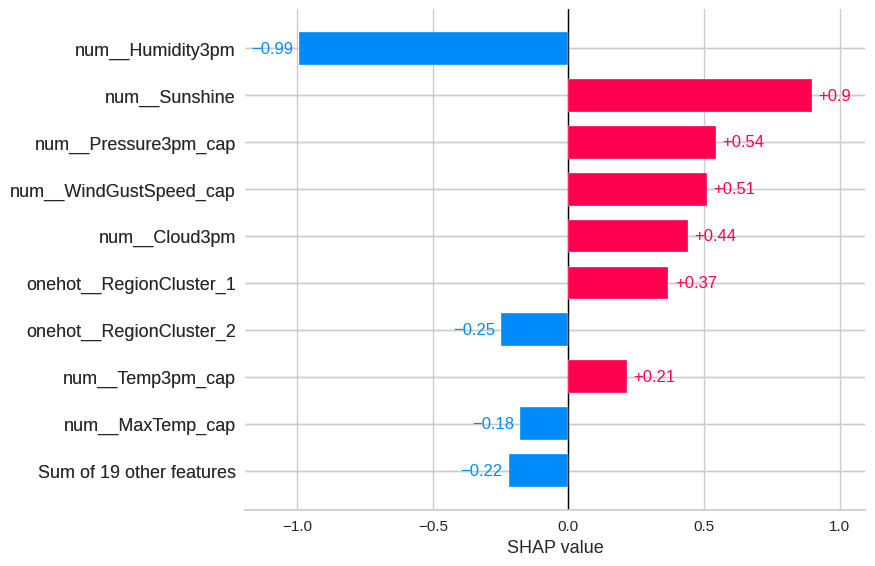

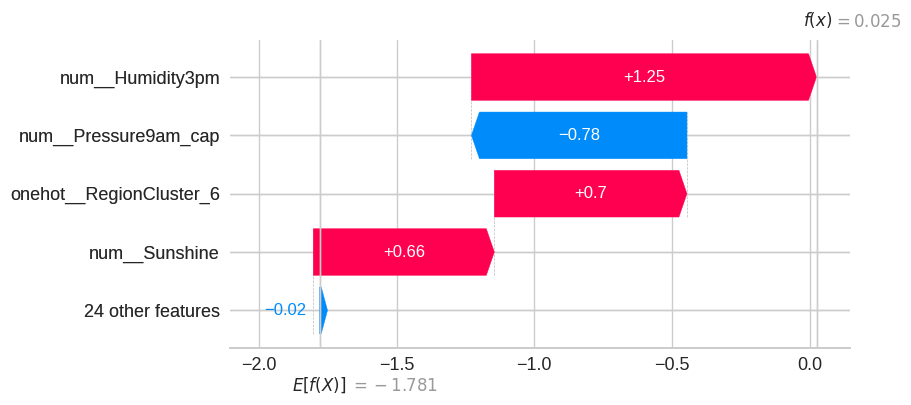

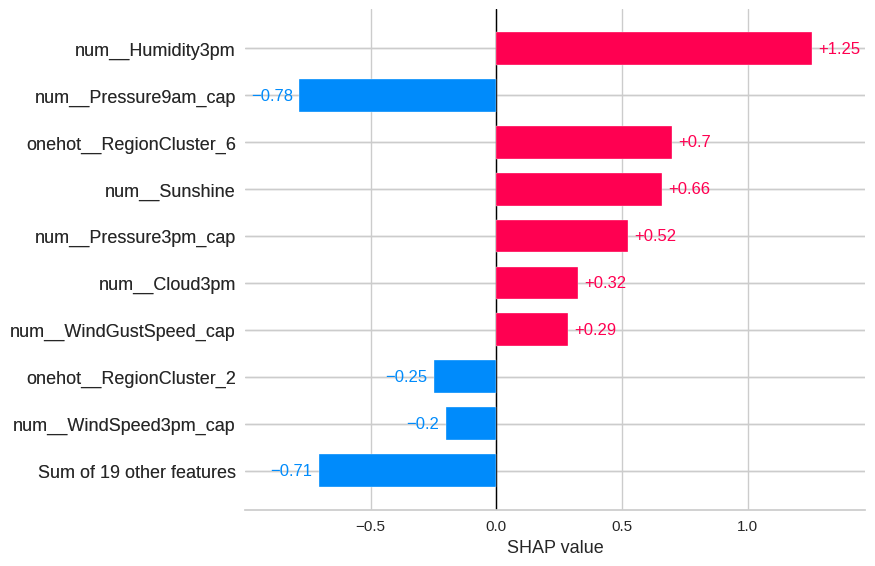

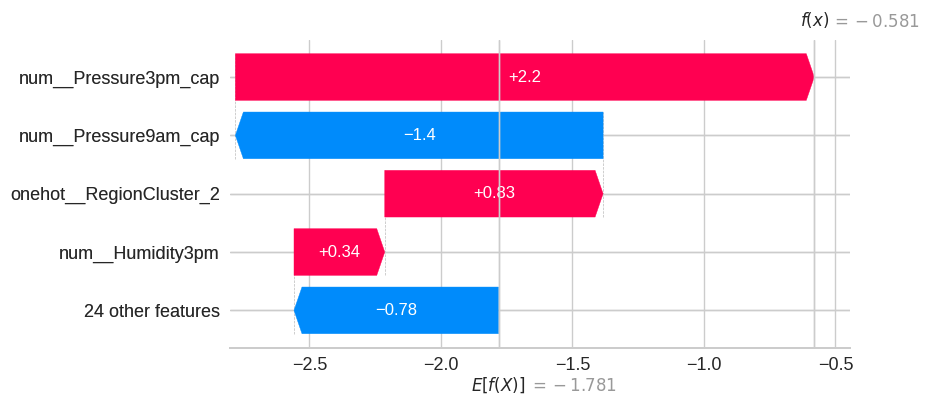

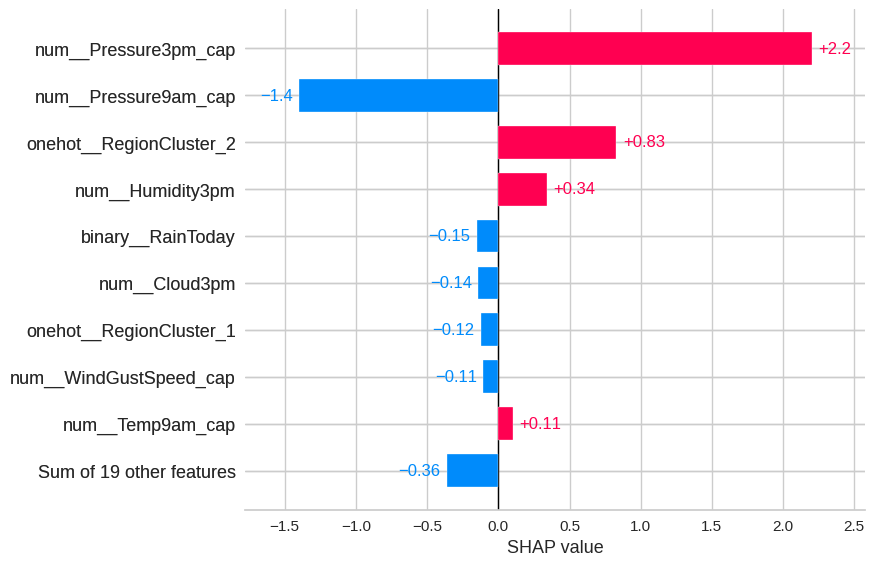

In [87]:
for index in [0, 1, 2]:
    #Para crear el waterfall creo una explicacion
    explanation = shap.Explanation(
        values=shap_values.values[index],
        base_values=explainer.expected_value,
        feature_names=preprocesador.get_feature_names_out()
    )

    shap.plots.waterfall(explanation, max_display=5)
    shap.plots.bar(explanation)

En los gráficos de cascada y barras presentados podemos complementar la información extraída de los gráficos de fuerza.
En el ***gráfico de cascada*** partimos del base value que determinamos y desde allí podemos ver, cómo cada feature contribuye a la predicción final que estamos analizando. Vemos con barras azules la contribución de variables que disminuyen la predicción y con barras rojas (y su valor) las variables que aumentan la predicción, para llegar así al valor predicho.
Por su parte, el ***gráfico de barras*** complementa la explicación mostrando en forma ordenada la magnitud absoluta por la que influyeron cada una de las variables analizadas previamente.

## Interpretabilidad **global**

Analizamos la explicabilidad de manera global.

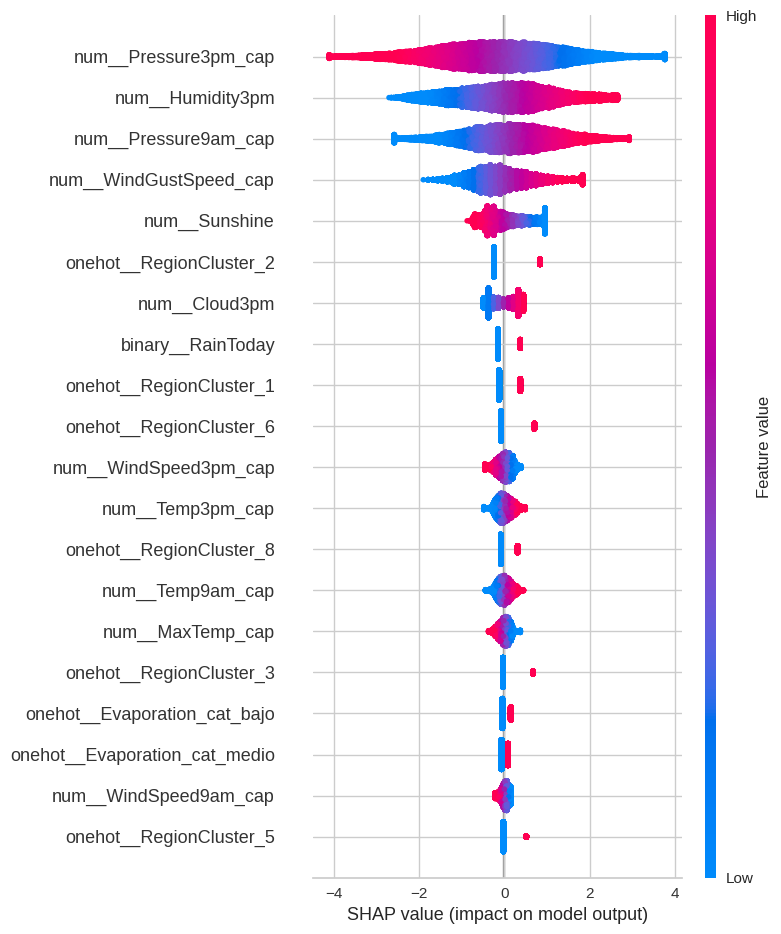

In [88]:
# Grafico resumen de importancia de variables
shap.summary_plot(shap_values.values, X_test, feature_names=preprocesador.get_feature_names_out())


A partir del gráfico visualizamos el impacto individual de cada feature en las predicciones del modelo.
- Presión 3pm: Feature más influyente. Valores altos de presión (rojo) tienden a mover la predicción hacia NO va a llover (valores SHAP negativos). Valores bajos de presión (azul) tienden a aumentar la probabilidad de lluvia.
- Humedad 3pm: Valores altos contribuyen a predecir lluvia (valores SHAP positivos).
- Velocidad del viento: Ráfagas más fuertes están asociadas con mayor probabilidad de lluvia.
- Horas de Sol: A mayor cantidad de sol, menor probabilidad de lluvia (SHAP negativo)



In [89]:
explanation = shap.Explanation(values=shap_values, base_values=explainer.expected_value,feature_names=preprocesador.get_feature_names_out(), data=X_test_original)

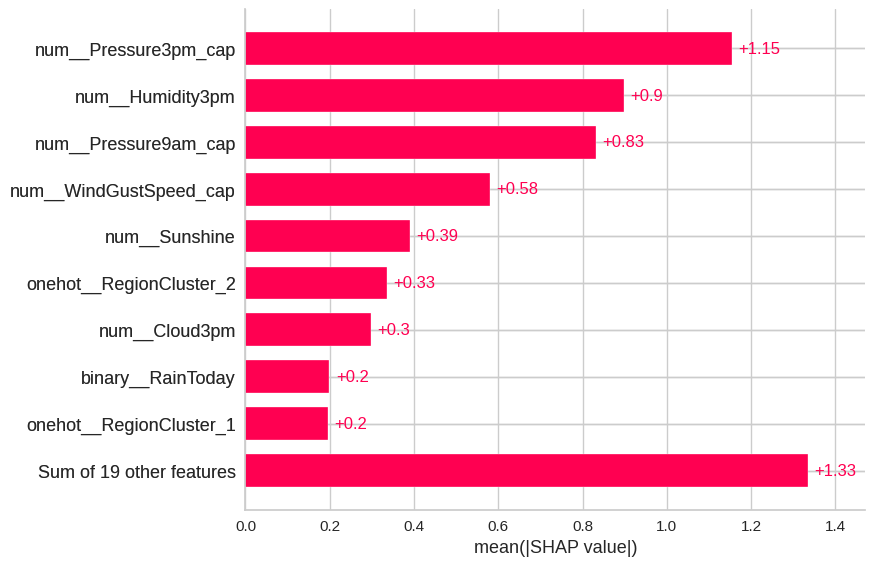

In [90]:
shap.plots.bar(explanation)

A partir de este gráfico podemos determinar cuáles son las variables más importantes para el modelo y su orden de importancia. De este modo, las 5 variables más importantes en promedio son:


*   Presión a las 3pm
*   Humedad a las 3pm
*   Presión a las 9am
*   Velocidad del viento
*   Horas de sol

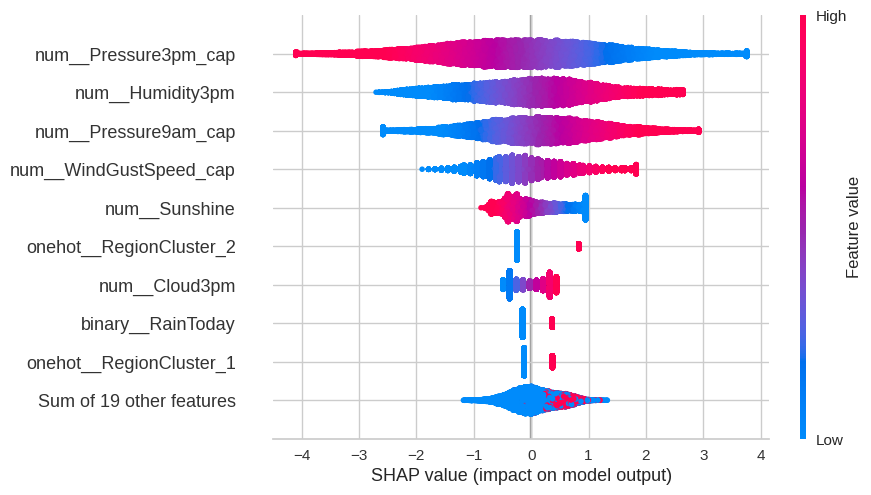

In [91]:
shap.plots.beeswarm(explanation)

Observamos que las variables meteorológicas numéricas (presión, humedad, sol, viento) son las más importantes.
El modelo aprendió patrones lógicos desde el punto de vista meteorológico:
***humedad alta + presión baja(3pm) + menos sol + ráfagas fuertes = más probabilidad de lluvia.***

# AutoML

In [92]:
print(type(X_train))
print(type(y_train))


<class 'numpy.ndarray'>
<class 'pandas.core.series.Series'>


In [93]:
from pycaret.classification import ClassificationExperiment
# Crear una instancia del experimento
exp = ClassificationExperiment()
# Concatenamos
X_train = pd.DataFrame(X_train)
# Reseteamos indices para evitar Nan al concatenar
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
df_train = pd.concat([X_train, y_train.rename('RainTomorrow')], axis=1)
# Borramos faltantes en la target
df_train = df_train.dropna(subset=['RainTomorrow'])


In [94]:
df_train

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,RainTomorrow
0,1.319660,-1.521260,-0.361116,-0.40653,-0.299239,1.128795,1.715156,-0.620479,-0.680516,-0.898237,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
1,0.507179,-0.410373,-1.036116,-0.76457,-1.085800,-1.246094,-1.031224,0.392283,0.526198,0.189064,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.168644,-0.362073,1.326382,1.02563,1.273883,-0.089492,0.197420,-0.748857,-0.709247,-0.261768,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
3,-0.846958,0.120921,0.651383,-0.04849,0.880603,1.915284,1.628428,-1.918526,-2.030885,0.321662,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,1.102999,-0.313774,0.988882,-0.76457,-0.299239,0.666154,0.356421,1.019910,0.842242,-0.580003,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113749,0.778006,-1.569559,-0.023617,0.66759,-0.299239,0.650733,1.180334,0.021413,-0.134621,-1.375589,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
113750,-1.578192,-1.569559,0.988882,-1.12261,0.487322,1.329272,1.671792,-2.232339,-2.318198,0.215584,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
113751,-1.618816,1.980450,1.326382,1.38367,-1.085800,-0.336234,-1.313089,0.164055,-0.192084,0.852052,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
113752,1.292578,-0.555271,-1.036116,-0.76457,0.880603,0.866632,0.920151,0.278169,0.095229,-0.580003,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [95]:
exp.setup(
    data=df_train,
    target='RainTomorrow',
    session_id=42,
    fix_imbalance=True,                   # activa balanceo
    fix_imbalance_method=SMOTE(),
    imputation_type=None,          # no imputa faltantes
    preprocess=True,               # mantiene otras opciones automáticas
    normalize=False,               # no escala los datos
    encoding_method=None
)

,Description,Value
0,Session id,42
1,Target,RainTomorrow
2,Target type,Binary
3,Original data shape,"(113754, 29)"
4,Transformed data shape,"(157679, 29)"
5,Transformed train set shape,"(123552, 29)"
6,Transformed test set shape,"(34127, 29)"
7,Numeric features,28
8,Preprocess,True
9,Imputation type,None


Pocedemos a comparar modelos y a obtener los 3 con mejor recall.

In [96]:
best_model_2 = exp.compare_models(sort='Recall', n_select=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.7933,0.8736,0.7854,0.5264,0.6301,0.4944,0.5137,2.7700
lr,Logistic Regression,0.7999,0.8761,0.7836,0.5369,0.6372,0.5057,0.5229,3.6270
lda,Linear Discriminant Analysis,0.8030,0.8757,0.7742,0.5425,0.6380,0.5083,0.5235,2.4940
ridge,Ridge Classifier,0.8030,0.8756,0.7733,0.5425,0.6377,0.5080,0.5231,2.3850
knn,K Neighbors Classifier,0.7658,0.8339,0.7712,0.4859,0.5962,0.4429,0.4664,16.5380
nb,Naive Bayes,0.7699,0.8248,0.7261,0.4911,0.5859,0.4348,0.4507,2.2090
ada,Ada Boost Classifier,0.8029,0.8617,0.7233,0.5456,0.6220,0.4922,0.5011,12.7980
qda,Quadratic Discriminant Analysis,0.8018,0.8404,0.7071,0.5446,0.6153,0.4848,0.4923,2.4870
gbc,Gradient Boosting Classifier,0.8290,0.8747,0.6881,0.6043,0.6435,0.5316,0.5336,56.5400
rf,Random Forest Classifier,0.8522,0.8915,0.6550,0.6758,0.6652,0.5704,0.5705,40.9960


Processing:   0%|          | 0/67 [00:00<?, ?it/s]

Realizamos las predicciones, calculamos metricas y graficamos matrices de confusión.

In [97]:
# Concatenamos
X_test = pd.DataFrame(X_test)
# Reseteamos indices para evitar Nan al concatenar
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)
df_test = pd.concat([X_test, y_test.rename('RainTomorrow')], axis=1)
# Borramos faltantes en la target
df_test = df_test.dropna(subset=['RainTomorrow'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.8005,0.7946,0.7838,0.5377,0.6379,0.5067,0.5238



--- Modelo 1: SGDClassifier ---
Recall test: 0.7838
F1 Score test: 0.6379

Classification Report test:

              precision    recall  f1-score   support

          No       0.93      0.81      0.86     22064
         Yes       0.54      0.78      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.79      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Confusion Matrix:
[[17768  4296]
 [ 1378  4997]]


<Figure size 400x400 with 0 Axes>

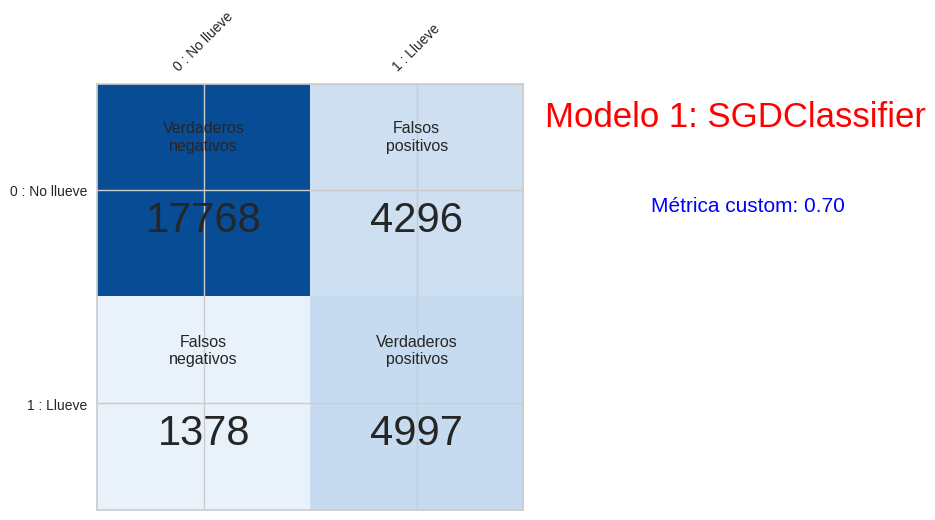

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.8016,0.8778,0.7911,0.5391,0.6412,0.5108,0.5287



--- Modelo 2: LogisticRegression ---
Recall test: 0.7911
F1 Score test: 0.6412

Classification Report test:

              precision    recall  f1-score   support

          No       0.93      0.80      0.86     22064
         Yes       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Confusion Matrix:
[[17753  4311]
 [ 1332  5043]]


<Figure size 400x400 with 0 Axes>

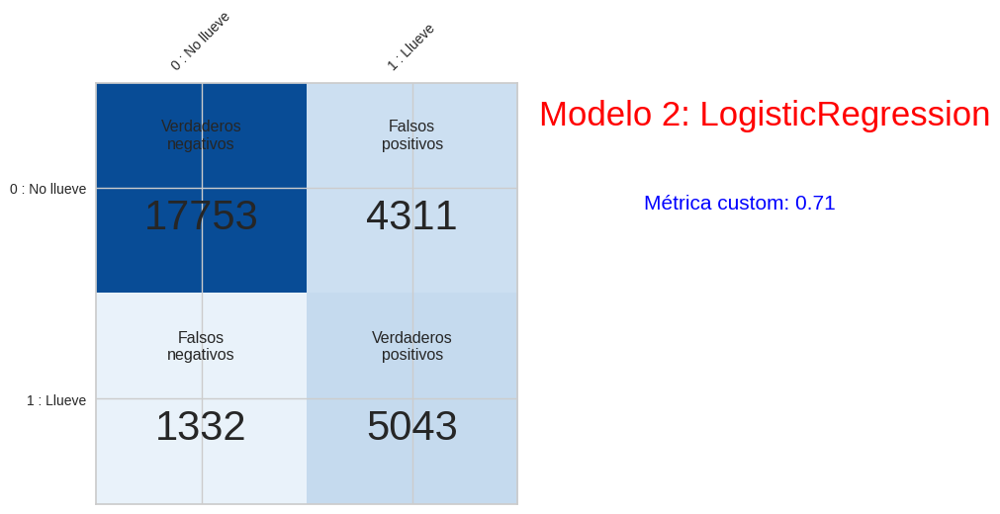

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Linear Discriminant Analysis,0.8041,0.8773,0.7805,0.5439,0.6411,0.5122,0.5280



--- Modelo 3: LinearDiscriminantAnalysis ---
Recall test: 0.7805
F1 Score test: 0.6411

Classification Report test:

              precision    recall  f1-score   support

          No       0.93      0.81      0.87     22064
         Yes       0.54      0.78      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.74      0.80      0.75     28439
weighted avg       0.84      0.80      0.82     28439

Confusion Matrix:
[[17892  4172]
 [ 1399  4976]]


<Figure size 400x400 with 0 Axes>

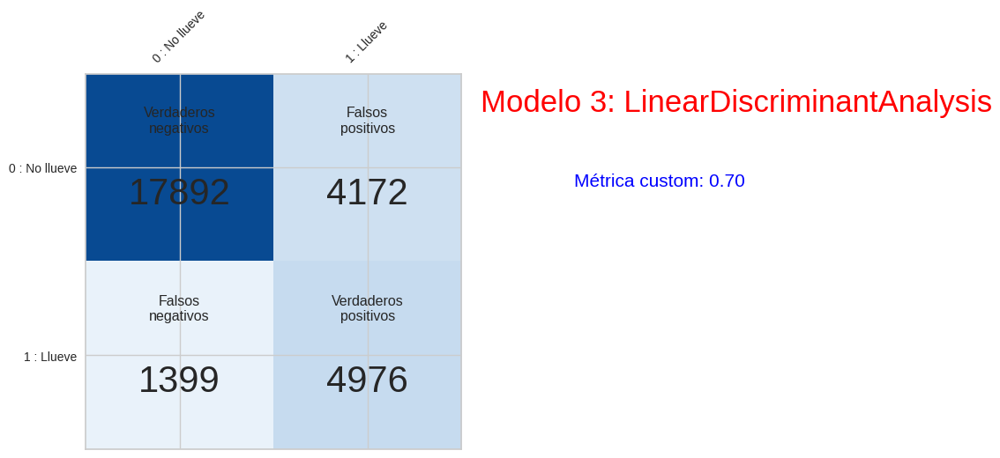

In [98]:
for idx, model in enumerate(best_model_2):
    # Predicción sobre test
    preds = exp.predict_model(model, data=df_test)

    # Si el target es 'Yes'/'No', lo pasamos a 1/0
    y_true_aml = preds['RainTomorrow']
    y_pred_aml = preds['prediction_label']
    if y_true_aml.dtype == 'O':
        y_true_aml = (y_true == 'Yes').astype(int)
    if y_pred_aml.dtype == 'O':
        y_pred_aml = (y_pred_aml == 'Yes').astype(int)

    # Métricas
    print(f"\n--- Modelo {idx+1}: {type(model).__name__} ---")
    print("Recall test:", round(recall_score(y_true_aml, y_pred_aml, pos_label=1), 4))
    print("F1 Score test:", round(f1_score(y_true_aml, y_pred_aml, pos_label=1), 4))
    print("\nClassification Report test:\n")
    print(classification_report(y_true_aml, y_pred_aml, target_names=['No', 'Yes']))
    print("Confusion Matrix:")
    print(confusion_matrix(y_true_aml, y_pred_aml))

    # Matriz de confusión con métrica custom visualizada
    matriz_de_confusion(y_true_aml, y_pred_aml, titulo=f"Modelo {idx+1}: {type(model).__name__}")

Observamos que los modelos obtienen buenas métricas, siendo 0.71 nuestra métrica para el mejor de ellos (Regresión Logistica). Sin embargo no alcanza el rendimiento del modelo obtenido con optimización de hiperparámetros (0.75). Las métricas obtenidas, y el tiempo y trabajo ahorrado por el modelo de Auto ML lo hacen una opción efectiva para utilizar en contextos que lo ameriten.

In [99]:
# Guardar el modelo entrenado
primer_modelo = best_model_2[0]

exp.save_model(primer_modelo, 'best_RainPrediction_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('balance',
                  TransformerWrapper(exclude=None, include=None,
                                     transformer=FixImbalancer(estimator=SMOTE(k_neighbors=5,
                                                                               random_state=None,
                                                                               sampling_strategy='auto')))),
                 ('trained_model',
                  SGDClassifier(alpha=0.0001, average=False, class_weight=None,
                                early_stopping=False, epsilon=0.1, eta0=0.001,
                                fit_intercept=True, l1_ratio=0.15,
                                learning_rate='optimal', loss='hinge',
                                max_iter=1000, n_iter_no_change=5, n_jobs=-1,
                                penalty='l2', power_t=0.5, random_state=42,
                                shuffle=True, tol=0.001, validation_fraction=0.

# Redes Neuronales


## Modelado

Creamos una clase para definir, entrenar y evaluar una red neuronal.
Permite personalizar el número de capas, unidades, tasas de dropout y funciones de activación.
También incluye funciones para entrenamiento, evaluación, predicción y gráficos.

In [100]:
class NeuralNetwork:
    def __init__(self, epochs, batch_size, learning_rate,
                 num_layers=2, units=None, dropout_rates=None, activations=None):
        self.epochs = epochs
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.num_layers = num_layers
        self.units = units if units is not None else [64]*num_layers
        self.dropout_rates = dropout_rates if dropout_rates is not None else [0.0]*num_layers
        self.activations = activations if activations is not None else ['relu']*num_layers
        self.model = None

    def build_model(self, input_shape, units_1=64, units_2=32):
        model = tf.keras.models.Sequential([
            tf.keras.layers.Dense(units_1, activation='relu', input_shape=(input_shape,)),
            tf.keras.layers.Dense(units_2, activation='relu'),
            tf.keras.layers.Dense(1, activation='sigmoid')
        ])
        optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
        model.compile(optimizer=optimizer,
                      loss='binary_crossentropy',
                      metrics=[
                          tf.keras.metrics.Recall(name='recall'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.AUC(name='auc')
                      ])
        print("\nModelo construido satisfactoriamente")
        self.model = model
        self.model.summary()



    def train(self, X_train, y_train, X_valid, y_valid):
        # el fit del modelo. Devuelvo la evolución de la función de pérdida a medida que aumentan las épocas

        history=self.model.fit(X_train, y_train,
                               validation_data=(X_valid, y_valid),
                               epochs=self.epochs,
                               batch_size=self.batch_size,)
        return history.history['loss'], history.history['val_loss']

    def evaluate(self, X_test, y_test):
        print("\nEvaluamos metricas en Test:")
    
        loss, accuracy, recall, precision = self.model.evaluate(X_test, y_test, verbose=0)

        print(f"Test Loss: {loss:.4f}")
        print(f"Test Accuracy: {accuracy:.4f}")
        print(f"Test Recall: {recall:.4f}")
        print(f"Test Precision: {precision:.4f}")

        
        y_pred_prob = self.model.predict(X_test)
        y_pred = (y_pred_prob > 0.5).astype(int) # Default threshold of 0.5

        from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
        print("\nClassification Report:")
        print(classification_report(y_test, y_pred))

        print("\nMatriz de Confusion:")
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
        disp.plot(cmap='Blues')
        plt.show()

    def predict_proba(self, X):
        # obtiene predicciones
        return self.model.predict(X)

    def predict(self, X, threshold=0.5):
         # predicciones binarias basadas en el umbral
        y_pred_prob = self.model.predict(X)
        return (y_pred_prob > threshold).astype(int)

    def plot_training(self, history):
      loss, val_loss = history
      plt.figure(figsize=(10, 5))
      plt.plot(loss, label='Train Loss')
      plt.plot(val_loss, label='Validation Loss')
      plt.title('Evolución de la función de pérdida')
      plt.xlabel('Épocas')
      plt.ylabel('Loss')
      plt.legend()
      plt.grid(True)
      plt.show()

Generamos el conjutno de validación.

In [101]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [102]:
print(type(X_train))
print(type(y_train))



<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


Balanceo los datos utilizando SMOTE.

In [103]:
# Crear el objeto SMOTE
smote = SMOTE(random_state=42)

# Aplicar solo sobre X_train, y_train
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)


In [104]:
print(y_train_bal.value_counts())


RainTomorrow
0    70539
1    70539
Name: count, dtype: int64


In [105]:
nn = NeuralNetwork(epochs=200, batch_size=512, learning_rate=0.001)

#buildeo el modelo
nn.build_model(input_shape=X_train_bal.shape[1])


Modelo construido satisfactoriamente


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

In [106]:
# entreno el modelo
history=nn.train(X_train_bal, y_train_bal, X_valid, y_valid)

Epoch 1/200
276/276 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - auc: 0.8347 - loss: 0.4972 - precision: 0.7406 - recall: 0.7839 - val_auc: 0.8846 - val_loss: 0.4218 - val_precision: 0.5322 - val_recall: 0.7950
Epoch 2/200
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - auc: 0.8887 - loss: 0.4194 - precision: 0.8044 - recall: 0.8038 - val_auc: 0.8884 - val_loss: 0.4135 - val_precision: 0.5359 - val_recall: 0.7991
Epoch 3/200
276/276 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - auc: 0.8963 - loss: 0.4057 - precision: 0.8107 - recall: 0.8184 - val_auc: 0.8902 - val_loss: 0.4226 - val_precision: 0.5271 - val_recall: 0.8079
Epoch 4/200
276/276 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - auc: 0.8982 - loss: 0.4019 - precision: 0.8111 - recall: 0.8212 - val_auc: 0.8895 - val_loss: 0.4130 - val_precision: 0.5419 - val_recall: 0.7981
Epoch 5/200
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - auc: 0.9020 - loss: 0.3948 - precision: 0.8171 - recall: 0.8221 - val_auc: 0.8907 - val_loss: 0.4316 - val_precision: 0.5240 - val_recall: 0.

Observamos las métricas y la matriz de correlación del modelo resultante.


Evaluamos metricas en Test:
Test Loss: 0.4006
Test Accuracy: 0.7272
Test Recall: 0.5857
Test Precision: 0.8778
889/889 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.85      0.88     22064
           1       0.59      0.73      0.65      6375

    accuracy                           0.82     28439
   macro avg       0.75      0.79      0.77     28439
weighted avg       0.84      0.82      0.83     28439


Matriz de Confusion:


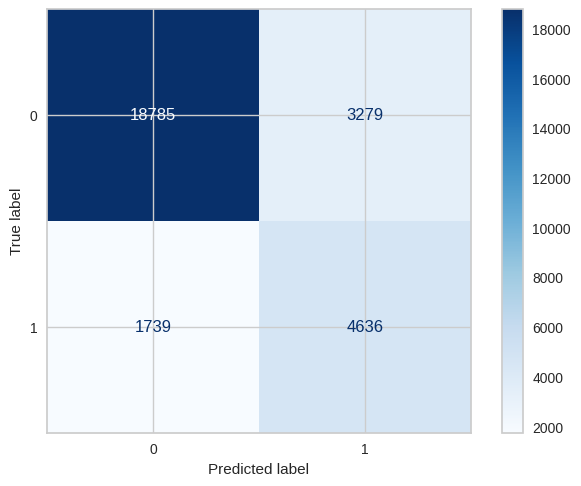

889/889 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Métrica custom (2*recall + precision)/3: 0.6801


In [107]:
# evaluo metricas
nn.evaluate(X_test, y_test)

#Obtenemos las predicciones de la red
y_pred = nn.predict(X_test)

# Calculamos nuestra métrica
custom = custom_metric(y_test, y_pred)
print(f"Métrica custom (2*recall + precision)/3: {custom:.4f}")


Observamos que nuestra métrica para el modelo de redes neuronales es de 0.68.

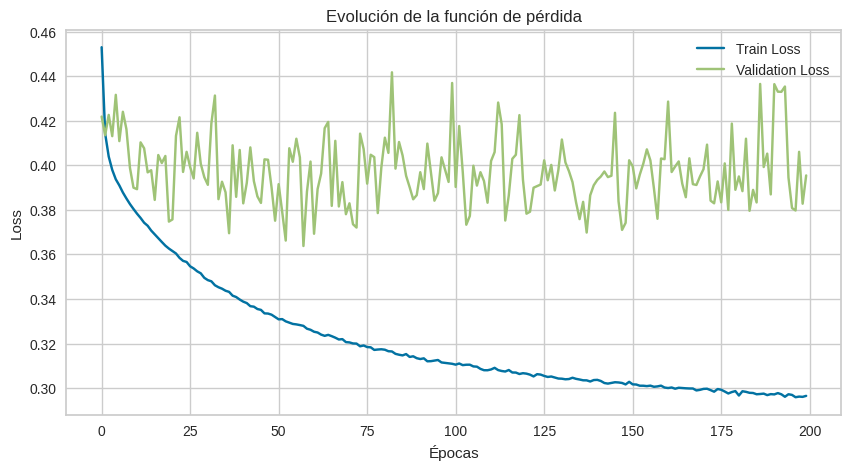

In [108]:
#Evolucion de la funcion de perdida segun epocas
nn.plot_training(history)

Podemos observar como el modelo aprende bien de los datos de entrenamiento, a partir de la disminución del error, pero también vemos que no logra generalizar mejor en el validation set con el paso de las épocas. El error de validación no se dispara, pero aumenta levemente y no disminuye a medida que disminuye el de train, indicando un sobreajuste que no es severo. A partir de las 20 épocas podemos ver como el error de validación tiene una leve tendencia a aumentar mientras que el error de train sigue disminuyendo.

## Optimizacion de hiperparametros


 Procedemos a optimizar hiperparámetros. Para ello creamos la función objetivo para Optuna, que busca optimizar la arquitectura y los hiperparámetros
 de la red neuronal. Hiperparámetros a optimizar:
 - Cantidad de capas ocultas (1 a 3)
 - Cantidad de unidades por capa
 - Tasas de dropout
 - Funciones de activación por capa
 - Learning rate y batch size

 La métrica de evaluación personalizada es `custom_metric` sobre el conjunto de validación. La cantidad de épocas la establecimos en 13. El valor fue obtenido como resultado de la optimización de la cantidad de épocas como hiperparámetro, siendo coherente con el observado en la gráfica de la función pérdida del primer modelo realizado con una red neuronal. La misma no se incluye en la función para disminuir el tiempo de ejecución.

In [109]:
def objective2(trial):
    # Cantidad de capas
    num_layers = trial.suggest_int('num_layers', 1, 3)

    # Listas para almacenar hiperparámetros por capa
    units = []
    dropout_rates = []
    activations = []

    for i in range(num_layers):
        units.append(trial.suggest_int(f'units_{i}', 8, 128))
        dropout_rates.append(trial.suggest_float(f'dropout_{i}', 0.0, 0.5))
        activations.append(trial.suggest_categorical(f'activation_{i}', ['relu', 'tanh', 'elu']))

    # Otros hiperparámetros globales
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    epochs = 13  # Valor fijo

    # Instanciá la red
    nn = NeuralNetwork(
        epochs=epochs, batch_size=batch_size, learning_rate=learning_rate,
        num_layers=num_layers, units=units, dropout_rates=dropout_rates, activations=activations
    )
    nn.build_model(input_shape=X_train_bal.shape[1])
    nn.train(X_train_bal, y_train_bal, X_valid, y_valid)
    y_pred = nn.predict(X_valid).flatten()
    score = custom_metric(y_valid, y_pred)
    return score


In [117]:
study = optuna.create_study(direction='maximize')
study.optimize(objective2, n_trials=50)

best_params = study.best_params
print("Mejores hiperparámetros encontrados:", best_params)



[I 2025-06-23 00:21:21,556] A new study created in memory with name: no-name-62d01f2a-5893-406f-94d4-4ab8e58e5977



Modelo construido satisfactoriamente


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_66 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step - auc: 0.8750 - loss: 0.4396 - precision: 0.7872 - recall: 0.7988 - val_auc: 0.8875 - val_loss: 0.4162 - val_precision: 0.5332 - val_recall: 0.7999
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.8995 - loss: 0.3997 - precision: 0.8139 - recall: 0.8233 - val_auc: 0.8882 - val_loss: 0.4144 - val_precision: 0.5447 - val_recall: 0.7963
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - auc: 0.9048 - loss: 0.3895 - precision: 0.8172 - recall: 0.8313 - val_auc: 0.8919 - val_loss: 0.3764 - val_precision: 0.5791 - val_recall: 0.7638
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.9090 - loss: 0.3809 - precision: 0.8198 - recall: 0.8352 - val_auc: 0.8890 - val_loss: 0.4150 - val_precision: 0.5414 - val_recall: 0.8077
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.9110 - loss: 0.3770 - precision: 0.8239 - recall: 0.8410 - val_auc: 0.8890 - val_loss: 0.3925 - val_precision: 0.5628 - val_rec

[I 2025-06-23 00:23:15,691] Trial 0 finished with value: 0.6951771906643835 and parameters: {'num_layers': 3, 'units_0': 52, 'dropout_0': 0.013549089202908704, 'activation_0': 'elu', 'units_1': 53, 'dropout_1': 0.18669005470244482, 'activation_1': 'elu', 'units_2': 34, 'dropout_2': 0.22279466371949191, 'activation_2': 'tanh', 'learning_rate': 0.001738173278802935, 'batch_size': 64}. Best is trial 0 with value: 0.6951771906643835.



Modelo construido satisfactoriamente


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_69 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - auc: 0.8760 - loss: 0.4383 - precision: 0.7901 - recall: 0.7994 - val_auc: 0.8890 - val_loss: 0.3754 - val_precision: 0.5746 - val_recall: 0.7592
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - auc: 0.9006 - loss: 0.3970 - precision: 0.8130 - recall: 0.8253 - val_auc: 0.8909 - val_loss: 0.4013 - val_precision: 0.5489 - val_recall: 0.7922
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.9063 - loss: 0.3862 - precision: 0.8165 - recall: 0.8324 - val_auc: 0.8893 - val_loss: 0.3862 - val_precision: 0.5634 - val_recall: 0.7713
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - auc: 0.9097 - loss: 0.3794 - precision: 0.8215 - recall: 0.8377 - val_auc: 0.8886 - val_loss: 0.4465 - val_precision: 0.5149 - val_recall: 0.8243
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.9146 - loss: 0.3695 - precision: 0.8253 - recall: 0.8464 - val_auc: 0.8900 - val_loss: 0.3869 - val_precision: 0.5622 - val_r

[I 2025-06-23 00:25:08,602] Trial 1 finished with value: 0.6972897092524376 and parameters: {'num_layers': 2, 'units_0': 76, 'dropout_0': 0.1191512205182576, 'activation_0': 'elu', 'units_1': 127, 'dropout_1': 0.12906025766335805, 'activation_1': 'relu', 'learning_rate': 0.0033692125634938387, 'batch_size': 64}. Best is trial 1 with value: 0.6972897092524376.



Modelo construido satisfactoriamente


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_72 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8323 - loss: 0.5002 - precision: 0.7517 - recall: 0.7567 - val_auc: 0.8811 - val_loss: 0.4249 - val_precision: 0.5341 - val_recall: 0.7888
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - auc: 0.8872 - loss: 0.4225 - precision: 0.8023 - recall: 0.8041 - val_auc: 0.8848 - val_loss: 0.4153 - val_precision: 0.5386 - val_recall: 0.7852
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8919 - loss: 0.4141 - precision: 0.8071 - recall: 0.8069 - val_auc: 0.8871 - val_loss: 0.4311 - val_precision: 0.5249 - val_recall: 0.8106
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - auc: 0.8958 - loss: 0.4068 - precision: 0.8095 - recall: 0.8155 - val_auc: 0.8882 - val_loss: 0.4297 - val_precision: 0.5276 - val_recall: 0.8094
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8978 - loss: 0.4029 - precision: 0.8103 - recall: 0.8160 - val_auc: 0.8885 - val_loss: 0.4106 - val_precision: 0.5432 - val_recal

[I 2025-06-23 00:26:13,802] Trial 2 finished with value: 0.7166730487638212 and parameters: {'num_layers': 3, 'units_0': 105, 'dropout_0': 0.13571984467064435, 'activation_0': 'elu', 'units_1': 10, 'dropout_1': 0.24733634988754538, 'activation_1': 'elu', 'units_2': 72, 'dropout_2': 0.43957273453209506, 'activation_2': 'tanh', 'learning_rate': 0.00030684369814301405, 'batch_size': 128}. Best is trial 2 with value: 0.7166730487638212.



Modelo construido satisfactoriamente


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_75 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8584 - loss: 0.4640 - precision: 0.7792 - recall: 0.7714 - val_auc: 0.8870 - val_loss: 0.4235 - val_precision: 0.5311 - val_recall: 0.8045
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8943 - loss: 0.4094 - precision: 0.8095 - recall: 0.8095 - val_auc: 0.8883 - val_loss: 0.4053 - val_precision: 0.5479 - val_recall: 0.7912
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - auc: 0.9014 - loss: 0.3962 - precision: 0.8173 - recall: 0.8223 - val_auc: 0.8887 - val_loss: 0.4096 - val_precision: 0.5418 - val_recall: 0.7985
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.9028 - loss: 0.3934 - precision: 0.8161 - recall: 0.8250 - val_auc: 0.8898 - val_loss: 0.4081 - val_precision: 0.5497 - val_recall: 0.7993
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.9063 - loss: 0.3866 - precision: 0.8198 - recall: 0.8275 - val_auc: 0.8892 - val_loss: 0.3915 - val_precision: 0.5627 - val_recal

[I 2025-06-23 00:27:16,166] Trial 3 finished with value: 0.7164013563868212 and parameters: {'num_layers': 3, 'units_0': 98, 'dropout_0': 0.05955054809321608, 'activation_0': 'elu', 'units_1': 100, 'dropout_1': 0.2929095456406612, 'activation_1': 'tanh', 'units_2': 108, 'dropout_2': 0.11195302357385006, 'activation_2': 'relu', 'learning_rate': 0.0009185949611158369, 'batch_size': 128}. Best is trial 2 with value: 0.7166730487638212.



Modelo construido satisfactoriamente


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_78 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - auc: 0.8335 - loss: 0.5007 - precision: 0.7384 - recall: 0.8056 - val_auc: 0.8822 - val_loss: 0.4215 - val_precision: 0.5324 - val_recall: 0.7948
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - auc: 0.8854 - loss: 0.4252 - precision: 0.8007 - recall: 0.8015 - val_auc: 0.8865 - val_loss: 0.4158 - val_precision: 0.5390 - val_recall: 0.7958
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - auc: 0.8903 - loss: 0.4167 - precision: 0.8052 - recall: 0.8073 - val_auc: 0.8885 - val_loss: 0.4294 - val_precision: 0.5294 - val_recall: 0.8126
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - auc: 0.8937 - loss: 0.4108 - precision: 0.8092 - recall: 0.8095 - val_auc: 0.8895 - val_loss: 0.3999 - val_precision: 0.5585 - val_recall: 0.7898
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - auc: 0.8972 - loss: 0.4043 - precision: 0.8137 - recall: 0.8154 - val_auc: 0.8894 - val_loss: 0.4008 - val_precision: 0.5573 - val_recal

[I 2025-06-23 00:29:06,461] Trial 4 finished with value: 0.7143901216884715 and parameters: {'num_layers': 1, 'units_0': 62, 'dropout_0': 0.07714057896519305, 'activation_0': 'relu', 'learning_rate': 0.0001920635192776035, 'batch_size': 64}. Best is trial 2 with value: 0.7166730487638212.



Modelo construido satisfactoriamente


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_81 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - auc: 0.8733 - loss: 0.4416 - precision: 0.7880 - recall: 0.7885 - val_auc: 0.8892 - val_loss: 0.3881 - val_precision: 0.5649 - val_recall: 0.7709
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - auc: 0.9005 - loss: 0.3977 - precision: 0.8140 - recall: 0.8256 - val_auc: 0.8893 - val_loss: 0.4238 - val_precision: 0.5350 - val_recall: 0.8156
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.9044 - loss: 0.3898 - precision: 0.8157 - recall: 0.8305 - val_auc: 0.8901 - val_loss: 0.3933 - val_precision: 0.5626 - val_recall: 0.7874
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.9092 - loss: 0.3801 - precision: 0.8206 - recall: 0.8384 - val_auc: 0.8923 - val_loss: 0.3803 - val_precision: 0.5807 - val_recall: 0.7745
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.9115 - loss: 0.3756 - precision: 0.8232 - recall: 0.8392 - val_auc: 0.8900 - val_loss: 0.3813 - val_precision: 0.5682 - val_recal

[I 2025-06-23 00:30:14,879] Trial 5 finished with value: 0.690871486195508 and parameters: {'num_layers': 3, 'units_0': 65, 'dropout_0': 0.43659203518201856, 'activation_0': 'elu', 'units_1': 93, 'dropout_1': 0.41986477752206797, 'activation_1': 'tanh', 'units_2': 84, 'dropout_2': 0.40376109831522905, 'activation_2': 'relu', 'learning_rate': 0.0035961717696955903, 'batch_size': 128}. Best is trial 2 with value: 0.7166730487638212.



Modelo construido satisfactoriamente


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - auc: 0.8755 - loss: 0.4389 - precision: 0.7925 - recall: 0.7901 - val_auc: 0.8890 - val_loss: 0.4340 - val_precision: 0.5201 - val_recall: 0.8231
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.8989 - loss: 0.4006 - precision: 0.8116 - recall: 0.8225 - val_auc: 0.8894 - val_loss: 0.3822 - val_precision: 0.5659 - val_recall: 0.7725
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.9031 - loss: 0.3924 - precision: 0.8140 - recall: 0.8298 - val_auc: 0.8897 - val_loss: 0.4145 - val_precision: 0.5353 - val_recall: 0.8075
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - auc: 0.9100 - loss: 0.3789 - precision: 0.8217 - recall: 0.8370 - val_auc: 0.8890 - val_loss: 0.3771 - val_precision: 0.5756 - val_recall: 0.7600
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.9110 - loss: 0.3766 - precision: 0.8206 - recall: 0.8385 - val_auc: 0.8897 - val_loss: 0.3817 - val_precision: 0.5788 - val_recal

[I 2025-06-23 00:31:17,718] Trial 6 finished with value: 0.7017250364980043 and parameters: {'num_layers': 3, 'units_0': 88, 'dropout_0': 0.4517423369015383, 'activation_0': 'relu', 'units_1': 76, 'dropout_1': 0.23619300887468103, 'activation_1': 'elu', 'units_2': 14, 'dropout_2': 0.3095322671222605, 'activation_2': 'elu', 'learning_rate': 0.0038766435594469162, 'batch_size': 128}. Best is trial 2 with value: 0.7166730487638212.



Modelo construido satisfactoriamente


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_87 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8318 - loss: 0.4994 - precision: 0.7447 - recall: 0.7853 - val_auc: 0.8815 - val_loss: 0.4306 - val_precision: 0.5247 - val_recall: 0.7979
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8854 - loss: 0.4251 - precision: 0.7990 - recall: 0.8045 - val_auc: 0.8866 - val_loss: 0.4065 - val_precision: 0.5491 - val_recall: 0.7846
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8914 - loss: 0.4148 - precision: 0.8069 - recall: 0.8083 - val_auc: 0.8888 - val_loss: 0.4257 - val_precision: 0.5290 - val_recall: 0.8091
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8960 - loss: 0.4065 - precision: 0.8108 - recall: 0.8139 - val_auc: 0.8899 - val_loss: 0.4286 - val_precision: 0.5261 - val_recall: 0.8170
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8959 - loss: 0.4065 - precision: 0.8110 - recall: 0.8124 - val_auc: 0.8902 - val_loss: 0.4176 - val_precision: 0.5361 - val_

[I 2025-06-23 00:35:12,256] Trial 7 finished with value: 0.7191373941748364 and parameters: {'num_layers': 2, 'units_0': 125, 'dropout_0': 0.09101626771463772, 'activation_0': 'elu', 'units_1': 29, 'dropout_1': 0.10915878921276756, 'activation_1': 'relu', 'learning_rate': 0.00012180217926536938, 'batch_size': 32}. Best is trial 7 with value: 0.7191373941748364.



Modelo construido satisfactoriamente


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_90 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8242 - loss: 0.5041 - precision: 0.7480 - recall: 0.7354 - val_auc: 0.8826 - val_loss: 0.4176 - val_precision: 0.5339 - val_recall: 0.7852
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8850 - loss: 0.4258 - precision: 0.7987 - recall: 0.8039 - val_auc: 0.8867 - val_loss: 0.4089 - val_precision: 0.5444 - val_recall: 0.7854
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.8916 - loss: 0.4141 - precision: 0.8059 - recall: 0.8082 - val_auc: 0.8879 - val_loss: 0.4224 - val_precision: 0.5375 - val_recall: 0.8069
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - auc: 0.8961 - loss: 0.4062 - precision: 0.8104 - recall: 0.8135 - val_auc: 0.8888 - val_loss: 0.4113 - val_precision: 0.5446 - val_recall: 0.7963
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - auc: 0.8994 - loss: 0.4001 - precision: 0.8136 - recall: 0.8173 - val_auc: 0.8898 - val_loss: 0.4210 - val_precision: 0.5363 - val_recal

[I 2025-06-23 00:36:14,571] Trial 8 finished with value: 0.7152221171645724 and parameters: {'num_layers': 3, 'units_0': 106, 'dropout_0': 0.4853716629256738, 'activation_0': 'elu', 'units_1': 75, 'dropout_1': 0.4532011365586274, 'activation_1': 'tanh', 'units_2': 31, 'dropout_2': 0.00574956309887964, 'activation_2': 'relu', 'learning_rate': 0.0003221386415923571, 'batch_size': 128}. Best is trial 7 with value: 0.7191373941748364.



Modelo construido satisfactoriamente


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_93 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.8513 - loss: 0.4778 - precision: 0.7705 - recall: 0.7730 - val_auc: 0.8836 - val_loss: 0.4225 - val_precision: 0.5320 - val_recall: 0.7926
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - auc: 0.8888 - loss: 0.4192 - precision: 0.8053 - recall: 0.8051 - val_auc: 0.8876 - val_loss: 0.4028 - val_precision: 0.5527 - val_recall: 0.7809
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.8955 - loss: 0.4071 - precision: 0.8097 - recall: 0.8109 - val_auc: 0.8884 - val_loss: 0.4120 - val_precision: 0.5453 - val_recall: 0.7983
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - auc: 0.9000 - loss: 0.3988 - precision: 0.8146 - recall: 0.8189 - val_auc: 0.8895 - val_loss: 0.4344 - val_precision: 0.5215 - val_recall: 0.8220
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - auc: 0.9017 - loss: 0.3956 - precision: 0.8149 - recall: 0.8239 - val_auc: 0.8891 - val_loss: 0.4143 - val_precision: 0.5434 - val_re

[I 2025-06-23 00:38:07,102] Trial 9 finished with value: 0.7088944862139078 and parameters: {'num_layers': 1, 'units_0': 103, 'dropout_0': 0.28742957905653505, 'activation_0': 'relu', 'learning_rate': 0.00032189355109367716, 'batch_size': 64}. Best is trial 7 with value: 0.7191373941748364.



Modelo construido satisfactoriamente


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_96 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8332 - loss: 0.5005 - precision: 0.7617 - recall: 0.7358 - val_auc: 0.8782 - val_loss: 0.4330 - val_precision: 0.5236 - val_recall: 0.7892
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8823 - loss: 0.4304 - precision: 0.7967 - recall: 0.7961 - val_auc: 0.8835 - val_loss: 0.4253 - val_precision: 0.5262 - val_recall: 0.7946
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8896 - loss: 0.4179 - precision: 0.8048 - recall: 0.8069 - val_auc: 0.8862 - val_loss: 0.4351 - val_precision: 0.5215 - val_recall: 0.8091
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8926 - loss: 0.4127 - precision: 0.8080 - recall: 0.8069 - val_auc: 0.8874 - val_loss: 0.4158 - val_precision: 0.5392 - val_recall: 0.7965
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8951 - loss: 0.4078 - precision: 0.8113 - recall: 0.8118 - val_auc: 0.8879 - val_loss: 0.3974 - val_precision: 0.5579 - val_

[I 2025-06-23 00:41:53,463] Trial 10 finished with value: 0.7137276015586265 and parameters: {'num_layers': 2, 'units_0': 124, 'dropout_0': 0.224222307429094, 'activation_0': 'tanh', 'units_1': 26, 'dropout_1': 0.0036487102885397193, 'activation_1': 'relu', 'learning_rate': 0.0001085807288949328, 'batch_size': 32}. Best is trial 7 with value: 0.7191373941748364.



Modelo construido satisfactoriamente


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_99 (Dense)                │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8715 - loss: 0.4468 - precision: 0.7852 - recall: 0.7940 - val_auc: 0.8875 - val_loss: 0.3978 - val_precision: 0.5521 - val_recall: 0.7757
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8971 - loss: 0.4044 - precision: 0.8099 - recall: 0.8171 - val_auc: 0.8886 - val_loss: 0.4280 - val_precision: 0.5256 - val_recall: 0.8065
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9020 - loss: 0.3946 - precision: 0.8171 - recall: 0.8254 - val_auc: 0.8900 - val_loss: 0.3910 - val_precision: 0.5635 - val_recall: 0.7783
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9058 - loss: 0.3874 - precision: 0.8203 - recall: 0.8307 - val_auc: 0.8896 - val_loss: 0.4056 - val_precision: 0.5439 - val_recall: 0.7967
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9073 - loss: 0.3840 - precision: 0.8210 - recall: 0.8321 - val_auc: 0.8906 - val_loss: 0.4216 - val_precision: 0.5314 - val_

[I 2025-06-23 00:45:42,031] Trial 11 finished with value: 0.7056275593328981 and parameters: {'num_layers': 2, 'units_0': 128, 'dropout_0': 0.18712621265755408, 'activation_0': 'tanh', 'units_1': 8, 'dropout_1': 0.07039767822349291, 'activation_1': 'elu', 'learning_rate': 0.0006288849132917707, 'batch_size': 32}. Best is trial 7 with value: 0.7191373941748364.



Modelo construido satisfactoriamente


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_102 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8455 - loss: 0.4876 - precision: 0.7708 - recall: 0.7538 - val_auc: 0.8800 - val_loss: 0.4297 - val_precision: 0.5273 - val_recall: 0.7904
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8836 - loss: 0.4285 - precision: 0.7979 - recall: 0.7981 - val_auc: 0.8855 - val_loss: 0.4234 - val_precision: 0.5316 - val_recall: 0.8007
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8898 - loss: 0.4176 - precision: 0.8045 - recall: 0.8061 - val_auc: 0.8875 - val_loss: 0.4215 - val_precision: 0.5321 - val_recall: 0.8039
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8959 - loss: 0.4067 - precision: 0.8096 - recall: 0.8144 - val_auc: 0.8877 - val_loss: 0.4126 - val_precision: 0.5436 - val_recall: 0.7934
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8967 - loss: 0.4050 - precision: 0.8105 - recall: 0.8116 - val_auc: 0.8890 - val_loss: 0.4308 - val_precision: 0.5255 - val_

[I 2025-06-23 00:49:25,862] Trial 12 finished with value: 0.7168122431724893 and parameters: {'num_layers': 2, 'units_0': 37, 'dropout_0': 0.16649356501537188, 'activation_0': 'elu', 'units_1': 35, 'dropout_1': 0.3267265883946402, 'activation_1': 'relu', 'learning_rate': 0.00010181999915665404, 'batch_size': 32}. Best is trial 7 with value: 0.7191373941748364.



Modelo construido satisfactoriamente


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8136 - loss: 0.5127 - precision: 0.7527 - recall: 0.6929 - val_auc: 0.8800 - val_loss: 0.4340 - val_precision: 0.5221 - val_recall: 0.7967
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8846 - loss: 0.4269 - precision: 0.7996 - recall: 0.7985 - val_auc: 0.8844 - val_loss: 0.4234 - val_precision: 0.5333 - val_recall: 0.7946
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8899 - loss: 0.4173 - precision: 0.8043 - recall: 0.8041 - val_auc: 0.8865 - val_loss: 0.4056 - val_precision: 0.5483 - val_recall: 0.7836
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8930 - loss: 0.4118 - precision: 0.8067 - recall: 0.8083 - val_auc: 0.8869 - val_loss: 0.4130 - val_precision: 0.5406 - val_recall: 0.7916
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8969 - loss: 0.4048 - precision: 0.8117 - recall: 0.8163 - val_auc: 0.8887 - val_loss: 0.4211 - val_precision: 0.5329 - val_

[I 2025-06-23 00:52:52,163] Trial 13 finished with value: 0.7193821266450394 and parameters: {'num_layers': 2, 'units_0': 19, 'dropout_0': 0.3254104069452203, 'activation_0': 'elu', 'units_1': 42, 'dropout_1': 0.3579141259507157, 'activation_1': 'relu', 'learning_rate': 0.00011809454524197316, 'batch_size': 32}. Best is trial 13 with value: 0.7193821266450394.



Modelo construido satisfactoriamente


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8789 - loss: 0.4358 - precision: 0.7916 - recall: 0.8049 - val_auc: 0.8854 - val_loss: 0.4077 - val_precision: 0.5425 - val_recall: 0.7898
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8975 - loss: 0.4032 - precision: 0.8072 - recall: 0.8255 - val_auc: 0.8897 - val_loss: 0.4148 - val_precision: 0.5409 - val_recall: 0.8015
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.9029 - loss: 0.3931 - precision: 0.8137 - recall: 0.8274 - val_auc: 0.8870 - val_loss: 0.3883 - val_precision: 0.5591 - val_recall: 0.7817
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.9063 - loss: 0.3857 - precision: 0.8152 - recall: 0.8380 - val_auc: 0.8882 - val_loss: 0.4165 - val_precision: 0.5278 - val_recall: 0.8166
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.9089 - loss: 0.3813 - precision: 0.8158 - recall: 0.8421 - val_auc: 0.8884 - val_loss: 0.4413 - val_precision: 0.5131 - val_

[I 2025-06-23 00:56:19,838] Trial 14 finished with value: 0.7203106806078058 and parameters: {'num_layers': 1, 'units_0': 8, 'dropout_0': 0.3136701992523278, 'activation_0': 'elu', 'learning_rate': 0.008066864683236636, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_111 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_112 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8779 - loss: 0.4370 - precision: 0.7911 - recall: 0.8040 - val_auc: 0.8853 - val_loss: 0.4052 - val_precision: 0.5290 - val_recall: 0.8087
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8978 - loss: 0.4031 - precision: 0.8052 - recall: 0.8260 - val_auc: 0.8872 - val_loss: 0.3820 - val_precision: 0.5471 - val_recall: 0.7836
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9020 - loss: 0.3946 - precision: 0.8111 - recall: 0.8312 - val_auc: 0.8879 - val_loss: 0.4023 - val_precision: 0.5552 - val_recall: 0.7799
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.9065 - loss: 0.3861 - precision: 0.8154 - recall: 0.8356 - val_auc: 0.8885 - val_loss: 0.4711 - val_precision: 0.4809 - val_recall: 0.8648
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9101 - loss: 0.3785 - precision: 0.8202 - recall: 0.8413 - val_auc: 0.8890 - val_loss: 0.4093 - val_precision: 0.5542 - val_

[I 2025-06-23 00:59:48,079] Trial 15 finished with value: 0.698371937737437 and parameters: {'num_layers': 1, 'units_0': 10, 'dropout_0': 0.32671161165574375, 'activation_0': 'tanh', 'learning_rate': 0.0073059823977911385, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_114 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8776 - loss: 0.4382 - precision: 0.7938 - recall: 0.7981 - val_auc: 0.8868 - val_loss: 0.4687 - val_precision: 0.5119 - val_recall: 0.8283
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8943 - loss: 0.4096 - precision: 0.8088 - recall: 0.8225 - val_auc: 0.8888 - val_loss: 0.4274 - val_precision: 0.5335 - val_recall: 0.8176
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9014 - loss: 0.3961 - precision: 0.8094 - recall: 0.8330 - val_auc: 0.8902 - val_loss: 0.4387 - val_precision: 0.5364 - val_recall: 0.8156
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9044 - loss: 0.3905 - precision: 0.8122 - recall: 0.8349 - val_auc: 0.8868 - val_loss: 0.3912 - val_precision: 0.5454 - val_recall: 0.7981
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9077 - loss: 0.3839 - precision: 0.8175 - recall: 0.8418 - val_auc: 0.8884 - val_loss: 0.3936 - val_precision: 0.5504 - val_

[I 2025-06-23 01:03:17,839] Trial 16 finished with value: 0.7072996376404387 and parameters: {'num_layers': 1, 'units_0': 8, 'dropout_0': 0.3707866444057206, 'activation_0': 'elu', 'learning_rate': 0.00972015764508635, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_117 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8794 - loss: 0.4347 - precision: 0.7924 - recall: 0.8053 - val_auc: 0.8876 - val_loss: 0.4123 - val_precision: 0.5424 - val_recall: 0.7932
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9001 - loss: 0.3984 - precision: 0.8126 - recall: 0.8230 - val_auc: 0.8895 - val_loss: 0.4159 - val_precision: 0.5427 - val_recall: 0.8063
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9053 - loss: 0.3882 - precision: 0.8159 - recall: 0.8341 - val_auc: 0.8892 - val_loss: 0.4102 - val_precision: 0.5474 - val_recall: 0.7961
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9092 - loss: 0.3803 - precision: 0.8214 - recall: 0.8364 - val_auc: 0.8887 - val_loss: 0.3957 - val_precision: 0.5554 - val_recall: 0.7821
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9113 - loss: 0.3761 - precision: 0.8227 - recall: 0.8412 - val_auc: 0.8900 - val_loss: 0.3884 - val_precision: 0.5638 - val_

[I 2025-06-23 01:07:47,969] Trial 17 finished with value: 0.7102776239657516 and parameters: {'num_layers': 1, 'units_0': 27, 'dropout_0': 0.37272841737930534, 'activation_0': 'elu', 'learning_rate': 0.0014270890380193714, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_120 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8681 - loss: 0.4517 - precision: 0.7892 - recall: 0.7811 - val_auc: 0.8869 - val_loss: 0.3907 - val_precision: 0.5743 - val_recall: 0.7658
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8979 - loss: 0.4028 - precision: 0.8125 - recall: 0.8136 - val_auc: 0.8860 - val_loss: 0.3893 - val_precision: 0.5654 - val_recall: 0.7666
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9010 - loss: 0.3965 - precision: 0.8152 - recall: 0.8236 - val_auc: 0.8893 - val_loss: 0.3957 - val_precision: 0.5572 - val_recall: 0.7864
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.9052 - loss: 0.3885 - precision: 0.8181 - recall: 0.8284 - val_auc: 0.8908 - val_loss: 0.3981 - val_precision: 0.5590 - val_recall: 0.7934
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9093 - loss: 0.3805 - precision: 0.8237 - recall: 0.8323 - val_auc: 0.8919 - val_loss: 0.4156 - val_precision: 0.5383 - val_

[I 2025-06-23 01:11:21,095] Trial 18 finished with value: 0.7063033063267378 and parameters: {'num_layers': 1, 'units_0': 26, 'dropout_0': 0.27491626817328174, 'activation_0': 'relu', 'learning_rate': 0.0006392477729516731, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_123 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - auc: 0.8793 - loss: 0.4354 - precision: 0.7948 - recall: 0.7984 - val_auc: 0.8891 - val_loss: 0.4151 - val_precision: 0.5369 - val_recall: 0.8035
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8993 - loss: 0.3999 - precision: 0.8129 - recall: 0.8217 - val_auc: 0.8901 - val_loss: 0.4185 - val_precision: 0.5298 - val_recall: 0.8156
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9054 - loss: 0.3884 - precision: 0.8159 - recall: 0.8305 - val_auc: 0.8879 - val_loss: 0.3795 - val_precision: 0.5771 - val_recall: 0.7632
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9075 - loss: 0.3836 - precision: 0.8191 - recall: 0.8365 - val_auc: 0.8907 - val_loss: 0.4099 - val_precision: 0.5389 - val_recall: 0.8039
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.9126 - loss: 0.3732 - precision: 0.8218 - recall: 0.8402 - val_auc: 0.8891 - val_loss: 0.4098 - val_precision: 0.5421 - val_

[I 2025-06-23 01:14:58,155] Trial 19 finished with value: 0.6967607431612661 and parameters: {'num_layers': 2, 'units_0': 42, 'dropout_0': 0.3450676222670621, 'activation_0': 'tanh', 'units_1': 52, 'dropout_1': 0.36095846765722345, 'activation_1': 'relu', 'learning_rate': 0.002116079176799713, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - auc: 0.8807 - loss: 0.4325 - precision: 0.7939 - recall: 0.8063 - val_auc: 0.8831 - val_loss: 0.4439 - val_precision: 0.5250 - val_recall: 0.8015
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8957 - loss: 0.4068 - precision: 0.8054 - recall: 0.8241 - val_auc: 0.8890 - val_loss: 0.4192 - val_precision: 0.5354 - val_recall: 0.8081
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9039 - loss: 0.3913 - precision: 0.8122 - recall: 0.8366 - val_auc: 0.8901 - val_loss: 0.4386 - val_precision: 0.5230 - val_recall: 0.8277
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9076 - loss: 0.3836 - precision: 0.8152 - recall: 0.8383 - val_auc: 0.8879 - val_loss: 0.4330 - val_precision: 0.5209 - val_recall: 0.8224
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9090 - loss: 0.3810 - precision: 0.8158 - recall: 0.8391 - val_auc: 0.8882 - val_loss: 0.4004 - val_precision: 0.5497 - val_

[I 2025-06-23 01:19:34,725] Trial 20 finished with value: 0.7149229811248176 and parameters: {'num_layers': 2, 'units_0': 22, 'dropout_0': 0.41098476379303694, 'activation_0': 'elu', 'units_1': 53, 'dropout_1': 0.3949077307503187, 'activation_1': 'relu', 'learning_rate': 0.0064159981702741, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_129 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8509 - loss: 0.4754 - precision: 0.7692 - recall: 0.7640 - val_auc: 0.8819 - val_loss: 0.4277 - val_precision: 0.5306 - val_recall: 0.7932
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - auc: 0.8857 - loss: 0.4245 - precision: 0.8017 - recall: 0.8004 - val_auc: 0.8858 - val_loss: 0.4010 - val_precision: 0.5535 - val_recall: 0.7779
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8937 - loss: 0.4106 - precision: 0.8090 - recall: 0.8100 - val_auc: 0.8871 - val_loss: 0.3977 - val_precision: 0.5573 - val_recall: 0.7743
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8969 - loss: 0.4047 - precision: 0.8115 - recall: 0.8106 - val_auc: 0.8883 - val_loss: 0.4160 - val_precision: 0.5392 - val_recall: 0.8005
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9006 - loss: 0.3977 - precision: 0.8152 - recall: 0.8202 - val_auc: 0.8879 - val_loss: 0.3909 - val_precision: 0.5695 - val_

[I 2025-06-23 01:23:04,011] Trial 21 finished with value: 0.7170730733598623 and parameters: {'num_layers': 2, 'units_0': 16, 'dropout_0': 0.22941896459603814, 'activation_0': 'elu', 'units_1': 32, 'dropout_1': 0.48903665002197805, 'activation_1': 'relu', 'learning_rate': 0.00018000405692551285, 'batch_size': 32}. Best is trial 14 with value: 0.7203106806078058.



Modelo construido satisfactoriamente


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_132 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8466 - loss: 0.4855 - precision: 0.7441 - recall: 0.8081 - val_auc: 0.8821 - val_loss: 0.4389 - val_precision: 0.5163 - val_recall: 0.8061
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8876 - loss: 0.4214 - precision: 0.8041 - recall: 0.8038 - val_auc: 0.8864 - val_loss: 0.4176 - val_precision: 0.5354 - val_recall: 0.7960
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 22s 3ms/step - auc: 0.8938 - loss: 0.4105 - precision: 0.8085 - recall: 0.8116 - val_auc: 0.8883 - val_loss: 0.4339 - val_precision: 0.5245 - val_recall: 0.8172
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8988 - loss: 0.4013 - precision: 0.8131 - recall: 0.8160 - val_auc: 0.8888 - val_loss: 0.3959 - val_precision: 0.5611 - val_recall: 0.7751
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8986 - loss: 0.4018 - precision: 0.8158 - recall: 0.8185 - val_auc: 0.8901 - val_loss: 0.4024 - val_precision: 0.5527 - val_

[I 2025-06-23 01:26:45,084] Trial 22 finished with value: 0.7210059472100139 and parameters: {'num_layers': 2, 'units_0': 38, 'dropout_0': 0.29803130997107385, 'activation_0': 'elu', 'units_1': 40, 'dropout_1': 0.15436739010207834, 'activation_1': 'relu', 'learning_rate': 0.00018062558968304698, 'batch_size': 32}. Best is trial 22 with value: 0.7210059472100139.



Modelo construido satisfactoriamente


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_135 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8466 - loss: 0.4809 - precision: 0.7708 - recall: 0.7532 - val_auc: 0.8828 - val_loss: 0.4323 - val_precision: 0.5219 - val_recall: 0.8029
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8876 - loss: 0.4215 - precision: 0.8028 - recall: 0.8027 - val_auc: 0.8866 - val_loss: 0.4121 - val_precision: 0.5432 - val_recall: 0.7886
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8943 - loss: 0.4095 - precision: 0.8092 - recall: 0.8094 - val_auc: 0.8875 - val_loss: 0.4125 - val_precision: 0.5412 - val_recall: 0.7916
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8970 - loss: 0.4045 - precision: 0.8121 - recall: 0.8113 - val_auc: 0.8886 - val_loss: 0.4124 - val_precision: 0.5435 - val_recall: 0.7918
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8993 - loss: 0.4006 - precision: 0.8161 - recall: 0.8151 - val_auc: 0.8881 - val_loss: 0.4219 - val_precision: 0.5345 - val_

[I 2025-06-23 01:30:39,161] Trial 23 finished with value: 0.7086646255809018 and parameters: {'num_layers': 2, 'units_0': 38, 'dropout_0': 0.30464088381003696, 'activation_0': 'elu', 'units_1': 44, 'dropout_1': 0.1847061272840135, 'activation_1': 'relu', 'learning_rate': 0.00019556391522858964, 'batch_size': 32}. Best is trial 22 with value: 0.7210059472100139.



Modelo construido satisfactoriamente


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_138 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_140 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8614 - loss: 0.4591 - precision: 0.7755 - recall: 0.7877 - val_auc: 0.8858 - val_loss: 0.4150 - val_precision: 0.5384 - val_recall: 0.7936
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8969 - loss: 0.4044 - precision: 0.8103 - recall: 0.8158 - val_auc: 0.8888 - val_loss: 0.4016 - val_precision: 0.5514 - val_recall: 0.7908
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9010 - loss: 0.3969 - precision: 0.8143 - recall: 0.8217 - val_auc: 0.8878 - val_loss: 0.4164 - val_precision: 0.5394 - val_recall: 0.8067
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9035 - loss: 0.3920 - precision: 0.8172 - recall: 0.8274 - val_auc: 0.8889 - val_loss: 0.3966 - val_precision: 0.5620 - val_recall: 0.7900
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9049 - loss: 0.3890 - precision: 0.8183 - recall: 0.8306 - val_auc: 0.8904 - val_loss: 0.4336 - val_precision: 0.5249 - val_

[I 2025-06-23 01:34:38,328] Trial 24 finished with value: 0.7006853688302188 and parameters: {'num_layers': 1, 'units_0': 49, 'dropout_0': 0.23870021403155875, 'activation_0': 'elu', 'learning_rate': 0.0004744538442196311, 'batch_size': 32}. Best is trial 22 with value: 0.7210059472100139.



Modelo construido satisfactoriamente


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_141 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8484 - loss: 0.4793 - precision: 0.7607 - recall: 0.7914 - val_auc: 0.8825 - val_loss: 0.4457 - val_precision: 0.5100 - val_recall: 0.8122
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8868 - loss: 0.4230 - precision: 0.8019 - recall: 0.8042 - val_auc: 0.8857 - val_loss: 0.4117 - val_precision: 0.5428 - val_recall: 0.7862
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8945 - loss: 0.4093 - precision: 0.8076 - recall: 0.8119 - val_auc: 0.8875 - val_loss: 0.4409 - val_precision: 0.5206 - val_recall: 0.8208
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8980 - loss: 0.4026 - precision: 0.8117 - recall: 0.8166 - val_auc: 0.8878 - val_loss: 0.4033 - val_precision: 0.5503 - val_recall: 0.7874
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8994 - loss: 0.3997 - precision: 0.8142 - recall: 0.8179 - val_auc: 0.8883 - val_loss: 0.4223 - val_precision: 0.5301 - val_

[I 2025-06-23 01:38:32,280] Trial 25 finished with value: 0.718458358729436 and parameters: {'num_layers': 2, 'units_0': 29, 'dropout_0': 0.3782505740408739, 'activation_0': 'elu', 'units_1': 66, 'dropout_1': 0.29623970512966713, 'activation_1': 'relu', 'learning_rate': 0.00016329486086904513, 'batch_size': 32}. Best is trial 22 with value: 0.7210059472100139.



Modelo construido satisfactoriamente


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_144 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8635 - loss: 0.4623 - precision: 0.7792 - recall: 0.7903 - val_auc: 0.8836 - val_loss: 0.4492 - val_precision: 0.5105 - val_recall: 0.8188
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8911 - loss: 0.4152 - precision: 0.8061 - recall: 0.8072 - val_auc: 0.8868 - val_loss: 0.4201 - val_precision: 0.5346 - val_recall: 0.7991
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8970 - loss: 0.4046 - precision: 0.8111 - recall: 0.8184 - val_auc: 0.8885 - val_loss: 0.4379 - val_precision: 0.5192 - val_recall: 0.8247
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9019 - loss: 0.3953 - precision: 0.8172 - recall: 0.8210 - val_auc: 0.8889 - val_loss: 0.4219 - val_precision: 0.5387 - val_recall: 0.8077
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9035 - loss: 0.3922 - precision: 0.8179 - recall: 0.8222 - val_auc: 0.8897 - val_loss: 0.4135 - val_precision: 0.5446 - val_

[I 2025-06-23 01:42:49,310] Trial 26 finished with value: 0.7194896534911109 and parameters: {'num_layers': 1, 'units_0': 15, 'dropout_0': 0.32591465917320195, 'activation_0': 'elu', 'learning_rate': 0.00025710946339015177, 'batch_size': 32}. Best is trial 22 with value: 0.7210059472100139.



Modelo construido satisfactoriamente


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8771 - loss: 0.4390 - precision: 0.7935 - recall: 0.7961 - val_auc: 0.8867 - val_loss: 0.3781 - val_precision: 0.5840 - val_recall: 0.7465
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8998 - loss: 0.3989 - precision: 0.8156 - recall: 0.8248 - val_auc: 0.8879 - val_loss: 0.3901 - val_precision: 0.5668 - val_recall: 0.7717
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9055 - loss: 0.3880 - precision: 0.8189 - recall: 0.8287 - val_auc: 0.8900 - val_loss: 0.4288 - val_precision: 0.5203 - val_recall: 0.8202
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9088 - loss: 0.3813 - precision: 0.8203 - recall: 0.8313 - val_auc: 0.8901 - val_loss: 0.3887 - val_precision: 0.5646 - val_recall: 0.7825
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9112 - loss: 0.3762 - precision: 0.8245 - recall: 0.8383 - val_auc: 0.8906 - val_loss: 0.4409 - val_precision: 0.5215 - val_

[I 2025-06-23 01:46:28,740] Trial 27 finished with value: 0.6963605275662079 and parameters: {'num_layers': 1, 'units_0': 8, 'dropout_0': 0.28381724380212237, 'activation_0': 'elu', 'learning_rate': 0.0010392749245133298, 'batch_size': 32}. Best is trial 22 with value: 0.7210059472100139.



Modelo construido satisfactoriamente


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_150 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8606 - loss: 0.4648 - precision: 0.7699 - recall: 0.7961 - val_auc: 0.8858 - val_loss: 0.4031 - val_precision: 0.5442 - val_recall: 0.7765
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8926 - loss: 0.4123 - precision: 0.8067 - recall: 0.8100 - val_auc: 0.8881 - val_loss: 0.4215 - val_precision: 0.5321 - val_recall: 0.8057
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8983 - loss: 0.4020 - precision: 0.8099 - recall: 0.8186 - val_auc: 0.8883 - val_loss: 0.3968 - val_precision: 0.5560 - val_recall: 0.7811
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9004 - loss: 0.3979 - precision: 0.8131 - recall: 0.8175 - val_auc: 0.8895 - val_loss: 0.4018 - val_precision: 0.5511 - val_recall: 0.7854
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9038 - loss: 0.3914 - precision: 0.8166 - recall: 0.8221 - val_auc: 0.8895 - val_loss: 0.4138 - val_precision: 0.5401 - val_

[I 2025-06-23 01:50:28,521] Trial 28 finished with value: 0.7253073468609318 and parameters: {'num_layers': 1, 'units_0': 53, 'dropout_0': 0.19736184767390902, 'activation_0': 'tanh', 'learning_rate': 0.00025616446535888887, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_153 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_154 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - auc: 0.8491 - loss: 0.4755 - precision: 0.7564 - recall: 0.7946 - val_auc: 0.8851 - val_loss: 0.4370 - val_precision: 0.5182 - val_recall: 0.8178
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - auc: 0.8923 - loss: 0.4132 - precision: 0.8055 - recall: 0.8151 - val_auc: 0.8878 - val_loss: 0.4130 - val_precision: 0.5403 - val_recall: 0.7975
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - auc: 0.8965 - loss: 0.4053 - precision: 0.8095 - recall: 0.8156 - val_auc: 0.8888 - val_loss: 0.4082 - val_precision: 0.5450 - val_recall: 0.7995
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - auc: 0.9006 - loss: 0.3975 - precision: 0.8144 - recall: 0.8239 - val_auc: 0.8901 - val_loss: 0.4078 - val_precision: 0.5418 - val_recall: 0.7985
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - auc: 0.9032 - loss: 0.3924 - precision: 0.8170 - recall: 0.8290 - val_auc: 0.8895 - val_loss: 0.3927 - val_precision: 0.5602 - val_re

[I 2025-06-23 01:52:21,614] Trial 29 finished with value: 0.7136529487860309 and parameters: {'num_layers': 1, 'units_0': 58, 'dropout_0': 0.18127861718268784, 'activation_0': 'tanh', 'learning_rate': 0.0004289214622016441, 'batch_size': 64}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_156 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.8756 - loss: 0.4403 - precision: 0.7896 - recall: 0.7979 - val_auc: 0.8865 - val_loss: 0.3997 - val_precision: 0.5515 - val_recall: 0.7819
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.8995 - loss: 0.3990 - precision: 0.8091 - recall: 0.8233 - val_auc: 0.8893 - val_loss: 0.4054 - val_precision: 0.5449 - val_recall: 0.7938
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - auc: 0.9047 - loss: 0.3890 - precision: 0.8162 - recall: 0.8299 - val_auc: 0.8907 - val_loss: 0.4134 - val_precision: 0.5465 - val_recall: 0.8061
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.9091 - loss: 0.3806 - precision: 0.8202 - recall: 0.8332 - val_auc: 0.8916 - val_loss: 0.4032 - val_precision: 0.5434 - val_recall: 0.8049
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - auc: 0.9111 - loss: 0.3762 - precision: 0.8203 - recall: 0.8416 - val_auc: 0.8894 - val_loss: 0.3902 - val_precision: 0.5590 - val_reca

[I 2025-06-23 01:54:12,433] Trial 30 finished with value: 0.7007848797137024 and parameters: {'num_layers': 1, 'units_0': 73, 'dropout_0': 0.02284143955559309, 'activation_0': 'tanh', 'learning_rate': 0.0016048899266540748, 'batch_size': 64}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_159 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - auc: 0.8564 - loss: 0.4679 - precision: 0.7873 - recall: 0.7578 - val_auc: 0.8852 - val_loss: 0.4268 - val_precision: 0.5281 - val_recall: 0.8007
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8930 - loss: 0.4119 - precision: 0.8063 - recall: 0.8081 - val_auc: 0.8864 - val_loss: 0.4028 - val_precision: 0.5530 - val_recall: 0.7731
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8986 - loss: 0.4017 - precision: 0.8139 - recall: 0.8157 - val_auc: 0.8869 - val_loss: 0.4127 - val_precision: 0.5417 - val_recall: 0.7952
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9018 - loss: 0.3956 - precision: 0.8167 - recall: 0.8201 - val_auc: 0.8879 - val_loss: 0.4083 - val_precision: 0.5431 - val_recall: 0.7946
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9034 - loss: 0.3925 - precision: 0.8171 - recall: 0.8222 - val_auc: 0.8877 - val_loss: 0.3913 - val_precision: 0.5661 - val_

[I 2025-06-23 01:57:54,933] Trial 31 finished with value: 0.7157219145545595 and parameters: {'num_layers': 1, 'units_0': 48, 'dropout_0': 0.2623950494297737, 'activation_0': 'tanh', 'learning_rate': 0.0002485159486624804, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_162 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8463 - loss: 0.4787 - precision: 0.7527 - recall: 0.7989 - val_auc: 0.8842 - val_loss: 0.4441 - val_precision: 0.5153 - val_recall: 0.8108
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8896 - loss: 0.4178 - precision: 0.8061 - recall: 0.8029 - val_auc: 0.8875 - val_loss: 0.4387 - val_precision: 0.5218 - val_recall: 0.8229
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8969 - loss: 0.4047 - precision: 0.8126 - recall: 0.8132 - val_auc: 0.8882 - val_loss: 0.3816 - val_precision: 0.5827 - val_recall: 0.7563
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9006 - loss: 0.3978 - precision: 0.8185 - recall: 0.8152 - val_auc: 0.8895 - val_loss: 0.4188 - val_precision: 0.5394 - val_recall: 0.8057
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9037 - loss: 0.3919 - precision: 0.8195 - recall: 0.8233 - val_auc: 0.8902 - val_loss: 0.3931 - val_precision: 0.5693 - val_

[I 2025-06-23 02:01:54,338] Trial 32 finished with value: 0.7148997541720851 and parameters: {'num_layers': 1, 'units_0': 33, 'dropout_0': 0.2157946220475506, 'activation_0': 'tanh', 'learning_rate': 0.00024037148046753936, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_165 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8661 - loss: 0.4560 - precision: 0.7829 - recall: 0.7818 - val_auc: 0.8860 - val_loss: 0.4115 - val_precision: 0.5459 - val_recall: 0.7866
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8967 - loss: 0.4048 - precision: 0.8116 - recall: 0.8119 - val_auc: 0.8889 - val_loss: 0.4339 - val_precision: 0.5199 - val_recall: 0.8227
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9025 - loss: 0.3940 - precision: 0.8163 - recall: 0.8237 - val_auc: 0.8897 - val_loss: 0.4168 - val_precision: 0.5382 - val_recall: 0.8091
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9046 - loss: 0.3895 - precision: 0.8188 - recall: 0.8241 - val_auc: 0.8900 - val_loss: 0.4048 - val_precision: 0.5521 - val_recall: 0.7989
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9066 - loss: 0.3856 - precision: 0.8185 - recall: 0.8303 - val_auc: 0.8894 - val_loss: 0.4248 - val_precision: 0.5303 - val_

[I 2025-06-23 02:05:47,482] Trial 33 finished with value: 0.7176464750251034 and parameters: {'num_layers': 1, 'units_0': 16, 'dropout_0': 0.3417380272093957, 'activation_0': 'elu', 'learning_rate': 0.0004280750460608848, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - auc: 0.8787 - loss: 0.4355 - precision: 0.7926 - recall: 0.8067 - val_auc: 0.8885 - val_loss: 0.4137 - val_precision: 0.5345 - val_recall: 0.8081
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - auc: 0.8999 - loss: 0.3985 - precision: 0.8107 - recall: 0.8242 - val_auc: 0.8887 - val_loss: 0.3914 - val_precision: 0.5600 - val_recall: 0.7817
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9055 - loss: 0.3879 - precision: 0.8160 - recall: 0.8347 - val_auc: 0.8899 - val_loss: 0.3996 - val_precision: 0.5508 - val_recall: 0.7926
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9096 - loss: 0.3791 - precision: 0.8173 - recall: 0.8405 - val_auc: 0.8873 - val_loss: 0.4254 - val_precision: 0.5265 - val_recall: 0.8136
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9136 - loss: 0.3716 - precision: 0.8230 - recall: 0.8461 - val_auc: 0.8872 - val_loss: 0.4277 - val_precision: 0.5251 - val_

[I 2025-06-23 02:09:42,294] Trial 34 finished with value: 0.7085773179524821 and parameters: {'num_layers': 1, 'units_0': 54, 'dropout_0': 0.30740025949529565, 'activation_0': 'elu', 'learning_rate': 0.002704058859936038, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_171 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - auc: 0.8079 - loss: 0.5336 - precision: 0.7023 - recall: 0.8115 - val_auc: 0.8768 - val_loss: 0.4377 - val_precision: 0.5307 - val_recall: 0.7874
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8777 - loss: 0.4384 - precision: 0.7972 - recall: 0.7862 - val_auc: 0.8820 - val_loss: 0.4302 - val_precision: 0.5331 - val_recall: 0.7960
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8848 - loss: 0.4268 - precision: 0.8032 - recall: 0.7952 - val_auc: 0.8849 - val_loss: 0.4332 - val_precision: 0.5256 - val_recall: 0.8039
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8870 - loss: 0.4225 - precision: 0.8046 - recall: 0.7986 - val_auc: 0.8864 - val_loss: 0.4232 - val_precision: 0.5340 - val_recall: 0.7977
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - auc: 0.8930 - loss: 0.4121 - precision: 0.8118 - recall: 0.8046 - val_auc: 0.8873 - val_loss: 0.4053 - val_precision: 0.5561 - val_recal

[I 2025-06-23 02:10:46,443] Trial 35 finished with value: 0.7079428589652941 and parameters: {'num_layers': 1, 'units_0': 79, 'dropout_0': 0.13645482360961433, 'activation_0': 'relu', 'learning_rate': 0.00015578739639752684, 'batch_size': 128}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_174 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_175 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - auc: 0.8683 - loss: 0.4528 - precision: 0.7841 - recall: 0.7923 - val_auc: 0.8872 - val_loss: 0.4087 - val_precision: 0.5461 - val_recall: 0.7866
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - auc: 0.8967 - loss: 0.4049 - precision: 0.8122 - recall: 0.8155 - val_auc: 0.8889 - val_loss: 0.3870 - val_precision: 0.5683 - val_recall: 0.7723
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - auc: 0.9016 - loss: 0.3955 - precision: 0.8147 - recall: 0.8233 - val_auc: 0.8902 - val_loss: 0.4138 - val_precision: 0.5370 - val_recall: 0.8071
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - auc: 0.9047 - loss: 0.3893 - precision: 0.8175 - recall: 0.8273 - val_auc: 0.8910 - val_loss: 0.3945 - val_precision: 0.5596 - val_recall: 0.7902
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - auc: 0.9074 - loss: 0.3840 - precision: 0.8204 - recall: 0.8317 - val_auc: 0.8901 - val_loss: 0.4093 - val_precision: 0.5474 - val_r

[I 2025-06-23 02:12:57,689] Trial 36 finished with value: 0.7068512575490126 and parameters: {'num_layers': 1, 'units_0': 42, 'dropout_0': 0.39118042372031125, 'activation_0': 'tanh', 'learning_rate': 0.0007893120909479234, 'batch_size': 64}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_177 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - auc: 0.8592 - loss: 0.4673 - precision: 0.7672 - recall: 0.8039 - val_auc: 0.8858 - val_loss: 0.4150 - val_precision: 0.5368 - val_recall: 0.7896
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8920 - loss: 0.4136 - precision: 0.8070 - recall: 0.8093 - val_auc: 0.8887 - val_loss: 0.4112 - val_precision: 0.5408 - val_recall: 0.7952
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8977 - loss: 0.4029 - precision: 0.8125 - recall: 0.8144 - val_auc: 0.8895 - val_loss: 0.4140 - val_precision: 0.5405 - val_recall: 0.8043
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8988 - loss: 0.4006 - precision: 0.8122 - recall: 0.8186 - val_auc: 0.8895 - val_loss: 0.3956 - val_precision: 0.5569 - val_recall: 0.7825
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9007 - loss: 0.3971 - precision: 0.8138 - recall: 0.8193 - val_auc: 0.8909 - val_loss: 0.4259 - val_precision: 0.5294 - val_

[I 2025-06-23 02:16:45,737] Trial 37 finished with value: 0.7190533093450092 and parameters: {'num_layers': 3, 'units_0': 15, 'dropout_0': 0.2628260441046015, 'activation_0': 'elu', 'units_1': 123, 'dropout_1': 0.024383124997713085, 'activation_1': 'tanh', 'units_2': 123, 'dropout_2': 0.21076441029412196, 'activation_2': 'elu', 'learning_rate': 0.0002539631726786956, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_180 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_182 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - auc: 0.8750 - loss: 0.4395 - precision: 0.7875 - recall: 0.8010 - val_auc: 0.8887 - val_loss: 0.4245 - val_precision: 0.5292 - val_recall: 0.8118
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - auc: 0.8997 - loss: 0.3991 - precision: 0.8133 - recall: 0.8228 - val_auc: 0.8902 - val_loss: 0.4249 - val_precision: 0.5259 - val_recall: 0.8192
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.9054 - loss: 0.3879 - precision: 0.8171 - recall: 0.8298 - val_auc: 0.8889 - val_loss: 0.4023 - val_precision: 0.5528 - val_recall: 0.7890
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.9094 - loss: 0.3801 - precision: 0.8202 - recall: 0.8342 - val_auc: 0.8897 - val_loss: 0.4204 - val_precision: 0.5301 - val_recall: 0.8122
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - auc: 0.9113 - loss: 0.3760 - precision: 0.8210 - recall: 0.8410 - val_auc: 0.8892 - val_loss: 0.3797 - val_precision: 0.5845 - val_recal

[I 2025-06-23 02:17:50,821] Trial 38 finished with value: 0.6989238602721785 and parameters: {'num_layers': 1, 'units_0': 33, 'dropout_0': 0.20459358774391506, 'activation_0': 'elu', 'learning_rate': 0.004643749239845348, 'batch_size': 128}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_183 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - auc: 0.8755 - loss: 0.4406 - precision: 0.7935 - recall: 0.7868 - val_auc: 0.8884 - val_loss: 0.4484 - val_precision: 0.5131 - val_recall: 0.8301
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8999 - loss: 0.3991 - precision: 0.8131 - recall: 0.8219 - val_auc: 0.8903 - val_loss: 0.4020 - val_precision: 0.5482 - val_recall: 0.8009
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9049 - loss: 0.3889 - precision: 0.8169 - recall: 0.8304 - val_auc: 0.8889 - val_loss: 0.4317 - val_precision: 0.5214 - val_recall: 0.8208
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - auc: 0.9081 - loss: 0.3825 - precision: 0.8192 - recall: 0.8348 - val_auc: 0.8919 - val_loss: 0.4000 - val_precision: 0.5560 - val_recall: 0.7963
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9114 - loss: 0.3756 - precision: 0.8213 - recall: 0.8373 - val_auc: 0.8842 - val_loss: 0.3849 - val_precision: 0.5752 - val_

[I 2025-06-23 02:21:39,727] Trial 39 finished with value: 0.7139504440458225 and parameters: {'num_layers': 1, 'units_0': 61, 'dropout_0': 0.14375170701709472, 'activation_0': 'relu', 'learning_rate': 0.001145524957946515, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_186 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - auc: 0.8108 - loss: 0.5237 - precision: 0.7528 - recall: 0.7101 - val_auc: 0.8773 - val_loss: 0.4321 - val_precision: 0.5222 - val_recall: 0.7906
Epoch 2/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.8806 - loss: 0.4333 - precision: 0.7927 - recall: 0.8015 - val_auc: 0.8827 - val_loss: 0.4238 - val_precision: 0.5288 - val_recall: 0.7975
Epoch 3/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - auc: 0.8887 - loss: 0.4198 - precision: 0.8032 - recall: 0.8082 - val_auc: 0.8856 - val_loss: 0.4215 - val_precision: 0.5323 - val_recall: 0.8039
Epoch 4/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - auc: 0.8933 - loss: 0.4114 - precision: 0.8063 - recall: 0.8130 - val_auc: 0.8868 - val_loss: 0.4206 - val_precision: 0.5333 - val_recall: 0.8019
Epoch 5/13
2205/2205 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.8956 - loss: 0.4071 - precision: 0.8092 - recall: 0.8162 - val_auc: 0.8884 - val_loss: 0.4058 - val_precision: 0.5499 - val_rec

[I 2025-06-23 02:23:34,641] Trial 40 finished with value: 0.7089720500662146 and parameters: {'num_layers': 3, 'units_0': 23, 'dropout_0': 0.4138984262139656, 'activation_0': 'elu', 'units_1': 95, 'dropout_1': 0.17850266999033998, 'activation_1': 'elu', 'units_2': 51, 'dropout_2': 0.48087753706847847, 'activation_2': 'elu', 'learning_rate': 0.00013981696435977852, 'batch_size': 64}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8445 - loss: 0.4821 - precision: 0.7589 - recall: 0.7759 - val_auc: 0.8849 - val_loss: 0.4171 - val_precision: 0.5376 - val_recall: 0.7926
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8893 - loss: 0.4183 - precision: 0.8040 - recall: 0.8034 - val_auc: 0.8882 - val_loss: 0.4133 - val_precision: 0.5414 - val_recall: 0.7924
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8968 - loss: 0.4047 - precision: 0.8124 - recall: 0.8124 - val_auc: 0.8888 - val_loss: 0.4025 - val_precision: 0.5509 - val_recall: 0.7856
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8979 - loss: 0.4026 - precision: 0.8139 - recall: 0.8167 - val_auc: 0.8898 - val_loss: 0.4187 - val_precision: 0.5344 - val_recall: 0.8059
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9027 - loss: 0.3937 - precision: 0.8180 - recall: 0.8235 - val_auc: 0.8892 - val_loss: 0.4127 - val_precision: 0.5422 - val_

[I 2025-06-23 02:27:21,673] Trial 41 finished with value: 0.7195061204902776 and parameters: {'num_layers': 2, 'units_0': 21, 'dropout_0': 0.3208196552973343, 'activation_0': 'elu', 'units_1': 19, 'dropout_1': 0.3478602819552692, 'activation_1': 'relu', 'learning_rate': 0.00021037998736099235, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_192 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - auc: 0.8621 - loss: 0.4611 - precision: 0.7771 - recall: 0.7843 - val_auc: 0.8869 - val_loss: 0.4280 - val_precision: 0.5249 - val_recall: 0.8067
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8943 - loss: 0.4095 - precision: 0.8097 - recall: 0.8118 - val_auc: 0.8881 - val_loss: 0.4019 - val_precision: 0.5552 - val_recall: 0.7821
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8988 - loss: 0.4010 - precision: 0.8133 - recall: 0.8199 - val_auc: 0.8896 - val_loss: 0.4170 - val_precision: 0.5370 - val_recall: 0.8043
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9036 - loss: 0.3919 - precision: 0.8163 - recall: 0.8263 - val_auc: 0.8905 - val_loss: 0.4098 - val_precision: 0.5465 - val_recall: 0.7983
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9056 - loss: 0.3878 - precision: 0.8179 - recall: 0.8257 - val_auc: 0.8900 - val_loss: 0.4170 - val_precision: 0.5403 - val_

[I 2025-06-23 02:31:25,707] Trial 42 finished with value: 0.7018308978229159 and parameters: {'num_layers': 2, 'units_0': 45, 'dropout_0': 0.3109989327547958, 'activation_0': 'elu', 'units_1': 20, 'dropout_1': 0.13436175678423268, 'activation_1': 'relu', 'learning_rate': 0.0003556423859033939, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_195 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_196 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8525 - loss: 0.4750 - precision: 0.7813 - recall: 0.7423 - val_auc: 0.8847 - val_loss: 0.4062 - val_precision: 0.5523 - val_recall: 0.7840
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8930 - loss: 0.4122 - precision: 0.8095 - recall: 0.8092 - val_auc: 0.8870 - val_loss: 0.4169 - val_precision: 0.5407 - val_recall: 0.7973
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8963 - loss: 0.4059 - precision: 0.8114 - recall: 0.8153 - val_auc: 0.8877 - val_loss: 0.4058 - val_precision: 0.5512 - val_recall: 0.7886
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8987 - loss: 0.4012 - precision: 0.8142 - recall: 0.8152 - val_auc: 0.8880 - val_loss: 0.4080 - val_precision: 0.5483 - val_recall: 0.7942
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9027 - loss: 0.3939 - precision: 0.8169 - recall: 0.8213 - val_auc: 0.8890 - val_loss: 0.4241 - val_precision: 0.5324 - val_

[I 2025-06-23 02:35:00,958] Trial 43 finished with value: 0.7146750563977246 and parameters: {'num_layers': 2, 'units_0': 30, 'dropout_0': 0.35678246092496735, 'activation_0': 'elu', 'units_1': 19, 'dropout_1': 0.2747513010985488, 'activation_1': 'relu', 'learning_rate': 0.00021700939282421955, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_198 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - auc: 0.8409 - loss: 0.5005 - precision: 0.7259 - recall: 0.8145 - val_auc: 0.8817 - val_loss: 0.4305 - val_precision: 0.5263 - val_recall: 0.7975
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8868 - loss: 0.4229 - precision: 0.8019 - recall: 0.8035 - val_auc: 0.8858 - val_loss: 0.4100 - val_precision: 0.5448 - val_recall: 0.7838
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - auc: 0.8924 - loss: 0.4130 - precision: 0.8072 - recall: 0.8087 - val_auc: 0.8878 - val_loss: 0.4052 - val_precision: 0.5510 - val_recall: 0.7836
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8954 - loss: 0.4075 - precision: 0.8103 - recall: 0.8104 - val_auc: 0.8888 - val_loss: 0.4168 - val_precision: 0.5389 - val_recall: 0.8007
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - auc: 0.8972 - loss: 0.4041 - precision: 0.8124 - recall: 0.8153 - val_auc: 0.8891 - val_loss: 0.4151 - val_precision: 0.5436 - val_recal

[I 2025-06-23 02:36:07,708] Trial 44 finished with value: 0.7115137716348644 and parameters: {'num_layers': 2, 'units_0': 12, 'dropout_0': 0.29708459607756843, 'activation_0': 'elu', 'units_1': 42, 'dropout_1': 0.21435566945234957, 'activation_1': 'relu', 'learning_rate': 0.0002920667700115902, 'batch_size': 128}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_201 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_203 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8267 - loss: 0.5043 - precision: 0.7273 - recall: 0.8083 - val_auc: 0.8802 - val_loss: 0.4447 - val_precision: 0.5150 - val_recall: 0.8091
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8845 - loss: 0.4269 - precision: 0.7992 - recall: 0.7992 - val_auc: 0.8846 - val_loss: 0.4142 - val_precision: 0.5380 - val_recall: 0.7866
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8920 - loss: 0.4136 - precision: 0.8073 - recall: 0.8055 - val_auc: 0.8865 - val_loss: 0.4123 - val_precision: 0.5421 - val_recall: 0.7902
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8958 - loss: 0.4067 - precision: 0.8098 - recall: 0.8096 - val_auc: 0.8880 - val_loss: 0.4323 - val_precision: 0.5229 - val_recall: 0.8128
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8971 - loss: 0.4044 - precision: 0.8110 - recall: 0.8129 - val_auc: 0.8886 - val_loss: 0.4140 - val_precision: 0.5400 - val_

[I 2025-06-23 02:40:11,144] Trial 45 finished with value: 0.7089110432528005 and parameters: {'num_layers': 2, 'units_0': 21, 'dropout_0': 0.2476991069211994, 'activation_0': 'elu', 'units_1': 62, 'dropout_1': 0.05611298006046922, 'activation_1': 'tanh', 'learning_rate': 0.0001309715679323112, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_204 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - auc: 0.8662 - loss: 0.4549 - precision: 0.7922 - recall: 0.7744 - val_auc: 0.8862 - val_loss: 0.4089 - val_precision: 0.5421 - val_recall: 0.7827
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.8945 - loss: 0.4088 - precision: 0.8085 - recall: 0.8129 - val_auc: 0.8889 - val_loss: 0.4207 - val_precision: 0.5308 - val_recall: 0.8061
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9007 - loss: 0.3974 - precision: 0.8150 - recall: 0.8200 - val_auc: 0.8899 - val_loss: 0.4114 - val_precision: 0.5382 - val_recall: 0.8087
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.9029 - loss: 0.3927 - precision: 0.8158 - recall: 0.8277 - val_auc: 0.8909 - val_loss: 0.4124 - val_precision: 0.5439 - val_recall: 0.8081
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9055 - loss: 0.3878 - precision: 0.8180 - recall: 0.8307 - val_auc: 0.8914 - val_loss: 0.3917 - val_precision: 0.5626 - val_

[I 2025-06-23 02:44:25,545] Trial 46 finished with value: 0.721222706717174 and parameters: {'num_layers': 3, 'units_0': 37, 'dropout_0': 0.3311926124309636, 'activation_0': 'elu', 'units_1': 19, 'dropout_1': 0.360222419465529, 'activation_1': 'relu', 'units_2': 89, 'dropout_2': 0.0006831087276056302, 'activation_2': 'tanh', 'learning_rate': 0.00037273915713088065, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_207 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - auc: 0.8630 - loss: 0.4574 - precision: 0.7759 - recall: 0.7882 - val_auc: 0.8885 - val_loss: 0.4014 - val_precision: 0.5534 - val_recall: 0.7805
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.8969 - loss: 0.4046 - precision: 0.8108 - recall: 0.8139 - val_auc: 0.8900 - val_loss: 0.4394 - val_precision: 0.5199 - val_recall: 0.8323
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9020 - loss: 0.3947 - precision: 0.8150 - recall: 0.8222 - val_auc: 0.8908 - val_loss: 0.4258 - val_precision: 0.5294 - val_recall: 0.8172
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - auc: 0.9053 - loss: 0.3886 - precision: 0.8186 - recall: 0.8255 - val_auc: 0.8901 - val_loss: 0.3986 - val_precision: 0.5583 - val_recall: 0.7860
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9069 - loss: 0.3851 - precision: 0.8203 - recall: 0.8280 - val_auc: 0.8903 - val_loss: 0.3979 - val_precision: 0.5543 - val_

[I 2025-06-23 02:48:21,688] Trial 47 finished with value: 0.7075237042814235 and parameters: {'num_layers': 3, 'units_0': 52, 'dropout_0': 0.4970343008186622, 'activation_0': 'tanh', 'units_1': 18, 'dropout_1': 0.3376600697052671, 'activation_1': 'relu', 'units_2': 93, 'dropout_2': 0.0019614716738843756, 'activation_2': 'tanh', 'learning_rate': 0.0005179367004776766, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - auc: 0.8585 - loss: 0.4638 - precision: 0.7718 - recall: 0.7838 - val_auc: 0.8853 - val_loss: 0.4230 - val_precision: 0.5346 - val_recall: 0.7963
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 4ms/step - auc: 0.8925 - loss: 0.4126 - precision: 0.8053 - recall: 0.8074 - val_auc: 0.8884 - val_loss: 0.4174 - val_precision: 0.5362 - val_recall: 0.8065
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - auc: 0.8971 - loss: 0.4043 - precision: 0.8101 - recall: 0.8194 - val_auc: 0.8896 - val_loss: 0.4132 - val_precision: 0.5421 - val_recall: 0.7991
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.9019 - loss: 0.3950 - precision: 0.8161 - recall: 0.8250 - val_auc: 0.8900 - val_loss: 0.4153 - val_precision: 0.5416 - val_recall: 0.8035
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - auc: 0.9049 - loss: 0.3895 - precision: 0.8196 - recall: 0.8280 - val_auc: 0.8903 - val_loss: 0.4214 - val_precision: 0.5292 - val_

[I 2025-06-23 02:52:25,987] Trial 48 finished with value: 0.7040437032075051 and parameters: {'num_layers': 3, 'units_0': 68, 'dropout_0': 0.10843295932722041, 'activation_0': 'relu', 'units_1': 15, 'dropout_1': 0.3985073404157653, 'activation_1': 'relu', 'units_2': 60, 'dropout_2': 0.11649931314793904, 'activation_2': 'tanh', 'learning_rate': 0.0003565758985658648, 'batch_size': 32}. Best is trial 28 with value: 0.7253073468609318.



Modelo construido satisfactoriamente


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_213 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - auc: 0.8504 - loss: 0.4750 - precision: 0.7672 - recall: 0.7728 - val_auc: 0.8851 - val_loss: 0.4041 - val_precision: 0.5505 - val_recall: 0.7749
Epoch 2/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - auc: 0.8934 - loss: 0.4110 - precision: 0.8102 - recall: 0.8132 - val_auc: 0.8879 - val_loss: 0.3950 - val_precision: 0.5626 - val_recall: 0.7757
Epoch 3/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - auc: 0.9007 - loss: 0.3976 - precision: 0.8177 - recall: 0.8182 - val_auc: 0.8877 - val_loss: 0.3969 - val_precision: 0.5615 - val_recall: 0.7789
Epoch 4/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - auc: 0.9031 - loss: 0.3925 - precision: 0.8179 - recall: 0.8190 - val_auc: 0.8892 - val_loss: 0.4391 - val_precision: 0.5203 - val_recall: 0.8309
Epoch 5/13
1103/1103 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - auc: 0.9039 - loss: 0.3914 - precision: 0.8184 - recall: 0.8263 - val_auc: 0.8895 - val_loss: 0.3992 - val_precision: 0.5566 - val_recal

[I 2025-06-23 02:53:38,795] Trial 49 finished with value: 0.7151809791837541 and parameters: {'num_layers': 3, 'units_0': 36, 'dropout_0': 0.2658656069744862, 'activation_0': 'elu', 'units_1': 25, 'dropout_1': 0.45538701681339505, 'activation_1': 'relu', 'units_2': 100, 'dropout_2': 0.1019497010510923, 'activation_2': 'tanh', 'learning_rate': 0.0007005320689970677, 'batch_size': 128}. Best is trial 28 with value: 0.7253073468609318.


Mejores hiperparámetros encontrados: {'num_layers': 1, 'units_0': 53, 'dropout_0': 0.19736184767390902, 'activation_0': 'tanh', 'learning_rate': 0.00025616446535888887, 'batch_size': 32}



Modelo construido satisfactoriamente


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_216 (Dense)               │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_217 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,969 (15.50 KB)

 Trainable params: 3,969 (15.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - auc: 0.8492 - loss: 0.4738 - precision: 0.7612 - recall: 0.7787 - val_auc: 0.8853 - val_loss: 0.4372 - val_precision: 0.5202 - val_recall: 0.8091
Epoch 2/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.8921 - loss: 0.4134 - precision: 0.8066 - recall: 0.8094 - val_auc: 0.8882 - val_loss: 0.4309 - val_precision: 0.5233 - val_recall: 0.8160
Epoch 3/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - auc: 0.8990 - loss: 0.4008 - precision: 0.8118 - recall: 0.8197 - val_auc: 0.8895 - val_loss: 0.4265 - val_precision: 0.5281 - val_recall: 0.8152
Epoch 4/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.9013 - loss: 0.3964 - precision: 0.8150 - recall: 0.8208 - val_auc: 0.8900 - val_loss: 0.4146 - val_precision: 0.5421 - val_recall: 0.8047
Epoch 5/13
4409/4409 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - auc: 0.9037 - loss: 0.3916 - precision: 0.8157 - recall: 0.8240 - val_auc: 0.8893 - val_loss: 0.4114 - val_precision: 0.5447 - val_

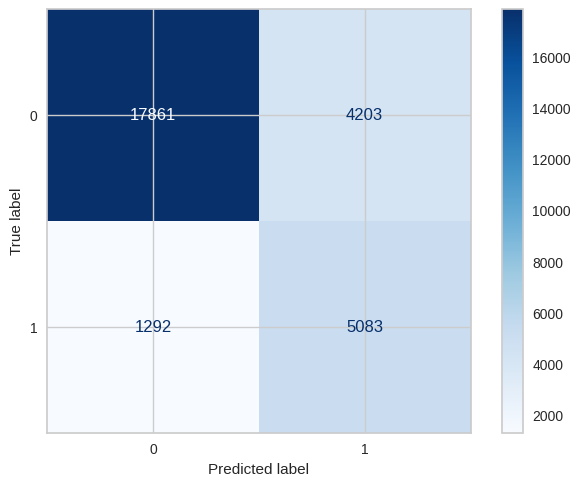

889/889 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Métrica custom (2*recall + precision)/3: 0.7140


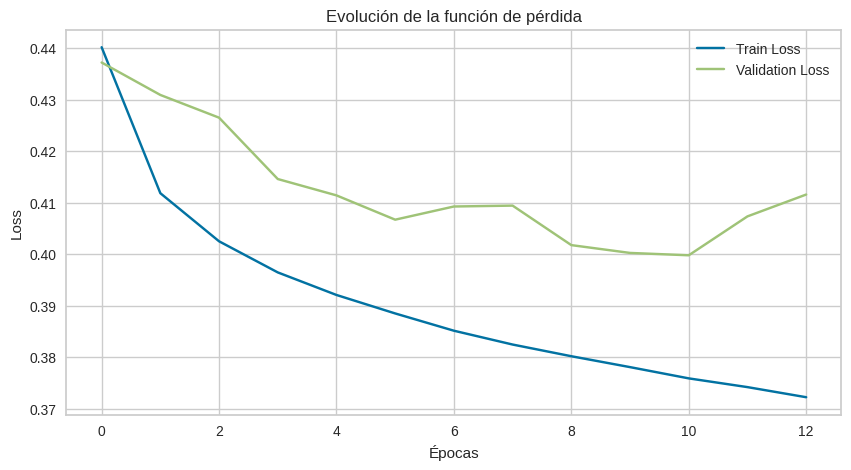

In [118]:

num_layers = best_params['num_layers']
units      = [best_params[f'units_{i}']      for i in range(num_layers)]
dropouts   = [best_params[f'dropout_{i}']    for i in range(num_layers)]
activs     = [best_params[f'activation_{i}'] for i in range(num_layers)]

# Instanciar y construir el modelo final
nn_best = NeuralNetwork(
    epochs=13,
    batch_size=best_params['batch_size'],
    learning_rate=best_params['learning_rate'],
    num_layers=num_layers,
    units=units,
    dropout_rates=dropouts,
    activations=activs
)
nn_best.build_model(input_shape=X_train_bal.shape[1])

# Entrenar el modelo
history = nn_best.train(X_train_bal, y_train_bal, X_valid, y_valid)

# Evaluar en el set de test y calcular la métrica custom
nn_best.evaluate(X_test, y_test)
y_pred_test_red = nn_best.predict(X_test)
custom = custom_metric(y_test, y_pred_test_red)
print(f"Métrica custom (2*recall + precision)/3: {custom:.4f}")

# Graficar la evolución de la función de pérdida
nn_best.plot_training(history)


Podemos observar que el modelo alcanza una métrica custom de 0.71. Además, el error en el conjunto de entrenamiento es levemente inferior al de validación, lo que indica que el modelo no presenta sobreajuste significativo y generaliza correctamente a nuevos datos.

## Explicabilidad

In [128]:
# Crear el explainer SHAP usando los datos ya transformados
explainer = shap.Explainer(nn_best.model, X_train_bal, feature_names=preprocesador.get_feature_names_out())


In [137]:
shap_values = explainer(X_test)


PermutationExplainer explainer: 28440it [43:31, 10.86it/s]                           


In [138]:
print(shap_values.values.shape)

(28439, 28)


Procedemos a imprimir el base value (valor base), es decir la predicción promedio del modelo antes de ver ninguna información de una observación en particular

In [139]:
# Acceder al valor base esperado de predicción
base = shap_values.base_values[0]
print("Base value (predicción promedio del modelo):", base)

Base value (predicción promedio del modelo): [0.49331215]


### Interpretabilidad local

Comparamos los graficos de fuerzas para las muestras de indice 0,1 y 2.

In [140]:
shap_values[0]
shap_values[1]
shap_values[2]

.values =
array([ 1.97802903e-02, -7.76089873e-03, -9.89165386e-03, -1.81568103e-02,
        1.75731755e-02,  4.28053490e-03,  2.65940015e-03, -1.38547043e-01,
        4.60987977e-01, -1.59803328e-03, -1.41624909e-02, -2.30167864e-02,
       -4.44474319e-03,  1.45395654e-02,  9.60877703e-03,  2.97134039e-04,
        4.54936268e-04, -1.07802840e-03,  2.13939527e-02, -4.90674304e-03,
        1.25812896e-01, -4.59665626e-03,  1.15223028e-03, -1.86483420e-03,
       -1.30797547e-02, -2.49501916e-03, -1.27003433e-02,  7.27051353e-03])

.base_values =
array([0.49331215])

.data =
array([ 0.18218583,  0.26581951,  0.98888245, -0.40653031,  0.88060277,
        0.68157539,  0.35642057, -1.51912651, -1.67174434, -0.68608071,
        0.75335276,  0.20802832, -0.05543237, -0.10352946,  0.17294125,
        1.        ,  0.        ,  0.        ,  1.        ,  0.        ,
        1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [141]:
print(type(shap_values))
if isinstance(shap_values, list):
    print("shap_values es una lista")
    print("Shape[0]:", shap_values[0].shape)
else:
    print("Shape:", shap_values.shape)
print("X_test shape:", X_test.shape)

<class 'shap._explanation.Explanation'>
Shape: (28439, 28)
X_test shape: (28439, 28)


In [142]:
shap.initjs()
# Gráfico de fuerza para índices 0, 1 y 2
for index in [0, 1, 2]:
    print(f"\nSHAP Force Plot para observación {index}")
    display(shap.force_plot(
        shap_values.base_values[index],
        shap_values.values[index],
        X_test.iloc[index],
      feature_names=preprocesador.get_feature_names_out()
  ))


SHAP Force Plot para observación 0



SHAP Force Plot para observación 1



SHAP Force Plot para observación 2


En los ***gráficos de fuerza*** de las muestras tomadas podemos observar el valor base a la izquierda y el valor final de la predicción a la derecha después de aplicarle todas las contribuciones SHAP. Observamos como cada flecha representa una variable y cómo contribuye a la predicción.
Las variables que empujan hacia la derecha (rojo) aumentan la predicción (probabilidad de lluvia). Las vaiables que empujan hacia la izquierda reducen dicha predicción.
De la observación de los tamaños de las flechas mostradas podemos determinar cuan imprtante fué esa variable en la observación.
De allí:
- Observación 0: Gran contribución positva de las horas de sol y negativa de la humedad a las 3pm.
- Observación 1: Gran contribución positiva de la humedad a las 3pm y negativa de la presión a las 9am.
- Observación 2: Gran contribución positiva de la presión a las 3pm y negativa de la presión a las 9am.

Realizamos gráfico de cascada y barras para las muestras de indice 0,1 y 2.

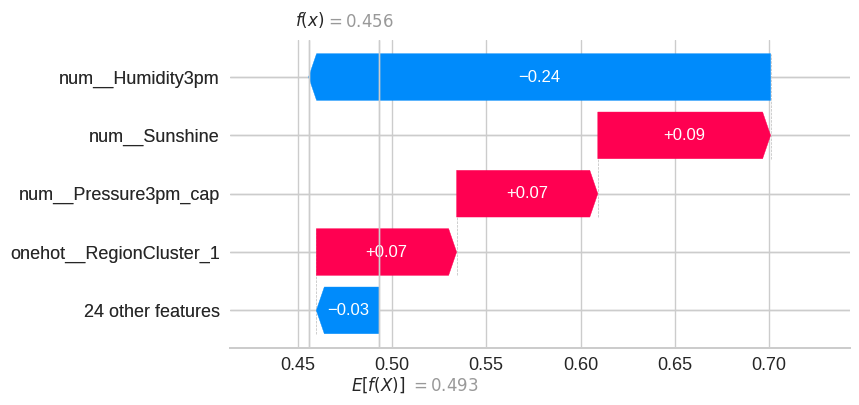

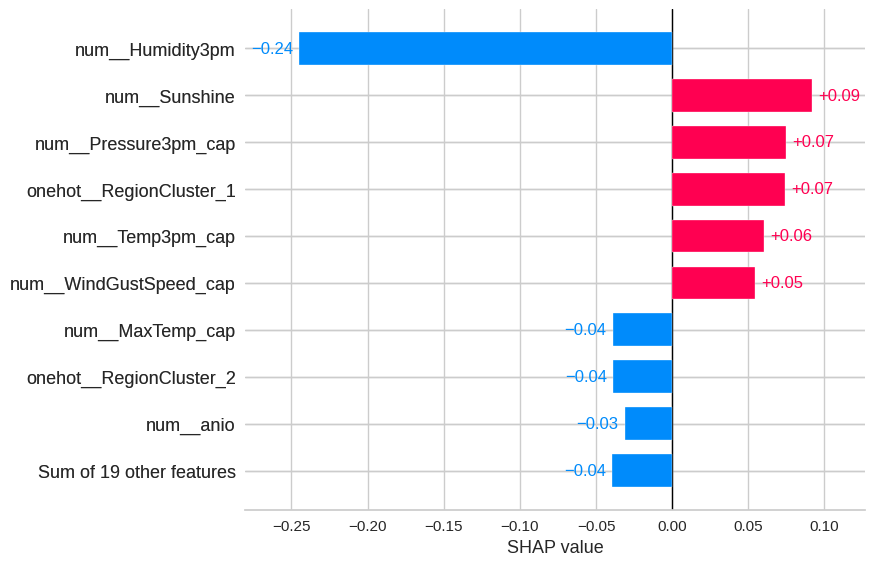

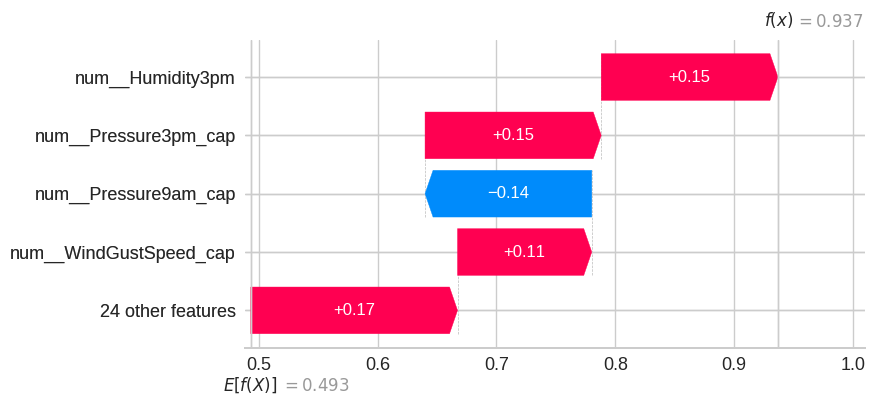

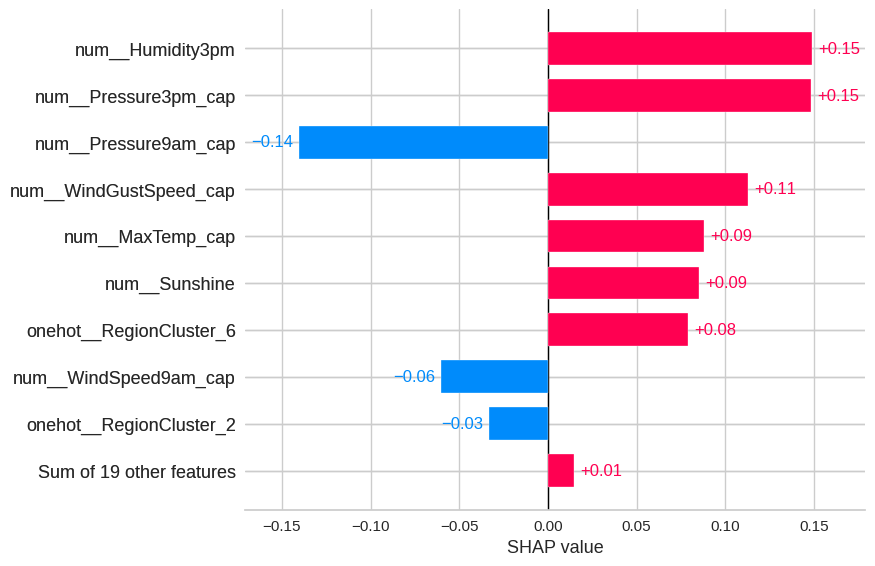

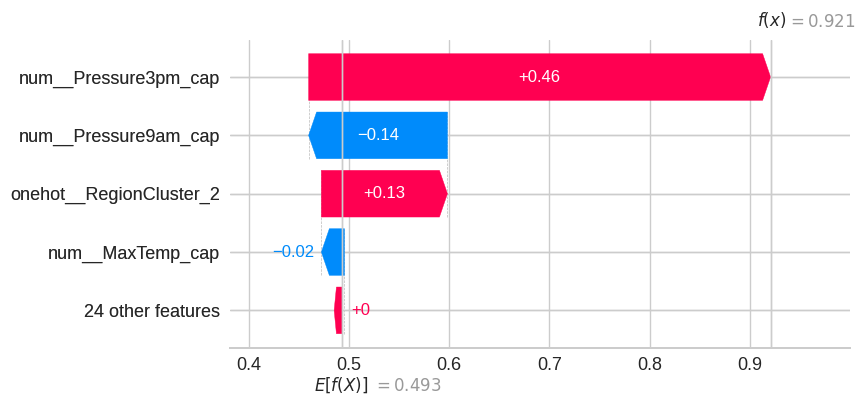

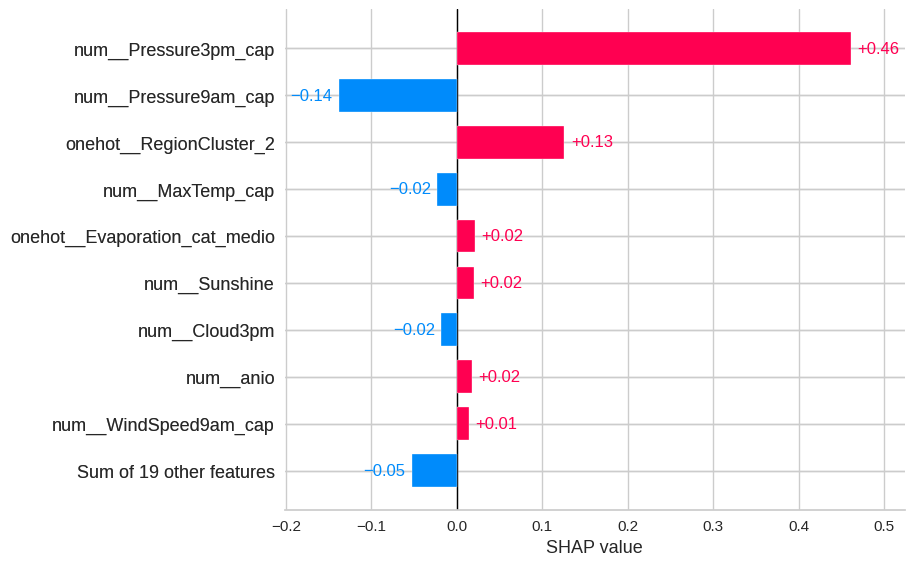

In [143]:
for index in [0, 1, 2]:
    explanation = shap.Explanation(
        values=shap_values.values[index],
        base_values=shap_values.base_values[index],
        feature_names=preprocesador.get_feature_names_out()
    )

    shap.plots.waterfall(explanation, max_display=5)
    shap.plots.bar(explanation)

En los gráficos de cascada y barras presentados podemos complementar la información extraída de los gráficos de fuerza. En el gráfico de cascada partimos del base value que determinamos y desde allí podemos ver, cómo cada feature contribuye a la predicción final que estamos analizando. Vemos con barras azules la contribución de variables que disminuyen la predicción y con barras rojas (y su valor) las variables que aumentan la predicción, para llegar así al valor predicho. Por su parte, el gráfico de barras complementa la explicación mostrando en forma ordenada la magnitud absoluta por la que influyeron cada una de las variables analizadas previamente.

### Interpretabilidad global

Analizamos la explicabilidad de manera global.

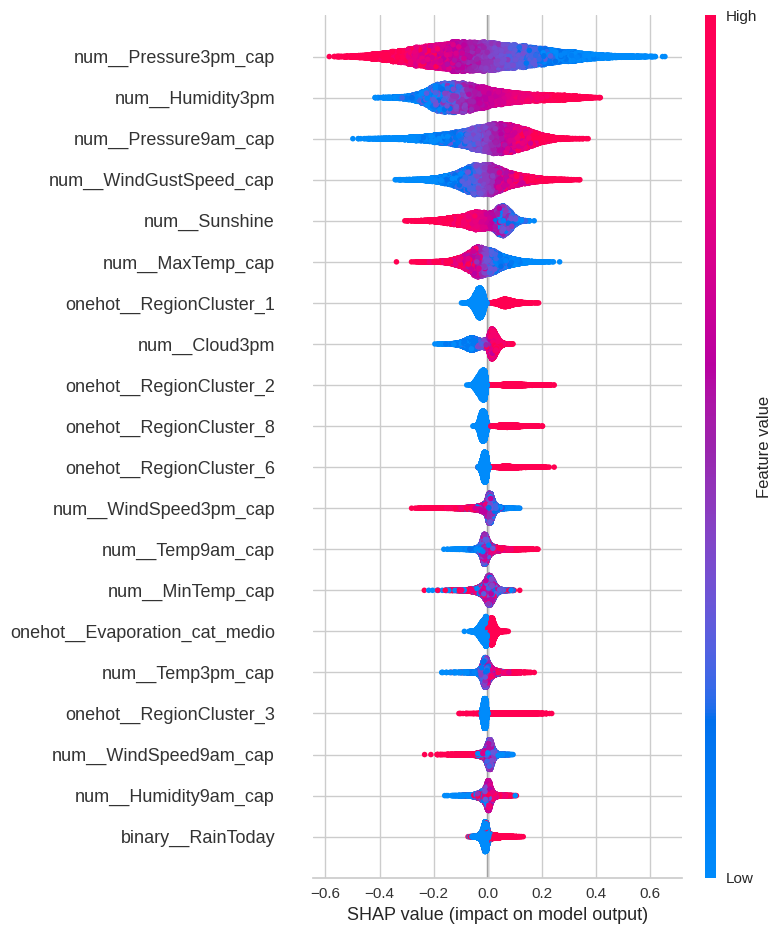

In [144]:
# Grafico resumen de importancia de variables
shap.summary_plot(shap_values.values, X_test, feature_names=preprocesador.get_feature_names_out())


A partir del gráfico visualizamos el impacto individual de cada feature en las predicciones del modelo.
- Presión 3pm: Feature más influyente. Valores altos de presión (rojo) tienden a mover la predicción hacia NO va a llover (valores SHAP negativos). Valores bajos de presión (azul) tienden a aumentar la probabilidad de lluvia.
- Humedad 3pm: Valores altos contribuyen a predecir lluvia (valores SHAP positivos).
- Presión 9 am:  Valores altos contribuyen a predecir lluvia (valores SHAP positivos).
- Velocidad del viento: Ráfagas más fuertes están asociadas con mayor probabilidad de lluvia.



In [152]:
expected_value = shap_values.values.mean()

explanation = shap.Explanation(
    values=shap_values.values,
    base_values=shap_values.base_values,
    feature_names=preprocesador.get_feature_names_out(),
    data=X_test
)

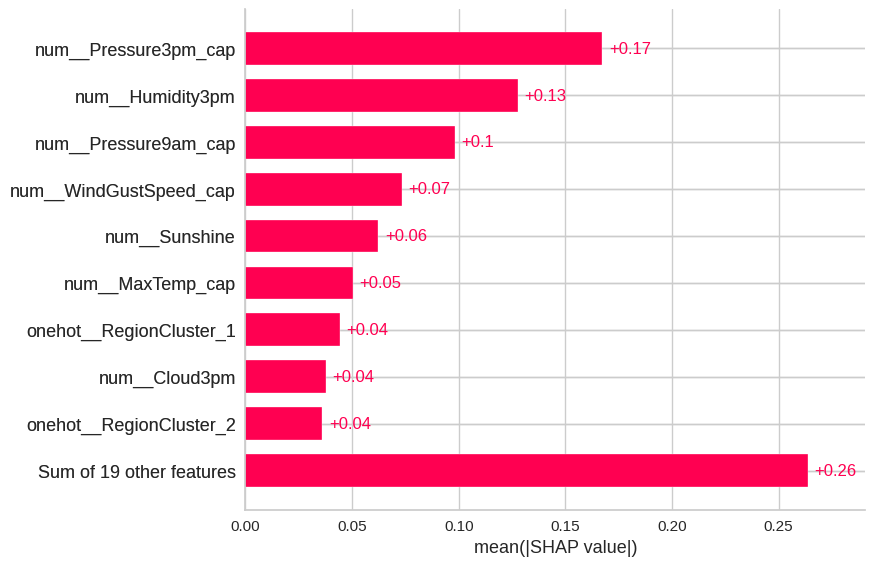

In [150]:
shap.plots.bar(explanation)

A partir de este gráfico podemos determinar cuáles son las variables más importantes para el modelo y su orden de importancia. De este modo, las 5 variables más importantes en promedio son:


*   Presión a las 3pm
*   Humedad a las 3pm
*   Presión a las 9am
*   Velocidad del viento
*   Horas de sol

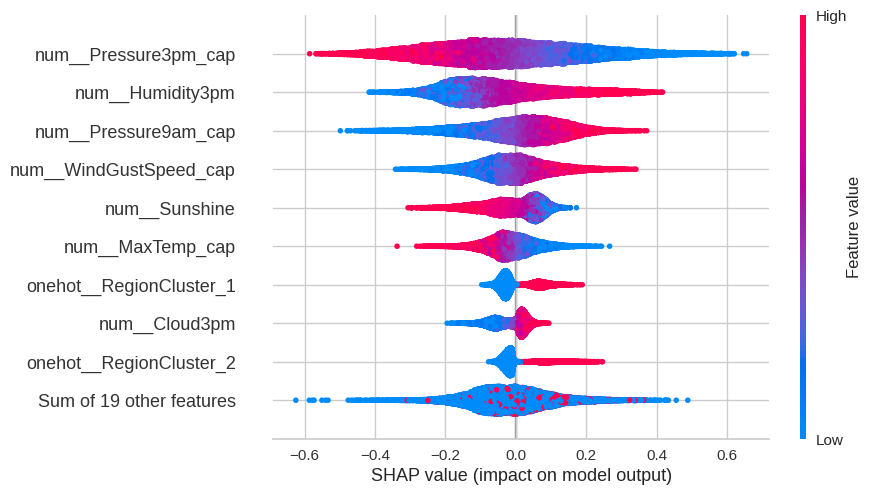

In [153]:
shap.plots.beeswarm(explanation)

Observamos que las variables meteorológicas numéricas (presión, humedad, sol, viento) son las más importantes.
El modelo aprendió patrones lógicos desde el punto de vista meteorológico:
***humedad alta + presión baja (3pm) + menos sol + ráfagas fuertes = más probabilidad de lluvia.***

# Comparacion de modelos

Procedemos a comparar las métricas de el modelo con optimización de hiperparámetros con regularización y ajuste de umbral, el modelo de AutoML, el generado por Redes Neuronales y el modelo base.

<Figure size 400x400 with 0 Axes>

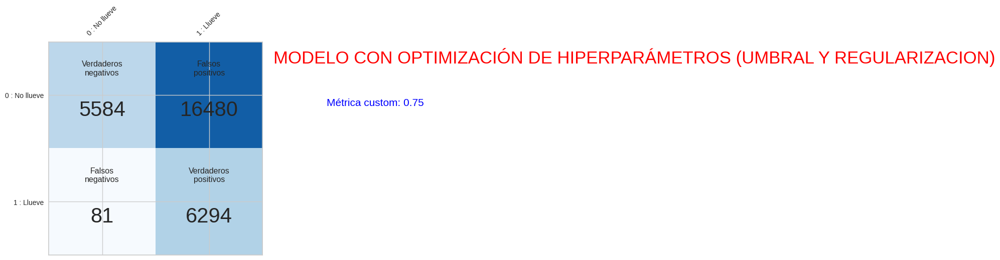

              precision    recall  f1-score   support

           0       0.99      0.25      0.40     22064
           1       0.28      0.99      0.43      6375

    accuracy                           0.42     28439
   macro avg       0.63      0.62      0.42     28439
weighted avg       0.83      0.42      0.41     28439



In [154]:
matriz_de_confusion(y_test, y_pred_test_op, "MODELO CON OPTIMIZACIÓN DE HIPERPARÁMETROS (UMBRAL Y REGULARIZACION)")
print(classification_report(y_test, y_pred_test_op))

<Figure size 400x400 with 0 Axes>

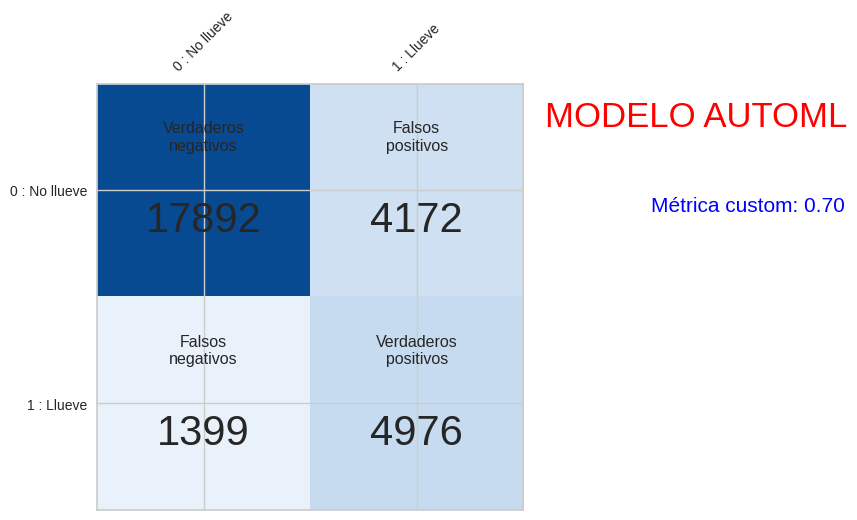

              precision    recall  f1-score   support

           0       0.93      0.81      0.87     22064
           1       0.54      0.78      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.74      0.80      0.75     28439
weighted avg       0.84      0.80      0.82     28439



In [155]:
matriz_de_confusion(y_true_aml, y_pred_aml, "MODELO AUTOML")
print(classification_report(y_true_aml, y_pred_aml))

<Figure size 400x400 with 0 Axes>

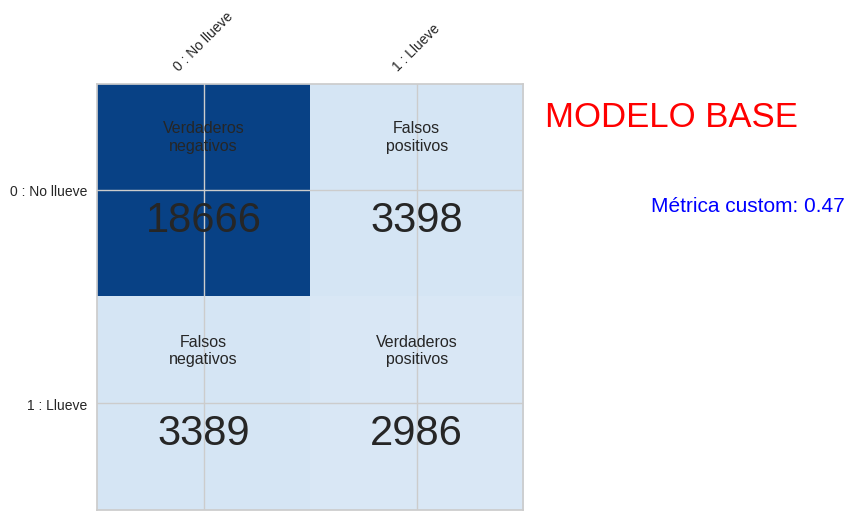

              precision    recall  f1-score   support

           0       0.85      0.85      0.85     22064
           1       0.47      0.47      0.47      6375

    accuracy                           0.76     28439
   macro avg       0.66      0.66      0.66     28439
weighted avg       0.76      0.76      0.76     28439



In [156]:
matriz_de_confusion(y_test, y_predbase, "MODELO BASE")
print(classification_report(y_test, y_predbase))

<Figure size 400x400 with 0 Axes>

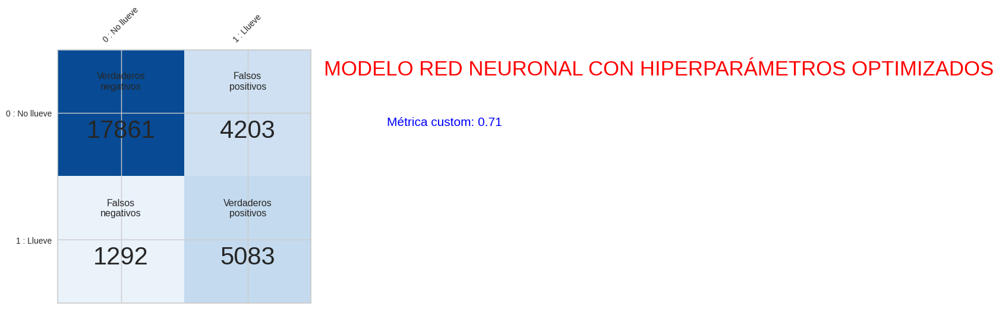

              precision    recall  f1-score   support

           0       0.93      0.81      0.87     22064
           1       0.55      0.80      0.65      6375

    accuracy                           0.81     28439
   macro avg       0.74      0.80      0.76     28439
weighted avg       0.85      0.81      0.82     28439



In [157]:
matriz_de_confusion(y_test, y_pred_test_red, "MODELO RED NEURONAL CON HIPERPARÁMETROS OPTIMIZADOS")
print(classification_report(y_test, y_pred_test_red))

De la comparación de modelos podemos concluir que los distintos enfoques implementados mejoran significativamente las métricas respecto al modelo base. Entre todos los modelos, el que combina regularización, ajuste de umbral y optimización de hiperparámetros es el que más se acerca al rendimiento deseado. Este modelo logra aumentar considerablemente el recall de la clase 1 (recall = 0.92) —es decir, detecta correctamente el 92% de los casos en los que realmente llueve—, aunque esto se logra a costa de reducir el recall de la clase 0 (recall = 0.60) y la precisión de la clase 1 (precision = 0.40). En otras palabras, solo en el 40% de las veces que el modelo predice lluvia, efectivamente llueve.

Este balance se refleja en el valor obtenido por la métrica custom (custom = 0.75), priorizando el recall de la clase minoritaria. Por su parte, tanto el modelo de AutoML como el de redes neuronales con ajuste de hiperparámetros obtienen resultados muy similares (custom = 0.71), aunque siguen siendo inferiores al modelo optimizado en umbral y regularización.

En resumen, la optimización específica del umbral y el parámetro de regularización permite construir un modelo mejor alineado con el objetivo del problema: maximizar la detección de lluvias, aun sacrificando cierta precisión. Dependiendo del caso de uso, se podría modificar la métrica a priorizar, pudiendo ser otro de los modelos el que mejor se adapte a la búsqueda.